# Complete analysis and treatment of Vertical MD4224 scan

In [1]:
import sys
import gzip
import glob
import pickle
import pandas as pd
import numpy as np
import scipy.io as sio 

sys.path.append('/eos/user/s/sterbini/MD_ANALYSIS/public/')
sys.path.append('/eos/project/l/liu/Toolbox/')

from myToolbox import *
from math import log10, floor
from scipy.signal import savgol_filter
from scipy.interpolate import interp1d
import matplotlib.cm as cm
import matplotlib.gridspec as gridspec

Version 0.03. This is the latest version.
Please help me to improve it reporting bugs to guido.sterbini@cern.ch.
Your platform is Linux-3.10.0-1062.1.2.el7.x86_64-x86_64-with-centos-7.6.1810-Core
Your folder is /eos/home-h/harafiqu/SWAN_projects/PS/From_Scratch/V_Optimised
Your IP is 172.17.0.12
2019-10-31 09:51:30


In [2]:
%run ../MD_Functions.ipynb


	Importing MD Analysis functions for MD4224


### Import MD files

In [3]:
myFiles=glob.glob('/eos/user/h/harafiqu/MD4224/2018.09.05_vertical/2018*.mat')
len(myFiles)

450

### Convert matlab files to dataframe

In [4]:
# Convert mat files to dataframe
df_test = fromMatlabToDataFrame(myFiles,['PR_BQS72.SamplerAcquisition.value.estimatedTuneV','PR_BQS72.SamplerAcquisition.value.estimatedTuneH','PR_BQS72.SamplerAcquisition.cycleStamp','PR_BCT_ST.Samples.value.samples','PR_BCT_ST.Samples.cycleStamp'])

In [5]:
# cleanup dataframe
df_test['PR_BCT_ST.Samples.cycleStamp']=df_test['PR_BCT_ST.Samples.cycleStamp']/1e9
df_test['PR_BQS72.SamplerAcquisition.cycleStamp']=df_test['PR_BQS72.SamplerAcquisition.cycleStamp']/1e9

In [6]:
df_test

,cycleStamp,matlabPLS,matlabFilePath,PR_BQS72.SamplerAcquisition.value.estimatedTuneV,PR_BQS72.SamplerAcquisition.cycleStamp,PR_BCT_ST.Samples.cycleStamp,PR_BCT_ST.Samples.value.samples,PR_BQS72.SamplerAcquisition.value.estimatedTuneH
2018-09-05 10:20:30.700,1.536143e+18,CPS.USER.MD1,/eos/user/h/harafiqu/MD4224/2018.09.05_vertica...,"[0.2391116740353679, 0.23971673231960905, 0.23...",1.536136e+09,1.536136e+09,"[-0.16468000000000002, -0.15378, -0.1374300000...","[0.20977273575518698, 0.20940702780573384, 0.2..."
2018-09-05 10:21:06.700,1.536143e+18,CPS.USER.MD1,/eos/user/h/harafiqu/MD4224/2018.09.05_vertica...,"[0.23976878434647172, 0.24005858967109586, 0.2...",1.536136e+09,1.536136e+09,"[-0.16468000000000002, -0.15378, -0.1374300000...","[0.20904288280545877, 0.2091414764329, 0.20907..."
2018-09-05 10:20:30.700,1.536143e+18,CPS.USER.MD1,/eos/user/h/harafiqu/MD4224/2018.09.05_vertica...,"[0.23979297109117814, 0.23927600776361443, 0.2...",1.536136e+09,1.536136e+09,"[-0.21493, -0.20040000000000002, -0.18587, -0....","[0.20910096986069623, 0.20919447601635738, 0.2..."
2018-09-05 10:21:06.700,1.536143e+18,CPS.USER.MD1,/eos/user/h/harafiqu/MD4224/2018.09.05_vertica...,"[0.22984427276260058, 0.23000876451501565, 0.2...",1.536136e+09,1.536136e+09,"[-0.19495, -0.18526, -0.17436000000000001, -0....","[0.20900025780414888, 0.20880781328871953, 0.2..."
2018-09-05 10:21:42.700,1.536143e+18,CPS.USER.MD1,/eos/user/h/harafiqu/MD4224/2018.09.05_vertica...,"[0.21960233799140136, 0.21974349999447174, 0.2...",1.536136e+09,1.536136e+09,"[-0.14228000000000002, -0.13138000000000002, -...","[0.20920446730191952, 0.20915974993014785, 0.2..."
2018-09-05 10:22:18.700,1.536143e+18,CPS.USER.MD1,/eos/user/h/harafiqu/MD4224/2018.09.05_vertica...,"[0.2102815567691356, 0.20942227306900782, 0.20...",1.536136e+09,1.536136e+09,"[-0.13864, -0.12593000000000001, -0.1150300000...","[0.20715974144784158, 0.20999031660603723, 0.2..."
2018-09-05 10:22:54.700,1.536143e+18,CPS.USER.MD1,/eos/user/h/harafiqu/MD4224/2018.09.05_vertica...,"[0.19871366825637893, 0.1989663926550141, 0.20...",1.536136e+09,1.536136e+09,"[-0.19676000000000002, -0.18345, -0.17013, -0....","[0.2100921495539858, 0.20985952297053748, 0.20..."
2018-09-05 10:23:30.700,1.536143e+18,CPS.USER.MD1,/eos/user/h/harafiqu/MD4224/2018.09.05_vertica...,"[0.1899620637501338, 0.1906069731650187, 0.189...",1.536136e+09,1.536136e+09,"[-0.21372000000000002, -0.20040000000000002, -...","[0.20933471986513602, 0.20873250795510992, 0.2..."
2018-09-05 10:24:06.700,1.536143e+18,CPS.USER.MD1,/eos/user/h/harafiqu/MD4224/2018.09.05_vertica...,"[0.18002022523528952, 0.1798854030479251, 0.18...",1.536136e+09,1.536136e+09,"[-0.16226000000000002, -0.15499000000000002, -...","[0.20916809409599718, 0.2091351622165313, 0.20..."
2018-09-05 10:24:42.700,1.536143e+18,CPS.USER.MD1,/eos/user/h/harafiqu/MD4224/2018.09.05_vertica...,"[0.171126744770092, 0.17001407402332383, 0.171...",1.536136e+09,1.536136e+09,"[-0.12714, -0.11564, -0.10716, -0.089000000000...","[0.20855192735048142, 0.20957426025888468, 0.2..."


In [7]:
# Check cyclestamp differences

# Iterate over each row in the dataframe
differences = []
for index, row in df_test.iterrows():
    difference = (row['PR_BCT_ST.Samples.cycleStamp'] - row['PR_BQS72.SamplerAcquisition.cycleStamp'])/row['PR_BCT_ST.Samples.cycleStamp']
    differences.append(difference)
    
print 'Difference between BCT and BQS73 cycle times (percentage) \n Mean:', np.mean(differences),' Min:',np.min(differences),' Max:', np.max(differences)

# Iterate over each row in the dataframe
differences = []
for index, row in df_test.iterrows():
    difference = (row['cycleStamp'] - (row['PR_BCT_ST.Samples.cycleStamp']*1E9))/row['cycleStamp']
    differences.append(difference)
    
print '\nDifference between BCT and cyclestamp cycle times (percentage) \n Mean:', np.mean(differences),' Min:',np.min(differences),' Max:', np.max(differences)

Difference between BCT and BQS73 cycle times (percentage) 
 Mean: 2.23347503095737e-11  Min: 0.0  Max: 1.0050637639308164e-08

Difference between BCT and cyclestamp cycle times (percentage) 
 Mean: 4.68740573399049e-06  Min: 4.687012369152908e-06  Max: 4.735469788809376e-06


In [8]:
df_bct = fromMatlabToDataFrame(myFiles,['PR_BCT_ST.Samples.value.samples','PR_BCT_ST.Samples.cycleStamp', 'PR_SCBFC.Samples.value.samples'])
df_bqs72 = fromMatlabToDataFrame(myFiles,['PR_BQS72.SamplerAcquisition.value.estimatedTuneV','PR_BQS72.SamplerAcquisition.value.estimatedTuneH','PR_BQS72.SamplerAcquisition.cycleStamp'])

In [9]:
df_first = pnd.merge(df_bct, df_bqs72, left_on = 'PR_BCT_ST.Samples.cycleStamp',  right_on = 'PR_BQS72.SamplerAcquisition.cycleStamp')

In [10]:
# Have to convert this for unknown reason (myToolbox.unixtime2datetimeVectorize expects this converted cycleStamp)
df_first['PR_BCT_ST.Samples.cycleStamp']=df_first['PR_BCT_ST.Samples.cycleStamp']/1e9
# copy to new column
df_first['cf_cycleStamp']=df_first['PR_BCT_ST.Samples.cycleStamp']
# rename BCT cyclestamp to cycleStamp
df_first = df_first.rename(index=str, columns={"PR_BCT_ST.Samples.cycleStamp" : "cycleStamp", })
# convert to datetime
#df_first['PR_BCT_ST.Samples.cycleStamp']=df_first['cycleStamp'].apply(myToolbox.unixtime2datetimeVectorize)
df_first['cf_timeStamp'] = df_first['cycleStamp'].apply(myToolbox.unixtime2datetimeVectorize)
#df_first['cf_timeStamp']=df_first['timeStamp']
# Set index
df_first = df_first.set_index(['cycleStamp'])
df_first = df_first.drop(labels='matlabFilePath_x',axis='columns')
df_first = df_first.drop(labels='matlabFilePath_y',axis='columns')
df_first = df_first.drop(labels='cycleStamp_x',axis='columns')
df_first = df_first.drop(labels='cycleStamp_y',axis='columns')
df_first = df_first.drop(labels='matlabPLS_y',axis='columns')
df_first = df_first.drop(labels='matlabPLS_x',axis='columns')
df_first = df_first.drop(labels='PR_BQS72.SamplerAcquisition.cycleStamp',axis='columns')
#df_first = df_first.drop(labels='PR_BCT_ST.Samples.cycleStamp',axis='columns')

In [11]:
df_first['Qx']=df_first.apply(lambda x: np.nanmean(x['PR_BQS72.SamplerAcquisition.value.estimatedTuneH'][20:280]),axis=1)
df_first['Qy']=df_first.apply(lambda x: np.nanmean(x['PR_BQS72.SamplerAcquisition.value.estimatedTuneV'][20:280]),axis=1)

In [12]:
# Remove anomalous cases etc
#df_first = df_first.drop(df_first[df_first['Qx'] < .295].index )
df_first = df_first.dropna(axis=0,how='all',subset =['Qy'])
df_first = df_first.dropna(axis=0,how='all',subset =['Qx'])
df_first = df_first.drop(labels='PR_BQS72.SamplerAcquisition.value.estimatedTuneV',axis='columns')
df_first = df_first.drop(labels='PR_BQS72.SamplerAcquisition.value.estimatedTuneH',axis='columns')
#df_mergetest

In [13]:
df_first

,PR_BCT_ST.Samples.value.samples,PR_SCBFC.Samples.value.samples,cf_cycleStamp,cf_timeStamp,Qx,Qy
cycleStamp,,,,,,
1.536136e+09,"[-0.16468000000000002, -0.15378, -0.1374300000...","[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...",1.536136e+09,2018-09-05 10:19:54.700,0.208865,0.239484
1.536136e+09,"[-0.16468000000000002, -0.15378, -0.1374300000...","[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...",1.536136e+09,2018-09-05 10:19:54.700,0.208865,0.239484
1.536136e+09,"[-0.21493, -0.20040000000000002, -0.18587, -0....","[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...",1.536136e+09,2018-09-05 10:20:30.700,0.208899,0.239078
1.536136e+09,"[-0.19495, -0.18526, -0.17436000000000001, -0....","[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...",1.536136e+09,2018-09-05 10:21:06.700,0.208694,0.229331
1.536136e+09,"[-0.14228000000000002, -0.13138000000000002, -...","[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...",1.536136e+09,2018-09-05 10:21:42.700,0.208412,0.219715
1.536136e+09,"[-0.13864, -0.12593000000000001, -0.1150300000...","[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...",1.536136e+09,2018-09-05 10:22:18.700,0.208581,0.209510
1.536136e+09,"[-0.19676000000000002, -0.18345, -0.17013, -0....","[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...",1.536136e+09,2018-09-05 10:22:54.700,0.208356,0.199719
1.536136e+09,"[-0.21372000000000002, -0.20040000000000002, -...","[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...",1.536136e+09,2018-09-05 10:23:30.700,0.208183,0.189839
1.536136e+09,"[-0.16226000000000002, -0.15499000000000002, -...","[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...",1.536136e+09,2018-09-05 10:24:06.700,0.208225,0.179881


In [14]:
# Check chirp time
test = myToolbox.japcMatlabImport(myFiles[0])
test.PR_BQS72.SamplerAcquisition.value.acqOffset

20

# Plot Cycle etc

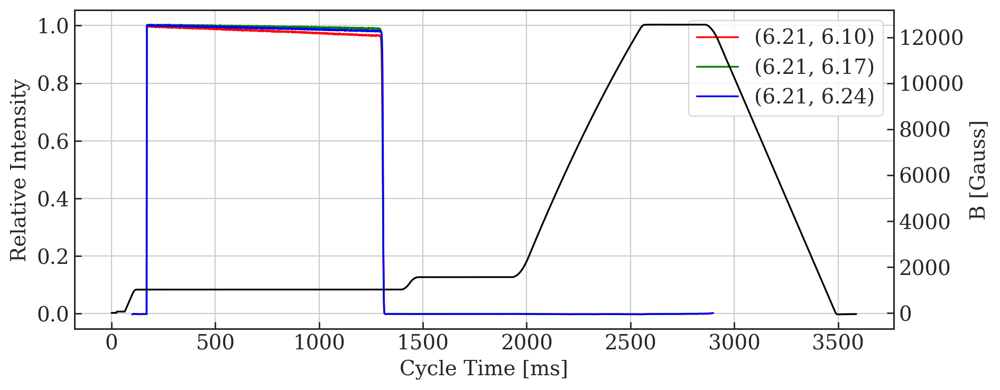

In [15]:
# plot 'PR_BCT_ST.Samples.value.samples'
fig, ax1 = plt.subplots(figsize=(10, 4), dpi= 200, facecolor='w', edgecolor='k')

points = len(df_first['PR_BCT_ST.Samples.value.samples'].iloc()[0])
x_data = np.linspace(100, points+100, points)

ax1.plot(x_data, df_first['PR_BCT_ST.Samples.value.samples'].iloc()[16] / df_first['PR_BCT_ST.Samples.value.samples'].iloc()[16][70],'r-', label='(6.21, 6.10)')
ax1.plot(x_data, df_first['PR_BCT_ST.Samples.value.samples'].iloc()[8] / df_first['PR_BCT_ST.Samples.value.samples'].iloc()[8][70],'g-', label='(6.21, 6.17)')
ax1.plot(x_data, df_first['PR_BCT_ST.Samples.value.samples'].iloc()[0] / df_first['PR_BCT_ST.Samples.value.samples'].iloc()[0][70],'b-', label='(6.21, 6.24)')

ax1.set_xlabel('Cycle Time [ms]')
#ax1.set_xlim(0,1600)
ax1.set_ylabel('Relative Intensity')
#ax1.tick_params(axis='y', labelcolor='r')

ax2 = ax1.twinx()
ax2.set_ylabel('B [Gauss]')

ax2.plot(df_first['PR_SCBFC.Samples.value.samples'].iloc()[0], 'k-')
#ax1.tick_params(axis='y', labelcolor='b')

ax1.grid()
#ax2.grid()
ax1.legend(loc = 1)
# plt.title('Vertical Scan: BCT')
fig.savefig('MD4224_Vertical_Intensity_Magnetic_Cycle.png')

wirescanner half time =  0.57175  ms


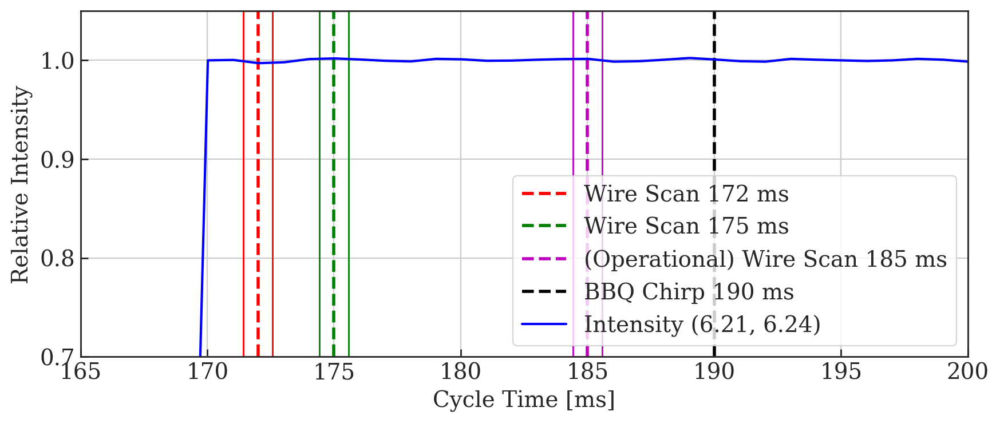

In [16]:
turn_time = 2.287E-3 # in ms
ws_time = 500 * turn_time
t_ws = ws_time/2

print 'wirescanner half time = ', t_ws, ' ms'
# plot 'PR_BCT_ST.Samples.value.samples'
fig, ax1 = plt.subplots(figsize=(10, 4), dpi= 200, facecolor='w', edgecolor='k')
ax1.grid()

ws_y = [-0.05, 1.05] 
ws_172 = [172, 172]
ws_175 = [175, 175]
ws_185 = [185, 185]
chirp = [190, 190]

ax1.plot(ws_172, ws_y, label='Wire Scan 172 ms', color='r', lw=2, ls='--')
ax1.plot(ws_175, ws_y, label='Wire Scan 175 ms', color='green', lw=2, ls='--')
ax1.plot(ws_185, ws_y, label='(Operational) Wire Scan 185 ms', color='m', lw=2, ls='--')
ax1.plot(chirp, ws_y, label='BBQ Chirp 190 ms', color='k', lw=2, ls='--')

points = len(df_first['PR_BCT_ST.Samples.value.samples'].iloc()[0])
x_data = np.linspace(100, points+100, points)

ax1.plot(x_data, df_first['PR_BCT_ST.Samples.value.samples'].iloc()[0] / df_first['PR_BCT_ST.Samples.value.samples'].iloc()[0][70],'b-', label='Intensity (6.21, 6.24)', lw=1.5)
#ax1.plot(x_data, df_first['PR_BCT_ST.Samples.value.samples'].iloc()[8] / df_first['PR_BCT_ST.Samples.value.samples'].iloc()[8][70],'r-', label='(6.21, 6.17)')
#ax1.plot(x_data, df_first['PR_BCT_ST.Samples.value.samples'].iloc()[16] / df_first['PR_BCT_ST.Samples.value.samples'].iloc()[16][70],'g-', label='(6.21, 6.10)')

rect1 = patches.Rectangle((172-t_ws, 0.7), 2*t_ws, 0.35, angle=0.0, linewidth=1,edgecolor='r',facecolor='none')
rect2 = patches.Rectangle((175-t_ws, 0.7), 2*t_ws, 0.35, angle=0.0, linewidth=1,edgecolor='green',facecolor='none')
rect3 = patches.Rectangle((185-t_ws, 0.7), 2*t_ws, 0.35, angle=0.0, linewidth=1,edgecolor='m',facecolor='none')

ax1.add_patch(rect1)
ax1.add_patch(rect2)
ax1.add_patch(rect3)

ax1.set_xlabel('Cycle Time [ms]')
ax1.set_ylabel('Relative Intensity')


plt.xlim(165, 200)
plt.ylim(0.70, 1.05)

#ax2.grid()
ax1.legend(loc = 4)

# plt.title('Vertical Scan: BCT')
fig.savefig('MD4224_Vertical_WS_Times.png')

# Intensity, Losses, Ratio

In [17]:
df_second=intensity_df(df_first,start=70,end=1185)

In [18]:
df_second = df_second.drop(labels='PR_BCT_ST.Samples.value.samples',axis='columns');
df_second = df_second.set_index(['cf_timeStamp']);
df_second

,PR_SCBFC.Samples.value.samples,cf_cycleStamp,Qx,Qy,intensity,losses,ratio
cf_timeStamp,,,,,,,
2018-09-05 10:19:54.700,"[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...",1.536136e+09,0.208865,0.239484,7.023244e+11,2.106413,0.978936
2018-09-05 10:19:54.700,"[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...",1.536136e+09,0.208865,0.239484,7.023244e+11,2.106413,0.978936
2018-09-05 10:20:30.700,"[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...",1.536136e+09,0.208899,0.239078,7.548161e+11,1.698342,0.983017
2018-09-05 10:21:06.700,"[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...",1.536136e+09,0.208694,0.229331,7.327544e+11,2.203742,0.977963
2018-09-05 10:21:42.700,"[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...",1.536136e+09,0.208412,0.219715,6.951734e+11,2.985061,0.970149
2018-09-05 10:22:18.700,"[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...",1.536136e+09,0.208581,0.209510,7.361018e+11,3.982576,0.960174
2018-09-05 10:22:54.700,"[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...",1.536136e+09,0.208356,0.199719,7.079539e+11,2.690493,0.973095
2018-09-05 10:23:30.700,"[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...",1.536136e+09,0.208183,0.189839,7.265163e+11,1.429472,0.985705
2018-09-05 10:24:06.700,"[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...",1.536136e+09,0.208225,0.179881,7.214954e+11,0.909661,0.990903


### Check for duplicates

In [19]:
df_second = df_second.drop(df_second.index[0])
df_second[df_second.index.duplicated()]

,PR_SCBFC.Samples.value.samples,cf_cycleStamp,Qx,Qy,intensity,losses,ratio
cf_timeStamp,,,,,,,


### Plot Intensity, Losses, Ratio

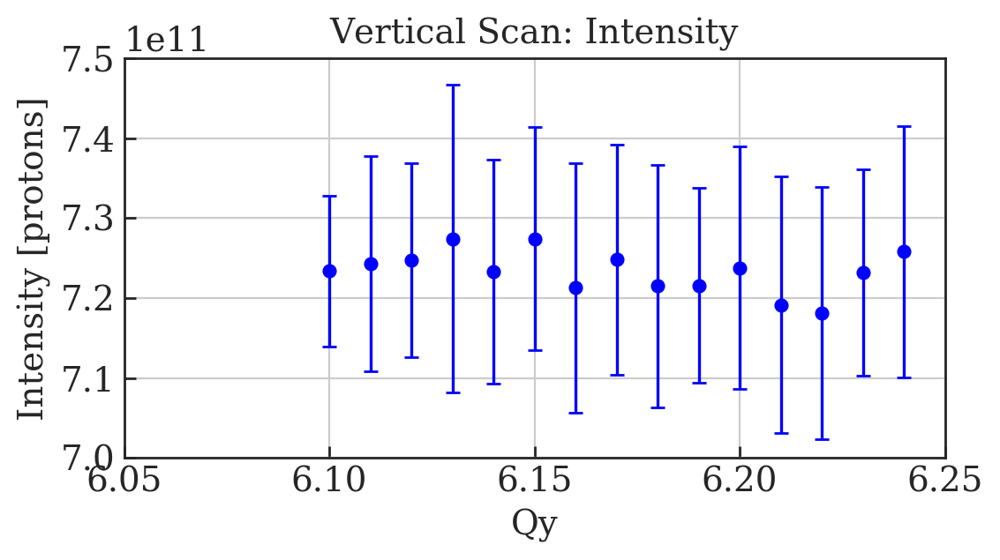

In [20]:
# Plot averaged data points with error bars
x_data = np.linspace(610, 624, 15);
x_data = x_data/100;

y_data_172 = []
y_data_175 = []
y_data_185 = []

y_error_172 = []
y_error_175 = []
y_error_185 = []

for i in x_data:
    
    upper_lim = i+0.0049999999999 - 6
    lower_lim = i-0.0049999999999 - 6
    
    y_data_172.append( np.mean( df_second['intensity'][(df_second['Qy']>lower_lim)][(df_second['Qy']<upper_lim)] ) )
    
    y_error_172.append( np.std( df_second['intensity'][(df_second['Qy']>lower_lim)][(df_second['Qy']<upper_lim)] ) )
    
    
fig=plt.figure(figsize=(6, 3), dpi= 200, facecolor='w', edgecolor='k');

plt.errorbar(x_data, y_data_172, y_error_172, linestyle='None', marker='o', capsize=3, color='b')

x_d = np.linspace(6.0, 7.0, 2)
y_d = (7.25E11, 7.25E11)
#plt.plot(x_d, y_d, 'r-', label='7.25E11')

plt.xlabel('Qy');
plt.ylabel('Intensity [protons]');
plt.title('Vertical Scan: Intensity')
plt.ylim(70E10,75E10)
plt.xlim(6.05, 6.25)
#plt.legend()
plt.grid();
fig.savefig('MD4224_Complete_Vertical_Intensities_Errors.png');

# Timber: Vertical

In [21]:
dfV=read_data(year=2018,date=5,month=9,hour=10,minutes=0,span=5,user='CPS%MD1',WS='64.V');

In [22]:
len(dfV)

432

In [23]:
dfV

,PR.BWS.64.V_ROT:ACQ_DELAY,PR.BWS.64.V_ROT:PROF_POSITION_IN,PR.BCT.LT:SAMPLES,PR.BWS.64.V_ROT:PROF_DATA_IN,cycleStamp
2018-09-05 10:12:06.700,172.0,"[50000.0, 50000.0, 50000.0, 50000.0, 50000.0, ...","[-0.14046, -0.13017, -0.11988, -0.1005, -0.082...","[0.173502430703752, 0.17229545882224, 0.172095...",1.536142e+18
2018-09-05 10:12:42.700,172.0,"[50000.0, 50000.0, 50000.0, 50000.0, 50000.0, ...","[-0.20706, -0.18889, -0.17557, -0.15317, -0.12...","[0.173099170197014, 0.17229545882224, 0.173704...",1.536142e+18
2018-09-05 10:13:18.700,172.0,"[50000.0, 50000.0, 50000.0, 50000.0, 50000.0, ...","[-0.21311, -0.20282, -0.18889, -0.1671, -0.150...","[0.174514696879112, 0.174109083627406, 0.17410...",1.536142e+18
2018-09-05 10:13:54.700,172.0,"[50000.0, 50000.0, 50000.0, 50000.0, 50000.0, ...","[-0.13985, -0.12956, -0.13198, -0.11685, -0.10...","[0.173300683154985, 0.173704413116415, 0.17390...",1.536142e+18
2018-09-05 10:14:30.700,172.0,"[50000.0, 50000.0, 50000.0, 50000.0, 50000.0, ...","[-0.14591, -0.12472, -0.11624, -0.10111, -0.08...","[0.17512488920122, 0.174514696879112, 0.174311...",1.536142e+18
2018-09-05 10:15:06.700,172.0,"[50000.0, 50000.0, 50000.0, 50000.0, 50000.0, ...","[-0.20464, -0.18526, -0.16831, -0.14349, -0.12...","[0.17512488920122, 0.174514696879112, 0.174717...",1.536143e+18
2018-09-05 10:15:42.700,172.0,"[50000.0, 50000.0, 50000.0, 50000.0, 50000.0, ...","[-0.22098, -0.21008, -0.20161, -0.18223, -0.15...","[0.173300683154985, 0.173099170197014, 0.17350...",1.536143e+18
2018-09-05 10:16:18.700,172.0,"[50000.0, 50000.0, 50000.0, 50000.0, 50000.0, ...","[-0.1562, -0.15136, -0.14409, -0.13441, -0.120...","[0.173300683154985, 0.172496036141661, 0.17309...",1.536143e+18
2018-09-05 10:16:54.700,172.0,"[50000.0, 50000.0, 50000.0, 50000.0, 50000.0, ...","[-0.11806, -0.1114, -0.10413, -0.09142, -0.076...","[0.173704413116415, 0.174109083627406, 0.17330...",1.536143e+18
2018-09-05 10:17:30.700,172.0,"[50000.0, 50000.0, 50000.0, 50000.0, 50000.0, ...","[-0.18284, -0.16347, -0.15075, -0.1338, -0.113...","[0.172696846962657, 0.17289789155706, 0.173906...",1.536143e+18


# Manual Fit

In [24]:
df_V_filtered = Multi_filter(dfV, with_plot = True, WS = '64.V' )


Multi_filter row  0
5 parameter fit sigma =  2.788639104835815  +/-  0.003926192248341214
3 parameter fit sigma =  2.7886402929181093  +/-  0.02020046673627379
Second moment =  3.132208047565709


/usr/local/bin/start_ipykernel.py:79: RuntimeWarning: invalid value encountered in sqrt
/usr/local/bin/start_ipykernel.py:161: RuntimeWarning: invalid value encountered in sqrt
/usr/local/bin/start_ipykernel.py:163: RuntimeWarning: invalid value encountered in sqrt



Multi_filter row  1
5 parameter fit sigma =  2.858593627149108  +/-  0.0028858421022136247
3 parameter fit sigma =  2.8585942702020866  +/-  0.014355616628631657
Second moment =  3.010831988291384

Multi_filter row  2
5 parameter fit sigma =  2.9297937624023582  +/-  0.002783626020919017
3 parameter fit sigma =  2.9297941431604184  +/-  0.01368008551850069
Second moment =  2.95593746144889

Multi_filter row  3
5 parameter fit sigma =  3.03067158571614  +/-  0.003971499966555441
3 parameter fit sigma =  3.030670821156049  +/-  0.019400945200456904
Second moment =  3.0818150684456613

Multi_filter row  4
5 parameter fit sigma =  2.903034667149036  +/-  0.0032895271751677384
3 parameter fit sigma =  2.903034628859224  +/-  0.01599599322154827
Second moment =  3.04020618330891

Multi_filter row  5
5 parameter fit sigma =  2.9386150270343565  +/-  0.002707965026285824
3 parameter fit sigma =  2.9386151716389737  +/-  0.012731998318958746
Second moment =  3.1521356533431057

Multi_filter ro


Multi_filter row  43
5 parameter fit sigma =  3.2077592037613436  +/-  0.003038611683899817
3 parameter fit sigma =  3.20775939076019  +/-  0.013391813207045147
Second moment =  3.148729308076565

Multi_filter row  44
5 parameter fit sigma =  3.212679209880033  +/-  0.0033991757549855506
3 parameter fit sigma =  3.2126797158444123  +/-  0.015339395637993625
Second moment =  3.2874503169522438

Multi_filter row  45
5 parameter fit sigma =  3.248660711130314  +/-  0.002925559044479319
3 parameter fit sigma =  3.2486607768424545  +/-  0.012595510400107618
Second moment =  3.185877221209128

Multi_filter row  46
5 parameter fit sigma =  3.2729013041343573  +/-  0.003464355989366678
3 parameter fit sigma =  3.2729022183233094  +/-  0.015173678859251387
Second moment =  3.1271615631451355

Multi_filter row  47
5 parameter fit sigma =  3.86700173492837  +/-  0.005363851386047704
3 parameter fit sigma =  3.867000048252819  +/-  0.022424172521737958
Second moment =  3.718372765281439

Multi_fi


Multi_filter row  85
5 parameter fit sigma =  3.115369577535007  +/-  0.003300647124162756
3 parameter fit sigma =  3.11536959685749  +/-  0.015118915470420175
Second moment =  3.1856558399115076

Multi_filter row  86
5 parameter fit sigma =  3.0978008580707397  +/-  0.0035802032591501815
3 parameter fit sigma =  3.09780270921239  +/-  0.016567853231972268
Second moment =  3.3236569031533656

Multi_filter row  87
5 parameter fit sigma =  3.117402951439272  +/-  0.003003655739935901
3 parameter fit sigma =  3.1174029822157996  +/-  0.013476623007244354
Second moment =  3.1710015722452556

Multi_filter row  88
5 parameter fit sigma =  3.2638256000724186  +/-  0.002946561559374025
3 parameter fit sigma =  3.263825658267733  +/-  0.012858573797899777
Second moment =  3.3488036708816837

Multi_filter row  89
5 parameter fit sigma =  3.341852771718139  +/-  0.003241417049221836
3 parameter fit sigma =  3.341851504801611  +/-  0.014119228641374817
Second moment =  3.411721845542196

Multi_fi


Multi_filter row  127
5 parameter fit sigma =  2.9706989956030636  +/-  0.0028238346648804136
3 parameter fit sigma =  2.970699133465817  +/-  0.013071123973220878
Second moment =  3.046979449657365

Multi_filter row  128
5 parameter fit sigma =  3.0053616430151053  +/-  0.002872794905856154
3 parameter fit sigma =  3.0053617563229675  +/-  0.01328509924682709
Second moment =  3.2452464536876677

Multi_filter row  129
5 parameter fit sigma =  3.0065481153540556  +/-  0.0027852194659353483
3 parameter fit sigma =  3.0065492751066367  +/-  0.012527461907247206
Second moment =  3.1962270233754513

Multi_filter row  130
5 parameter fit sigma =  3.08989028999737  +/-  0.003053097633927024
3 parameter fit sigma =  3.089890628002465  +/-  0.01361030850638045
Second moment =  3.1779954321284185

Multi_filter row  131
5 parameter fit sigma =  3.2026232703837083  +/-  0.0034245500880798452
3 parameter fit sigma =  3.202623800452987  +/-  0.015481540733375647
Second moment =  3.1624297751224524



Multi_filter row  169
5 parameter fit sigma =  5.067596217303044  +/-  0.00870087121270184
3 parameter fit sigma =  5.067607782072066  +/-  0.03144212103514252
Second moment =  4.64196422107923

Multi_filter row  170
5 parameter fit sigma =  5.437309600625267  +/-  0.007252910162082992
3 parameter fit sigma =  5.437307890202833  +/-  0.024461944043441528
Second moment =  4.82742084304076

Multi_filter row  171
5 parameter fit sigma =  6.088183682260249  +/-  0.008041782083376291
3 parameter fit sigma =  6.088190834916369  +/-  0.024127843416587687
Second moment =  5.750909474640219

Multi_filter row  172
5 parameter fit sigma =  3.088317702015271  +/-  0.0028561034200814558
3 parameter fit sigma =  3.088317910145856  +/-  0.012672654800295618
Second moment =  3.230935043383413

Multi_filter row  173
5 parameter fit sigma =  2.9973091871207647  +/-  0.003498092750834831
3 parameter fit sigma =  2.9973098136948564  +/-  0.016622247173113665
Second moment =  3.0193677385920323

Multi_fil


Multi_filter row  211
5 parameter fit sigma =  5.0322827195195785  +/-  0.0069856341635477675
3 parameter fit sigma =  5.03228505175098  +/-  0.024908395915871538
Second moment =  4.725671460222092

Multi_filter row  212
5 parameter fit sigma =  5.384044428186338  +/-  0.007348735187256475
3 parameter fit sigma =  5.384037257739179  +/-  0.02514503499989207
Second moment =  4.914137131160048

Multi_filter row  213
5 parameter fit sigma =  6.234048235933724  +/-  0.01027864603670085
3 parameter fit sigma =  6.234055401697568  +/-  0.027458246287221162
Second moment =  6.347280142534706

Multi_filter row  214
5 parameter fit sigma =  3.0906291996050608  +/-  0.003264469166926678
3 parameter fit sigma =  3.09062961330752  +/-  0.014906850701831375
Second moment =  3.285275007616528

Multi_filter row  215
5 parameter fit sigma =  3.0347719911672466  +/-  0.0034823089757052934
3 parameter fit sigma =  3.0347749814069185  +/-  0.016364213939603193
Second moment =  3.0400087736338324

Multi_


Multi_filter row  253
5 parameter fit sigma =  4.833960286044729  +/-  0.0076585228312017785
3 parameter fit sigma =  4.833955729387509  +/-  0.02840954708854571
Second moment =  4.681133512509626

Multi_filter row  254
5 parameter fit sigma =  4.928631281744715  +/-  0.007279241523908445
3 parameter fit sigma =  4.9286339675352435  +/-  0.026513524883887477
Second moment =  4.460466177553136

Multi_filter row  255
5 parameter fit sigma =  5.179826820199434  +/-  0.006183579046586093
3 parameter fit sigma =  5.17982519173261  +/-  0.021023451537859488
Second moment =  5.382563177798832

Multi_filter row  256
5 parameter fit sigma =  5.670694797517766  +/-  0.008046930369489246
3 parameter fit sigma =  5.670689828361608  +/-  0.024482428129337742
Second moment =  6.11631296586035

Multi_filter row  257
5 parameter fit sigma =  3.058178346518233  +/-  0.0028492503407987436
3 parameter fit sigma =  3.0581784575503352  +/-  0.012796874313891935
Second moment =  3.2282673563699174

Multi_f


Multi_filter row  295
5 parameter fit sigma =  4.3002448418620265  +/-  0.004902457234734056
3 parameter fit sigma =  4.300248120342986  +/-  0.018911681739666952
Second moment =  4.072942393615452

Multi_filter row  296
5 parameter fit sigma =  4.873646711901514  +/-  0.006630921203451358
3 parameter fit sigma =  4.8736444433963335  +/-  0.024359428266150947
Second moment =  4.231152165301543

Multi_filter row  297
5 parameter fit sigma =  5.083687705095635  +/-  0.007273581998392487
3 parameter fit sigma =  5.083696557450538  +/-  0.025718670823355758
Second moment =  5.049863518872684

Multi_filter row  298
5 parameter fit sigma =  5.231633983186087  +/-  0.006797930431002723
3 parameter fit sigma =  5.2316298796078105  +/-  0.02327799392650045
Second moment =  4.859402144157615

Multi_filter row  299
5 parameter fit sigma =  5.936662717969319  +/-  0.007221927548286136
3 parameter fit sigma =  5.936664727844024  +/-  0.02166258185632468
Second moment =  5.285005620226225

Multi_fi


Multi_filter row  337
5 parameter fit sigma =  4.118842871846818  +/-  0.004470765555320323
3 parameter fit sigma =  4.118840509438285  +/-  0.017195740703115817
Second moment =  3.798278257640132

Multi_filter row  338
5 parameter fit sigma =  4.379435846310719  +/-  0.00509902167052797
3 parameter fit sigma =  4.379438234770674  +/-  0.019110166355186423
Second moment =  3.937155655491467

Multi_filter row  339
5 parameter fit sigma =  4.757155134489794  +/-  0.0061159428204320375
3 parameter fit sigma =  4.757162999925342  +/-  0.02248883051528574
Second moment =  4.260101117530082

Multi_filter row  340
5 parameter fit sigma =  4.834664458241774  +/-  0.005782962534542856
3 parameter fit sigma =  4.834666747849226  +/-  0.02059045037325988
Second moment =  4.343414767541031

Multi_filter row  341
5 parameter fit sigma =  5.173477508688144  +/-  0.006209631716553169
3 parameter fit sigma =  5.173477812232418  +/-  0.02099356953049655
Second moment =  5.178440225854646

Multi_filter


Multi_filter row  379
5 parameter fit sigma =  3.970963448511826  +/-  0.005114207244165978
3 parameter fit sigma =  3.9709652488799954  +/-  0.02062069157603321
Second moment =  3.903058431586273

Multi_filter row  380
5 parameter fit sigma =  4.475631651214205  +/-  0.0056946200398541365
3 parameter fit sigma =  4.475633726400489  +/-  0.021549510307754666
Second moment =  4.23112034221683

Multi_filter row  381
5 parameter fit sigma =  4.789079016376655  +/-  0.005921448196787091
3 parameter fit sigma =  4.789080416663654  +/-  0.021160266381018807
Second moment =  4.753979128789034

Multi_filter row  382
5 parameter fit sigma =  4.851921958214868  +/-  0.005499624706111877
3 parameter fit sigma =  4.851926403296138  +/-  0.019151173041030332
Second moment =  4.316443605561174

Multi_filter row  383
5 parameter fit sigma =  5.375408272788496  +/-  0.006119625705718025
3 parameter fit sigma =  5.375407095483687  +/-  0.020183106449062696
Second moment =  5.268982885799633

Multi_fil

3 parameter fit sigma =  4.486931143273365  +/-  0.019695987787193205
Second moment =  4.197974562051615

Multi_filter row  421
5 parameter fit sigma =  5.0027704076878665  +/-  0.006304155663533454
3 parameter fit sigma =  5.002776096682377  +/-  0.022138328018499038
Second moment =  4.681174577610851

Multi_filter row  422
5 parameter fit sigma =  5.280539582283908  +/-  0.006895837882123475
3 parameter fit sigma =  5.2805376503690775  +/-  0.02368507945686194
Second moment =  5.458707349318727

Multi_filter row  423
5 parameter fit sigma =  5.758378694919666  +/-  0.007786504213024495
3 parameter fit sigma =  5.758377063796965  +/-  0.023799634038589496
Second moment =  6.045096201089692

Multi_filter row  424
5 parameter fit sigma =  2.9953858936667754  +/-  0.0028417610780446883
3 parameter fit sigma =  2.995385945355646  +/-  0.012965846363954505
Second moment =  3.137697153089356

Multi_filter row  425
5 parameter fit sigma =  2.8542395557595266  +/-  0.0026705704943541194
3 par

In [25]:
df_V_filtered = df_V_filtered.dropna(axis=0, how='all', subset=['profile V']);
df_V_filtered = df_V_filtered.dropna(axis=0, how='all', subset=['sig V']);
df_V_filtered = df_V_filtered.drop(labels = 'PR.BCT.LT:SAMPLES',axis='columns');
df_V_filtered['cycleStamp'] = df_V_filtered['cycleStamp']/1e9;
df_V_filtered['timeStamp_h'] = df_V_filtered['cycleStamp'].apply(myToolbox.unixtime2datetimeVectorize);


In [26]:
df_V_filtered

,PR.BWS.64.V_ROT:ACQ_DELAY,PR.BWS.64.V_ROT:PROF_POSITION_IN,PR.BWS.64.V_ROT:PROF_DATA_IN,cycleStamp,2ndMoment V,sig V,sig errV,A V,mu V,position V,profile V,timeStamp_h
2018-09-05 10:12:06.700,172.0,"[50000.0, 50000.0, 50000.0, 50000.0, 50000.0, ...","[0.173502430703752, 0.17229545882224, 0.172095...",1.536142e+09,3.132208,2.7886402929181093,0.020200,6.452195201225923,1.4161365066912859,"[16.608863493308714, 16.534863493308716, 16.41...","[0.000776702050126421, 0.000574348051127882, 0...",2018-09-05 12:12:06.700
2018-09-05 10:12:42.700,172.0,"[50000.0, 50000.0, 50000.0, 50000.0, 50000.0, ...","[0.173099170197014, 0.17229545882224, 0.173704...",1.536142e+09,3.010832,2.8585942702020866,0.014356,6.740661295927736,1.221591016314844,"[17.144408983685157, 17.09040898368516, 17.037...","[-0.00024597228561037965, -0.00024592133172846...",2018-09-05 12:12:42.700
2018-09-05 10:13:18.700,172.0,"[50000.0, 50000.0, 50000.0, 50000.0, 50000.0, ...","[0.174514696879112, 0.174109083627406, 0.17410...",1.536142e+09,2.955937,2.9297941431604184,0.013680,6.83515413997671,1.1734280946355182,"[17.495571905364482, 17.35757190536448, 17.302...","[-0.0003046735899116526, 0.0009069395982613804...",2018-09-05 12:13:18.700
2018-09-05 10:13:54.700,172.0,"[50000.0, 50000.0, 50000.0, 50000.0, 50000.0, ...","[0.173300683154985, 0.173704413116415, 0.17390...",1.536142e+09,3.081815,3.030670821156049,0.019401,6.964632068580115,1.1043962999179182,"[18.08360370008208, 17.94960370008208, 17.8686...","[0.0018511974682094978, 0.0012413400654321116,...",2018-09-05 12:13:54.700
2018-09-05 10:14:30.700,172.0,"[50000.0, 50000.0, 50000.0, 50000.0, 50000.0, ...","[0.17512488920122, 0.174514696879112, 0.174311...",1.536142e+09,3.040206,2.903034628859224,0.015996,5.022052891748524,1.1126631931312738,"[17.390336806868728, 17.308336806868727, 17.30...","[0.0010362362048673412, 0.0012393421806040361,...",2018-09-05 12:14:30.700
2018-09-05 10:15:06.700,172.0,"[50000.0, 50000.0, 50000.0, 50000.0, 50000.0, ...","[0.17512488920122, 0.174514696879112, 0.174717...",1.536143e+09,3.152136,2.9386151716389737,0.012732,4.991960311561539,1.122423422705334,"[17.574576577294664, 17.463576577294663, 17.35...","[0.002213751375130024, 0.002827721597545463, 0...",2018-09-05 12:15:06.700
2018-09-05 10:15:42.700,172.0,"[50000.0, 50000.0, 50000.0, 50000.0, 50000.0, ...","[0.173300683154985, 0.173099170197014, 0.17350...",1.536143e+09,3.098637,2.9823574055277153,0.023715,4.957005998822932,0.8996482102654576,"[17.853351789734543, 17.769351789734543, 17.65...","[0.001875227445048061, 0.0018753333458864097, ...",2018-09-05 12:15:42.700
2018-09-05 10:16:18.700,172.0,"[50000.0, 50000.0, 50000.0, 50000.0, 50000.0, ...","[0.173300683154985, 0.172496036141661, 0.17309...",1.536143e+09,3.090829,2.9284429512550947,0.015198,5.178244007097413,1.158736229389001,"[17.538263770611, 17.455263770611, 17.34426377...","[-0.002231473889183627, -0.0024302971047269195...",2018-09-05 12:16:18.700
2018-09-05 10:16:54.700,172.0,"[50000.0, 50000.0, 50000.0, 50000.0, 50000.0, ...","[0.173704413116415, 0.174109083627406, 0.17330...",1.536143e+09,2.957795,2.837770411936462,0.013618,5.051679382837676,1.233687622311651,"[17.025312377688348, 16.945312377688346, 16.81...","[-0.0015952020825911462, -0.001595052621289172...",2018-09-05 12:16:54.700
2018-09-05 10:17:30.700,172.0,"[50000.0, 50000.0, 50000.0, 50000.0, 50000.0, ...","[0.172696846962657, 0.17289789155706, 0.173906...",1.536143e+09,3.144051,2.8482318336624743,0.015426,4.7923762704209825,1.0890698929041707,"[16.96093010709583, 16.86193010709583, 16.8129...","[0.0006579266616856538, -0.0007540108137684964...",2018-09-05 12:17:30.700


# Merge Timber WS dataframe with Intensity/Tunes dataframe

In [27]:
df_third = pnd.merge(df_V_filtered, df_second, left_index=True, right_index=True, how='outer');
df_third

,PR.BWS.64.V_ROT:ACQ_DELAY,PR.BWS.64.V_ROT:PROF_POSITION_IN,PR.BWS.64.V_ROT:PROF_DATA_IN,cycleStamp,2ndMoment V,sig V,sig errV,A V,mu V,position V,profile V,timeStamp_h,PR_SCBFC.Samples.value.samples,cf_cycleStamp,Qx,Qy,intensity,losses,ratio
2018-09-05 10:12:06.700,172.0,"[50000.0, 50000.0, 50000.0, 50000.0, 50000.0, ...","[0.173502430703752, 0.17229545882224, 0.172095...",1.536142e+09,3.132208,2.7886402929181093,0.020200,6.452195201225923,1.4161365066912859,"[16.608863493308714, 16.534863493308716, 16.41...","[0.000776702050126421, 0.000574348051127882, 0...",2018-09-05 12:12:06.700,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2018-09-05 10:12:42.700,172.0,"[50000.0, 50000.0, 50000.0, 50000.0, 50000.0, ...","[0.173099170197014, 0.17229545882224, 0.173704...",1.536142e+09,3.010832,2.8585942702020866,0.014356,6.740661295927736,1.221591016314844,"[17.144408983685157, 17.09040898368516, 17.037...","[-0.00024597228561037965, -0.00024592133172846...",2018-09-05 12:12:42.700,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2018-09-05 10:13:18.700,172.0,"[50000.0, 50000.0, 50000.0, 50000.0, 50000.0, ...","[0.174514696879112, 0.174109083627406, 0.17410...",1.536142e+09,2.955937,2.9297941431604184,0.013680,6.83515413997671,1.1734280946355182,"[17.495571905364482, 17.35757190536448, 17.302...","[-0.0003046735899116526, 0.0009069395982613804...",2018-09-05 12:13:18.700,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2018-09-05 10:13:54.700,172.0,"[50000.0, 50000.0, 50000.0, 50000.0, 50000.0, ...","[0.173300683154985, 0.173704413116415, 0.17390...",1.536142e+09,3.081815,3.030670821156049,0.019401,6.964632068580115,1.1043962999179182,"[18.08360370008208, 17.94960370008208, 17.8686...","[0.0018511974682094978, 0.0012413400654321116,...",2018-09-05 12:13:54.700,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2018-09-05 10:14:30.700,172.0,"[50000.0, 50000.0, 50000.0, 50000.0, 50000.0, ...","[0.17512488920122, 0.174514696879112, 0.174311...",1.536142e+09,3.040206,2.903034628859224,0.015996,5.022052891748524,1.1126631931312738,"[17.390336806868728, 17.308336806868727, 17.30...","[0.0010362362048673412, 0.0012393421806040361,...",2018-09-05 12:14:30.700,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2018-09-05 10:15:06.700,172.0,"[50000.0, 50000.0, 50000.0, 50000.0, 50000.0, ...","[0.17512488920122, 0.174514696879112, 0.174717...",1.536143e+09,3.152136,2.9386151716389737,0.012732,4.991960311561539,1.122423422705334,"[17.574576577294664, 17.463576577294663, 17.35...","[0.002213751375130024, 0.002827721597545463, 0...",2018-09-05 12:15:06.700,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2018-09-05 10:15:42.700,172.0,"[50000.0, 50000.0, 50000.0, 50000.0, 50000.0, ...","[0.173300683154985, 0.173099170197014, 0.17350...",1.536143e+09,3.098637,2.9823574055277153,0.023715,4.957005998822932,0.8996482102654576,"[17.853351789734543, 17.769351789734543, 17.65...","[0.001875227445048061, 0.0018753333458864097, ...",2018-09-05 12:15:42.700,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2018-09-05 10:16:18.700,172.0,"[50000.0, 50000.0, 50000.0, 50000.0, 50000.0, ...","[0.173300683154985, 0.172496036141661, 0.17309...",1.536143e+09,3.090829,2.9284429512550947,0.015198,5.178244007097413,1.158736229389001,"[17.538263770611, 17.455263770611, 17.34426377...","[-0.002231473889183627, -0.0024302971047269195...",2018-09-05 12:16:18.700,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2018-09-05 10:16:54.700,172.0,"[50000.0, 50000.0, 50000.0, 50000.0, 50000.0, ...","[0.173704413116415, 0.174109083627406, 0.17330...",1.536143e+09,2.957795,2.837770411936462,0.013618,5.051679382837676,1.233687622311651,"[17.025312377688348, 16.945312377688346, 16.81...","[-0.0015952020825911462, -0.001595052621289172...",2018-09-05 12:16:54.700,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2018-09-05 10:17:30.700,172.0,"[50000.0, 50000.0, 50000.0, 50000.0, 50000.0, ...","[0.172696846962657, 0.17289789155706, 0.173906...",1.536143e+09,3.144051,2.8482318336624743,0.015426,4.7923762704209825,1.0890698929041707,"[16.96093010709583, 16.86193010709583, 16.8129...","[0.0006579266616856538, -0.0007540108137684964...",2018-09-05 12:17:30.700,NaN,NaN,NaN,NaN,NaN,Na

In [28]:
df_third=df_third.dropna(axis=0,how='all',subset =['Qy']);
df_third=df_third.dropna(axis=0,how='all',subset =['sig V']);
df_third=df_third.dropna(axis=1,how='all');
df_third = df_third.drop(labels = 'timeStamp_h',axis='columns');
df_third = df_third.drop(labels = 'cf_cycleStamp',axis='columns');
df_third

,PR.BWS.64.V_ROT:ACQ_DELAY,PR.BWS.64.V_ROT:PROF_POSITION_IN,PR.BWS.64.V_ROT:PROF_DATA_IN,cycleStamp,2ndMoment V,sig V,sig errV,A V,mu V,position V,profile V,PR_SCBFC.Samples.value.samples,Qx,Qy,intensity,losses,ratio
2018-09-05 10:20:30.700,172.0,"[50000.0, 50000.0, 50000.0, 50000.0, 50000.0, ...","[0.17229545882224, 0.17229545882224, 0.1735024...",1.536143e+09,3.281589,2.9994494508823175,0.011036,4.674117219845751,1.194792438636508,"[17.99320756136349, 17.913207561363492, 17.750...","[0.0002743988815579468, -0.0003314104699027320...","[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...",0.208899,0.239078,7.548161e+11,1.698342,0.983017
2018-09-05 10:21:06.700,172.0,"[50000.0, 50000.0, 50000.0, 50000.0, 50000.0, ...","[0.173906630666387, 0.173300683154985, 0.17289...",1.536143e+09,3.203431,3.1059290861276785,0.017218,4.735926944681591,1.0613386155296278,"[18.633661384470372, 18.52566138447037, 18.498...","[0.0005375984547532353, -6.800042019439179e-05...","[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...",0.208694,0.229331,7.327544e+11,2.203742,0.977963
2018-09-05 10:21:42.700,172.0,"[50000.0, 50000.0, 50000.0, 50000.0, 50000.0, ...","[0.173906630666387, 0.173704413116415, 0.17471...",1.536143e+09,3.013625,2.877569760386751,0.013372,4.210207115773017,1.1427805475505157,"[17.169219452449486, 17.089219452449484, 16.95...","[-0.00013146856293763665, -0.00033271834636078...","[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...",0.208412,0.219715,6.951734e+11,2.985061,0.970149
2018-09-05 10:22:18.700,172.0,"[50000.0, 50000.0, 50000.0, 50000.0, 50000.0, ...","[0.172095114732879, 0.17129606525681, 0.171096...",1.536143e+09,3.192118,3.240216833707556,0.019804,4.449373960361013,1.0897481518960797,"[19.37725184810392, 19.26125184810392, 19.1432...","[-0.0023664620381889656, -0.001767900782242565...","[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...",0.208581,0.209510,7.361018e+11,3.982576,0.960174
2018-09-05 10:22:54.700,172.0,"[50000.0, 50000.0, 50000.0, 50000.0, 50000.0, ...","[0.173906630666387, 0.173099170197014, 0.17330...",1.536143e+09,3.275086,3.180944840805123,0.017962,4.441083033668285,0.9197659734003868,"[19.080234026599612, 18.99523402659961, 18.911...","[-0.00042794258272393915, -0.00103003807445023...","[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...",0.208356,0.199719,7.079539e+11,2.690493,0.973095
2018-09-05 10:23:30.700,172.0,"[50000.0, 50000.0, 50000.0, 50000.0, 50000.0, ...","[0.173906630666387, 0.174311772273524, 0.17350...",1.536143e+09,3.432943,3.300061990218307,0.014947,4.565909315671348,0.9676094983024153,"[19.781390501697583, 19.699390501697586, 19.61...","[0.0009132607432985607, -9.633297676292507e-05...","[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...",0.208183,0.189839,7.265163e+11,1.429472,0.985705
2018-09-05 10:24:06.700,172.0,"[50000.0, 50000.0, 50000.0, 50000.0, 50000.0, ...","[0.174109083627406, 0.173502430703752, 0.17451...",1.536143e+09,3.393933,3.319619663513618,0.015588,4.512798604860301,1.06952690260444,"[19.88347309739556, 19.80947309739556, 19.7584...","[-0.0012127405378839773, -0.001212468910250536...","[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...",0.208225,0.179881,7.214954e+11,0.909661,0.990903
2018-09-05 10:24:42.700,172.0,"[50000.0, 50000.0, 50000.0, 50000.0, 50000.0, ...","[0.172095114732879, 0.171695125159864, 0.17209...",1.536143e+09,3.413773,3.4922039286292734,0.019307,4.490249394766745,1.1695269372034072,"[20.91047306279659, 20.68447306279659, 20.5274...","[-0.0005337476518609274, -0.000130702880489386...","[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...",0.208439,0.170431,7.035416e+11,1.409083,0.985909
2018-09-05 10:25:18.700,172.0,"[50000.0, 50000.0, 50000.0, 50000.0, 50000.0, ...","[0.173502430703752, 0.173300683154985, 0.17492...",1.536143e+09,3.655397,3.5763442350211503,0.018213,4.275558516238426,0.8637397442678284,"[21.43426025573217, 21.25826025573217, 21.1752...","[0.0022844916745668187, 0.0016733919598480307,...","[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...",0.2089

# Emittances

In [29]:
span=span_range(df_third)
span

xrange(419)

In [30]:
# Calculate emittances in Vertical
df_fourth = emittance_df(df_third, WS='64.V', verbose=True)

Emittance  0  =  0.9268889938565368
Emittance  1  =  0.9928271518178743
Emittance  2  =  0.8511196991818816
Emittance  3  =  1.077377762159982
Emittance  4  =  1.0363068875006491
Emittance  5  =  1.11272117561788
Emittance  6  =  1.1226759854634412
Emittance  7  =  1.238309444445489
Emittance  8  =  1.2931192674095875
Emittance  9  =  1.4009649178458834
Emittance  10  =  1.6326137769402687
Emittance  11  =  1.9648485875336874
Emittance  12  =  2.745459416479667
Emittance  13  =  3.5515711620467285
Emittance  14  =  0.9834789999270714
Emittance  15  =  0.8828993915374286
Emittance  16  =  0.8992253368224669
Emittance  17  =  0.8973016051812878
Emittance  18  =  0.7767021278656704
Emittance  19  =  1.1529350892022696
Emittance  20  =  1.130010863259383
Emittance  21  =  1.1508517850675166
Emittance  22  =  1.28590454434677
Emittance  23  =  1.5040038323627112
Emittance  24  =  2.016496909374986
Emittance  25  =  2.0351220370270218
Emittance  26  =  2.3551605523812884
Emittance  27  =  2.

Emittance  276  =  1.0482840931959487
Emittance  277  =  1.110803321198906
Emittance  278  =  1.116936486652435
Emittance  279  =  1.1511362066859663
Emittance  280  =  1.5396504894284615
Emittance  281  =  1.5236418442273647
Emittance  282  =  1.859845708907078
Emittance  283  =  2.356072253440345
Emittance  284  =  2.540801769968699
Emittance  285  =  2.661765473080941
Emittance  286  =  3.377762327842614
Emittance  287  =  0.9193873684560911
Emittance  288  =  0.930325728066161
Emittance  289  =  0.9244226777537781
Emittance  290  =  1.0165647650735041
Emittance  291  =  1.0575062639556316
Emittance  292  =  1.1068071861535953
Emittance  293  =  1.2672602837880573
Emittance  294  =  1.612173989179212
Emittance  295  =  1.6089372751144286
Emittance  296  =  1.9220278600746092
Emittance  297  =  2.009159118647894
Emittance  298  =  2.435039179564368
Emittance  299  =  2.791760287336632
Emittance  300  =  3.2491462099591377
Emittance  301  =  0.9721509903046269
Emittance  302  =  0.928

In [31]:
df_fourth

,PR.BWS.64.V_ROT:ACQ_DELAY,PR.BWS.64.V_ROT:PROF_POSITION_IN,PR.BWS.64.V_ROT:PROF_DATA_IN,cycleStamp,2ndMoment V,sig V,sig errV,A V,mu V,position V,...,Qx,Qy,intensity,losses,ratio,emittance V,betx,bety,dx,dy
2018-09-05 10:20:30.700,172.0,"[50000.0, 50000.0, 50000.0, 50000.0, 50000.0, ...","[0.17229545882224, 0.17229545882224, 0.1735024...",1.536143e+09,3.281589,2.9994494508823175,0.011036,4.674117219845751,1.194792438636508,"[17.99320756136349, 17.913207561363492, 17.750...",...,0.208899,0.239078,7.548161e+11,1.698342,0.983017,0.926889,12.561293,21.931204,NaN,NaN
2018-09-05 10:21:06.700,172.0,"[50000.0, 50000.0, 50000.0, 50000.0, 50000.0, ...","[0.173906630666387, 0.173300683154985, 0.17289...",1.536143e+09,3.203431,3.1059290861276785,0.017218,4.735926944681591,1.0613386155296278,"[18.633661384470372, 18.52566138447037, 18.498...",...,0.208694,0.229331,7.327544e+11,2.203742,0.977963,0.992827,12.549813,21.954145,NaN,NaN
2018-09-05 10:21:42.700,172.0,"[50000.0, 50000.0, 50000.0, 50000.0, 50000.0, ...","[0.173906630666387, 0.173704413116415, 0.17471...",1.536143e+09,3.013625,2.877569760386751,0.013372,4.210207115773017,1.1427805475505157,"[17.169219452449486, 17.089219452449484, 16.95...",...,0.208412,0.219715,6.951734e+11,2.985061,0.970149,0.851120,12.538425,21.982050,NaN,NaN
2018-09-05 10:22:18.700,172.0,"[50000.0, 50000.0, 50000.0, 50000.0, 50000.0, ...","[0.172095114732879, 0.17129606525681, 0.171096...",1.536143e+09,3.192118,3.240216833707556,0.019804,4.449373960361013,1.0897481518960797,"[19.37725184810392, 19.26125184810392, 19.1432...",...,0.208581,0.209510,7.361018e+11,3.982576,0.960174,1.077378,12.526272,22.018476,NaN,NaN
2018-09-05 10:22:54.700,172.0,"[50000.0, 50000.0, 50000.0, 50000.0, 50000.0, ...","[0.173906630666387, 0.173099170197014, 0.17330...",1.536143e+09,3.275086,3.180944840805123,0.017962,4.441083033668285,0.9197659734003868,"[19.080234026599612, 18.99523402659961, 18.911...",...,0.208356,0.199719,7.079539e+11,2.690493,0.973095,1.036307,12.514547,22.061295,NaN,NaN
2018-09-05 10:23:30.700,172.0,"[50000.0, 50000.0, 50000.0, 50000.0, 50000.0, ...","[0.173906630666387, 0.174311772273524, 0.17350...",1.536143e+09,3.432943,3.300061990218307,0.014947,4.565909315671348,0.9676094983024153,"[19.781390501697583, 19.699390501697586, 19.61...",...,0.208183,0.189839,7.265163e+11,1.429472,0.985705,1.112721,12.502651,22.113880,NaN,NaN
2018-09-05 10:24:06.700,172.0,"[50000.0, 50000.0, 50000.0, 50000.0, 50000.0, ...","[0.174109083627406, 0.173502430703752, 0.17451...",1.536143e+09,3.393933,3.319619663513618,0.015588,4.512798604860301,1.06952690260444,"[19.88347309739556, 19.80947309739556, 19.7584...",...,0.208225,0.179881,7.214954e+11,0.909661,0.990903,1.122676,12.490596,22.178355,NaN,NaN
2018-09-05 10:24:42.700,172.0,"[50000.0, 50000.0, 50000.0, 50000.0, 50000.0, ...","[0.172095114732879, 0.171695125159864, 0.17209...",1.536143e+09,3.413773,3.4922039286292734,0.019307,4.490249394766745,1.1695269372034072,"[20.91047306279659, 20.68447306279659, 20.5274...",...,0.208439,0.170431,7.035416e+11,1.409083,0.985909,1.238309,12.479095,22.252413,NaN,NaN
2018-09-05 10:25:18.700,172.0,"[50000.0, 50000.0, 50000.0, 50000.0, 50000.0, ...","[0.173502430703752, 0.173300683154985, 0.17492...",1.536143e+09,3.655397,3.5763442350211503,0.018213,4.275558516238426,0.8637397442678284,"[21.43426025573217, 21.25826025573217, 21.1752...",...,0.208975,0.160332,7.135835e+11,1.263647,0.987364,1.293119,12.466745,22.348437,NaN,NaN
2018-09-05 10:25:54.700,172.0,"[50000.0, 50000.0, 50000.0, 50000.0, 50000.0, ...","[0.174109083627406, 0.173502430703752, 0.17350...",1.536143e+09,3.603658,3.7317135567106865,0.017619,4.170178518144004,0.6838646886356207,"[22.31613531136438, 22.17913531136438, 21.9911...",...,0.208829,0.150752,7.117577e+11,1.797561,0.982024,1.400965,12.454969,22.459312,NaN,NaN


# Emittances from 2nd Moment

In [32]:
df_fifth = emittance_df_2(df_fourth, WS='64.V', verbose=True)

Emittance from 2nd moment 0  =  1.1094632402768845
Emittance from 2nd moment 1  =  1.056139514675147
Emittance from 2nd moment 2  =  0.9335063603612131
Emittance from 2nd moment 3  =  1.0456292435368277
Emittance from 2nd moment 4  =  1.0985540766444302
Emittance from 2nd moment 5  =  1.2041356130978638
Emittance from 2nd moment 6  =  1.1735029280804987
Emittance from 2nd moment 7  =  1.1833118752634808
Emittance from 2nd moment 8  =  1.3509180075320357
Emittance from 2nd moment 9  =  1.3064651245046972
Emittance from 2nd moment 10  =  1.5065404661861546
Emittance from 2nd moment 11  =  2.0833595211735094
Emittance from 2nd moment 12  =  2.4695724679352624
Emittance from 2nd moment 13  =  2.8736395429142196
Emittance from 2nd moment 14  =  1.035920333333041
Emittance from 2nd moment 15  =  0.9095544422204321
Emittance from 2nd moment 16  =  0.9352277199612571
Emittance from 2nd moment 17  =  1.0850669818079832
Emittance from 2nd moment 18  =  0.856918554830059
Emittance from 2nd moment

Emittance from 2nd moment 160  =  1.0754968753858745
Emittance from 2nd moment 161  =  0.938278616591567
Emittance from 2nd moment 162  =  1.10514921107975
Emittance from 2nd moment 163  =  1.036588212661497
Emittance from 2nd moment 164  =  1.228057873099321
Emittance from 2nd moment 165  =  1.0267438089272622
Emittance from 2nd moment 166  =  1.0673808166700514
Emittance from 2nd moment 167  =  1.1073991744958405
Emittance from 2nd moment 168  =  1.4252629593999178
Emittance from 2nd moment 169  =  1.8421898425797874
Emittance from 2nd moment 170  =  1.9407389296206954
Emittance from 2nd moment 171  =  2.537969468045334
Emittance from 2nd moment 172  =  3.07102911414874
Emittance from 2nd moment 173  =  3.1994354465262647
Emittance from 2nd moment 174  =  1.0644882055344487
Emittance from 2nd moment 175  =  0.9663702851948515
Emittance from 2nd moment 176  =  1.1188828579091499
Emittance from 2nd moment 177  =  1.1712063879137724
Emittance from 2nd moment 178  =  1.238300536373475
Em

Emittance from 2nd moment 329  =  2.95846425992008
Emittance from 2nd moment 330  =  0.9777108174708316
Emittance from 2nd moment 331  =  1.1280487525456238
Emittance from 2nd moment 332  =  1.1050047449119835
Emittance from 2nd moment 333  =  1.1490541806207102
Emittance from 2nd moment 334  =  1.0917614833180758
Emittance from 2nd moment 335  =  1.283716715758027
Emittance from 2nd moment 336  =  1.3999312889384947
Emittance from 2nd moment 337  =  1.5483016912648304
Emittance from 2nd moment 338  =  1.603426408351338
Emittance from 2nd moment 339  =  1.7382080846694106
Emittance from 2nd moment 340  =  2.2180515967973533
Emittance from 2nd moment 341  =  1.8173292530886598
Emittance from 2nd moment 342  =  2.1207226857456845
Emittance from 2nd moment 343  =  2.9724472622139713
Emittance from 2nd moment 344  =  1.0132164282271552
Emittance from 2nd moment 345  =  0.9137135206784281
Emittance from 2nd moment 346  =  0.9823815507402834
Emittance from 2nd moment 347  =  1.02165575040419

In [33]:
df_fifth

,PR.BWS.64.V_ROT:ACQ_DELAY,PR.BWS.64.V_ROT:PROF_POSITION_IN,PR.BWS.64.V_ROT:PROF_DATA_IN,cycleStamp,2ndMoment V,sig V,sig errV,A V,mu V,position V,...,Qy,intensity,losses,ratio,emittance V,betx,bety,dx,dy,emittance V 2ndMoment
2018-09-05 10:20:30.700,172.0,"[50000.0, 50000.0, 50000.0, 50000.0, 50000.0, ...","[0.17229545882224, 0.17229545882224, 0.1735024...",1.536143e+09,3.281589,2.9994494508823175,0.011036,4.674117219845751,1.194792438636508,"[17.99320756136349, 17.913207561363492, 17.750...",...,0.239078,7.548161e+11,1.698342,0.983017,0.926889,12.561293,21.931204,NaN,NaN,1.109463
2018-09-05 10:21:06.700,172.0,"[50000.0, 50000.0, 50000.0, 50000.0, 50000.0, ...","[0.173906630666387, 0.173300683154985, 0.17289...",1.536143e+09,3.203431,3.1059290861276785,0.017218,4.735926944681591,1.0613386155296278,"[18.633661384470372, 18.52566138447037, 18.498...",...,0.229331,7.327544e+11,2.203742,0.977963,0.992827,12.549813,21.954145,NaN,NaN,1.056140
2018-09-05 10:21:42.700,172.0,"[50000.0, 50000.0, 50000.0, 50000.0, 50000.0, ...","[0.173906630666387, 0.173704413116415, 0.17471...",1.536143e+09,3.013625,2.877569760386751,0.013372,4.210207115773017,1.1427805475505157,"[17.169219452449486, 17.089219452449484, 16.95...",...,0.219715,6.951734e+11,2.985061,0.970149,0.851120,12.538425,21.982050,NaN,NaN,0.933506
2018-09-05 10:22:18.700,172.0,"[50000.0, 50000.0, 50000.0, 50000.0, 50000.0, ...","[0.172095114732879, 0.17129606525681, 0.171096...",1.536143e+09,3.192118,3.240216833707556,0.019804,4.449373960361013,1.0897481518960797,"[19.37725184810392, 19.26125184810392, 19.1432...",...,0.209510,7.361018e+11,3.982576,0.960174,1.077378,12.526272,22.018476,NaN,NaN,1.045629
2018-09-05 10:22:54.700,172.0,"[50000.0, 50000.0, 50000.0, 50000.0, 50000.0, ...","[0.173906630666387, 0.173099170197014, 0.17330...",1.536143e+09,3.275086,3.180944840805123,0.017962,4.441083033668285,0.9197659734003868,"[19.080234026599612, 18.99523402659961, 18.911...",...,0.199719,7.079539e+11,2.690493,0.973095,1.036307,12.514547,22.061295,NaN,NaN,1.098554
2018-09-05 10:23:30.700,172.0,"[50000.0, 50000.0, 50000.0, 50000.0, 50000.0, ...","[0.173906630666387, 0.174311772273524, 0.17350...",1.536143e+09,3.432943,3.300061990218307,0.014947,4.565909315671348,0.9676094983024153,"[19.781390501697583, 19.699390501697586, 19.61...",...,0.189839,7.265163e+11,1.429472,0.985705,1.112721,12.502651,22.113880,NaN,NaN,1.204136
2018-09-05 10:24:06.700,172.0,"[50000.0, 50000.0, 50000.0, 50000.0, 50000.0, ...","[0.174109083627406, 0.173502430703752, 0.17451...",1.536143e+09,3.393933,3.319619663513618,0.015588,4.512798604860301,1.06952690260444,"[19.88347309739556, 19.80947309739556, 19.7584...",...,0.179881,7.214954e+11,0.909661,0.990903,1.122676,12.490596,22.178355,NaN,NaN,1.173503
2018-09-05 10:24:42.700,172.0,"[50000.0, 50000.0, 50000.0, 50000.0, 50000.0, ...","[0.172095114732879, 0.171695125159864, 0.17209...",1.536143e+09,3.413773,3.4922039286292734,0.019307,4.490249394766745,1.1695269372034072,"[20.91047306279659, 20.68447306279659, 20.5274...",...,0.170431,7.035416e+11,1.409083,0.985909,1.238309,12.479095,22.252413,NaN,NaN,1.183312
2018-09-05 10:25:18.700,172.0,"[50000.0, 50000.0, 50000.0, 50000.0, 50000.0, ...","[0.173502430703752, 0.173300683154985, 0.17492...",1.536143e+09,3.655397,3.5763442350211503,0.018213,4.275558516238426,0.8637397442678284,"[21.43426025573217, 21.25826025573217, 21.1752...",...,0.160332,7.135835e+11,1.263647,0.987364,1.293119,12.466745,22.348437,NaN,NaN,1.350918
2018-09-05 10:25:54.700,172.0,"[50000.0, 50000.0, 50000.0, 50000.0, 50000.0, ...","[0.174109083627406, 0.173502430703752, 0.17350...",1.536143e+09,3.603658,3.7317135567106865,0.017619,4.170178518144004,0.6838646886356207,"[22.31613531136438, 22.17913531136438, 21.9911...",...,0.150752,7.117577e+11,1.797561,0.982024,1.400965,12.454969,22.459312,NaN,NaN,1.306465


# Save Dataframe to pickle

In [34]:
df_fifth.to_pickle('MD4224_HighBrightness_Vertical_Using_Sim_Optics_Complete')

In [35]:
df0 = pnd.read_pickle('MD4224_HighBrightness_Vertical_Using_Sim_Optics_Complete')
#df0 = df_fifth

## Find correct tomo file for sims

In [36]:
# First tomo file
time.strftime('%Y-%m-%d %H:%M:%S', time.localtime(1536135630))

'2018-09-05 10:20:30'

In [37]:
# Last tomo file
time.strftime('%Y-%m-%d %H:%M:%S', time.localtime(1536152855))

'2018-09-05 15:07:35'

In [38]:
# data start time
time.strftime('%Y-%m-%d %H:%M:%S', time.localtime(df0['cycleStamp'][0]))

'2018-09-05 12:20:30'

In [39]:
# data start time
time.strftime('%Y-%m-%d %H:%M:%S', time.localtime(df0['cycleStamp'][0]))

'2018-09-05 12:20:30'

# Plots

In [40]:
# These are our tune points:
scan_points = np.linspace(610, 624, 15);
scan_points = scan_points/100;
scan_points

array([6.1 , 6.11, 6.12, 6.13, 6.14, 6.15, 6.16, 6.17, 6.18, 6.19, 6.2 ,
       6.21, 6.22, 6.23, 6.24])

In [41]:
from math import log10, floor

def round_sig(x, sig=4):
    return round(x, sig-int(floor(log10(abs(x))))-1)

In [42]:
Qy_points=[]
for i in scan_points:
    Qy_points.append(round_sig(i,5))
Qy_points

[6.1,
 6.11,
 6.12,
 6.13,
 6.14,
 6.15,
 6.16,
 6.17,
 6.18,
 6.19,
 6.2,
 6.21,
 6.22,
 6.23,
 6.24]

In [43]:
Qy_point_separation = Qy_points[1] - Qy_points[0]
Qy_pt_sep = Qy_point_separation/2
print 'Tune points separated by +/- ', Qy_pt_sep

Tune points separated by +/-  0.005


In [44]:
# Make dictionary of nearest tune point and iterators
tune_points = {}
for i in Qy_points:
    tune_points[i] = np.where(np.logical_and(np.greater_equal(df0['Qy'], (i-Qy_pt_sep-6)), np.less_equal(df0['Qy'], (i+Qy_pt_sep-6)) ) )[0]
tune_points

{6.1: array([ 13,  28,  42,  57,  72,  99, 114, 129, 144, 159, 173, 186, 201,
        214, 228, 243, 258, 272, 286, 300, 314, 329, 343, 356, 371, 384,
        397, 410]),
 6.11: array([ 12,  27,  41,  56,  71,  86,  98, 113, 128, 143, 158, 172, 200,
        227, 242, 257, 271, 285, 299, 313, 328, 342, 370, 383, 396, 409]),
 6.12: array([ 26,  55,  70,  85, 112, 127, 142, 157, 171, 185, 199, 213, 226,
        241, 256, 270, 284, 298, 312, 327, 341, 369, 382, 408]),
 6.13: array([ 11,  25,  40,  54,  69,  84,  97, 111, 126, 141, 156, 170, 184,
        198, 212, 225, 240, 255, 269, 283, 297, 311, 326, 340, 355, 368,
        381, 395, 407]),
 6.14: array([ 10,  24,  39,  53,  68,  83,  96, 110, 125, 140, 155, 169, 183,
        197, 211, 224, 239, 254, 268, 296, 310, 325, 339, 354, 367, 380,
        406]),
 6.15: array([  9,  23,  38,  52,  67,  82,  95, 109, 124, 139, 154, 182, 196,
        210, 223, 238, 253, 267, 282, 295, 309, 324, 338, 353, 366, 379,
        394]),
 6.16: array([  8,  

In [45]:
import matplotlib.cm as cm
# One colour per data point
colors = cm.rainbow(np.linspace(0, 1, len(df0)))

## Plot all WS profiles grouped by tune point

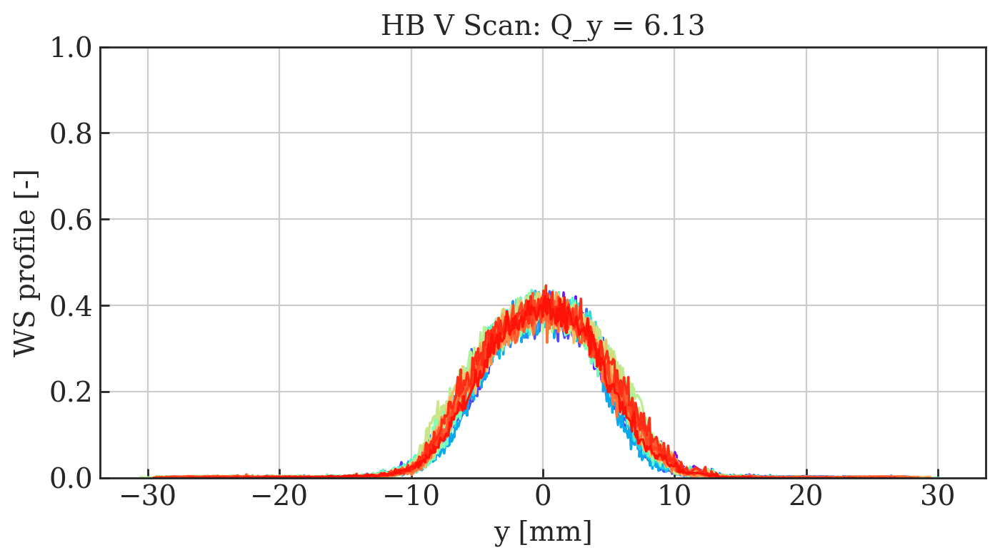

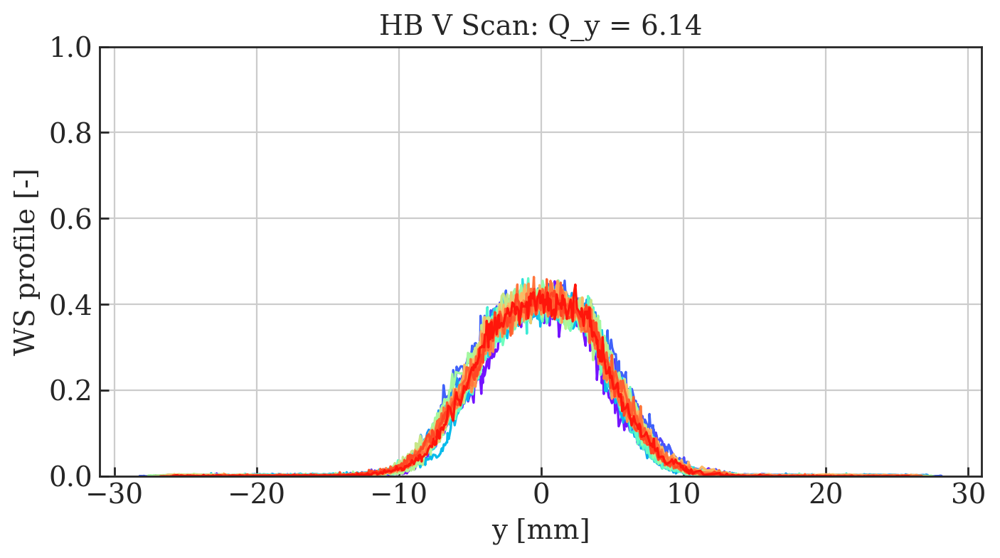

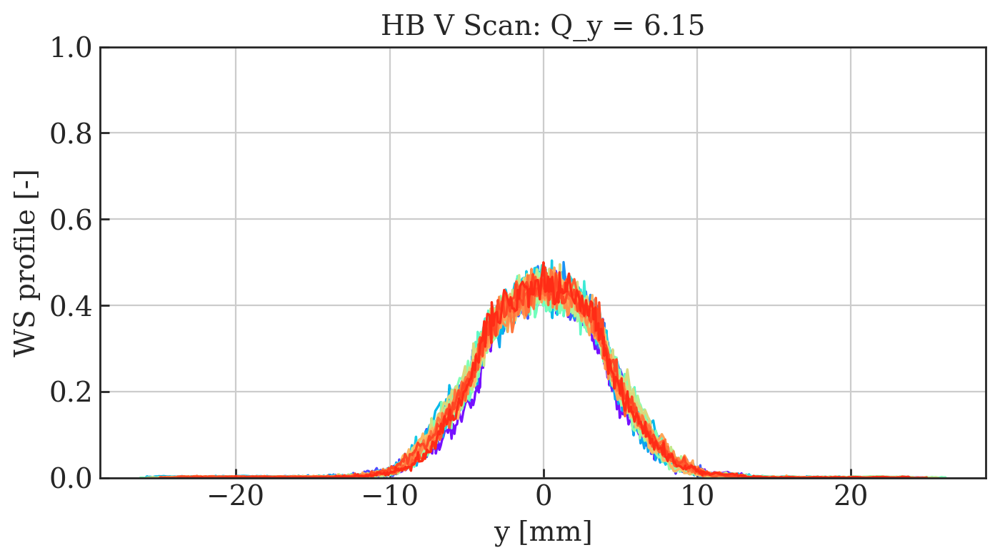

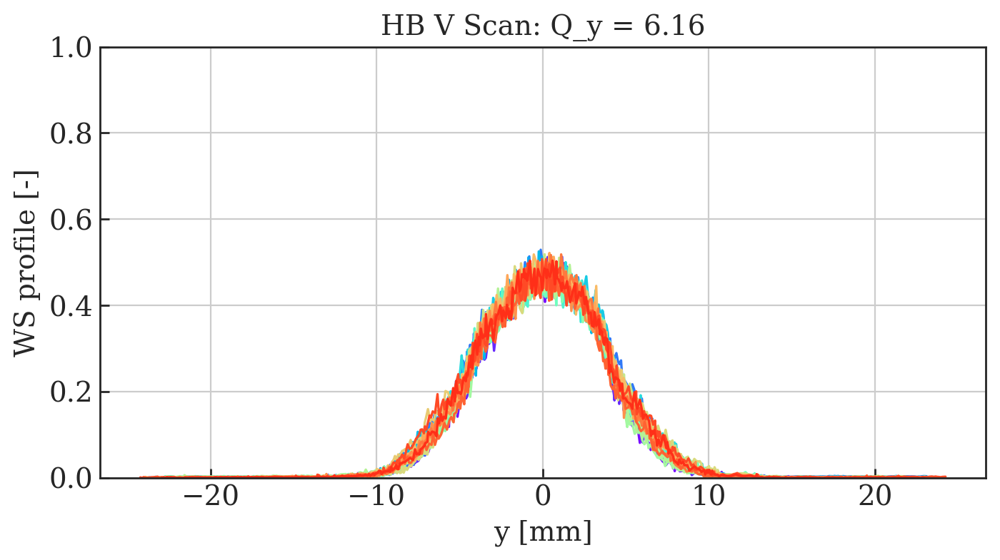

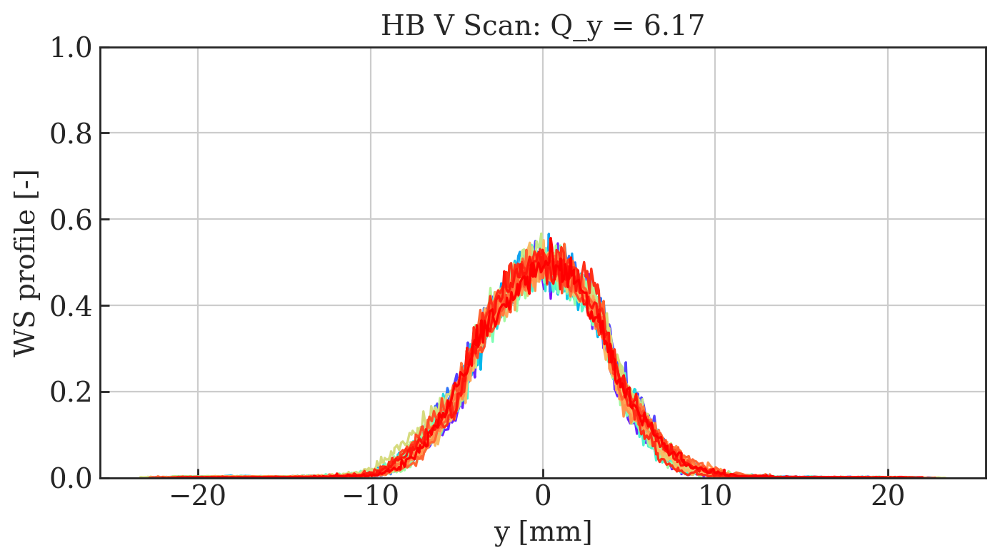

...

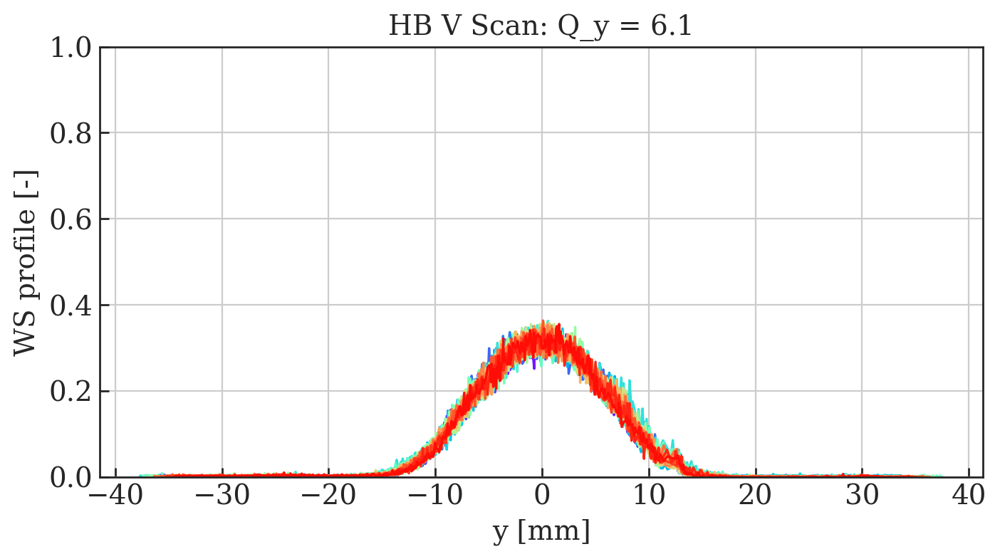

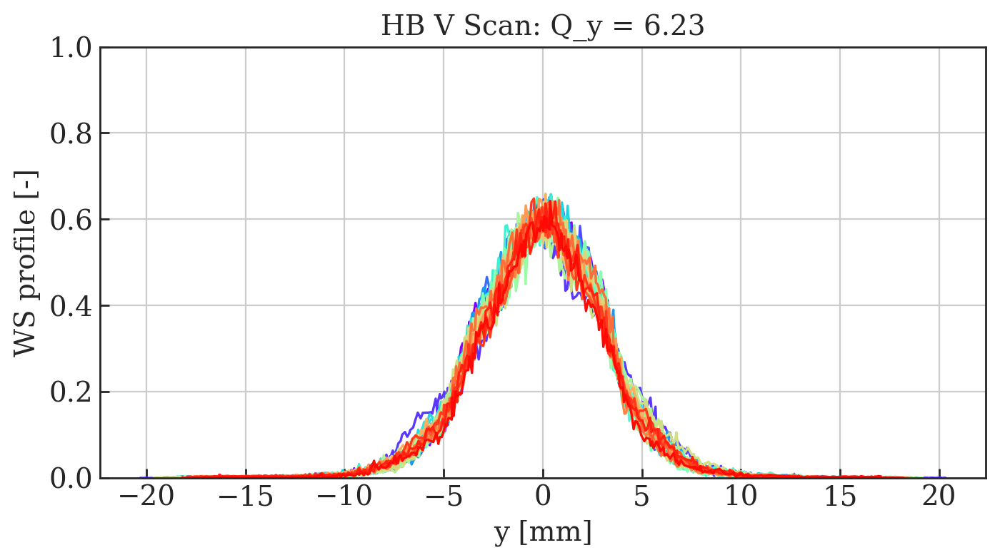

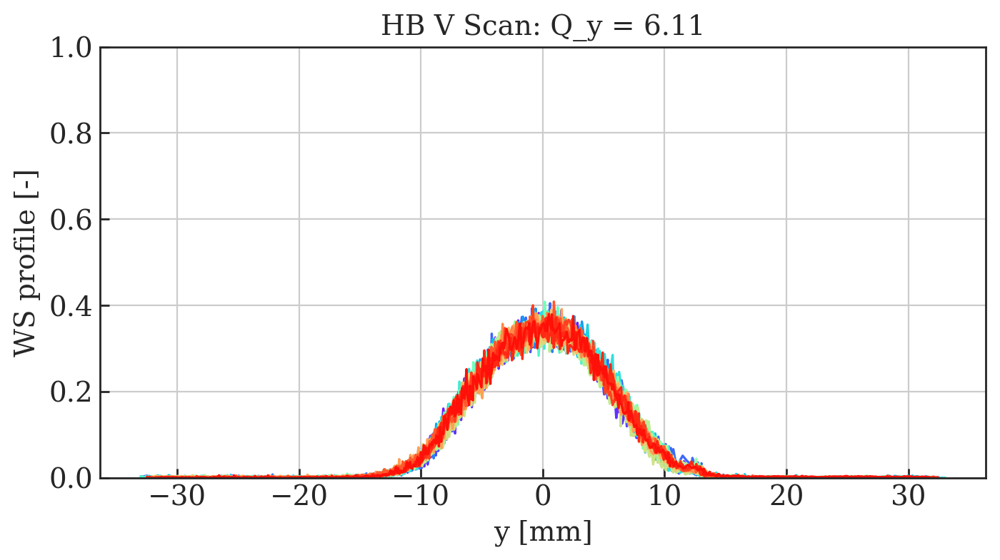

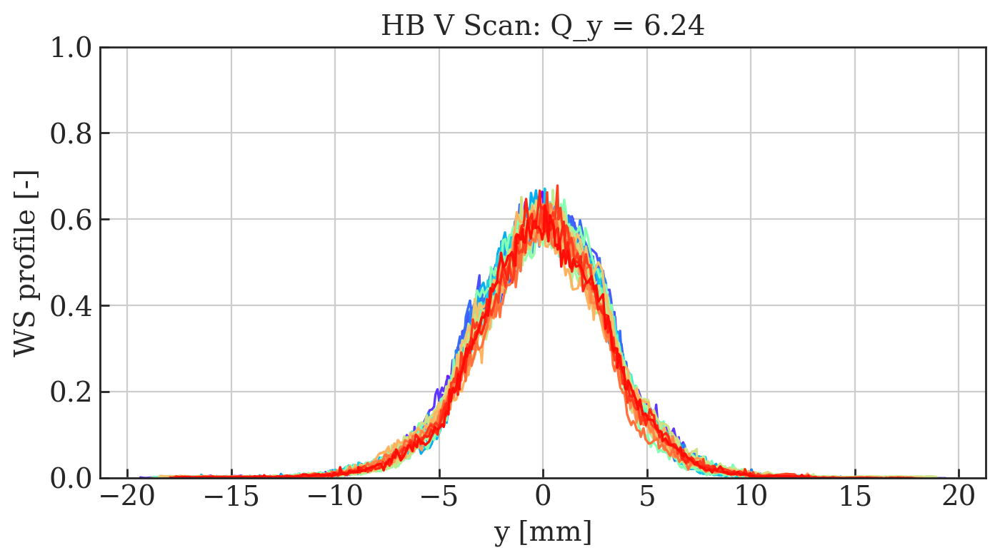

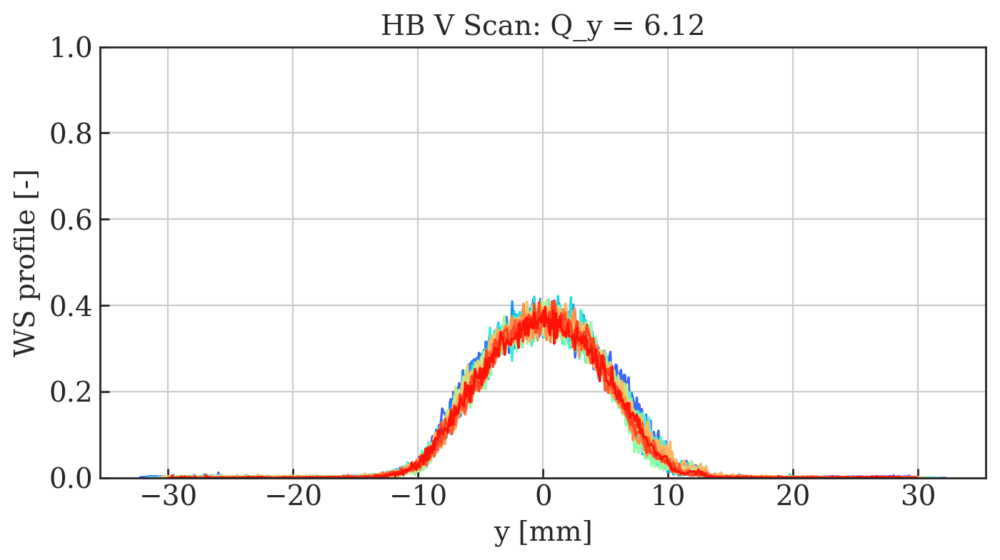

In [46]:
# Plot WS profiles grouped by Qx
for key, value in tune_points.iteritems():
    fig=plt.figure(figsize=(8, 4), dpi= 200, facecolor='w', edgecolor='k');
    for i in xrange(len(value)):
        # dataframe index = value[i]
        plt.plot(df0['position V'].iloc[value[i]], df0['profile V'].iloc[value[i]], color=colors[value[i]])
    plt.xlabel('y [mm]')
    plt.ylabel('WS profile [-]')
    title = str('HB V Scan: Q_y = ' + str(key))
    plt.title(title)
    plt.ylim(0, 1)
    plt.grid()
    savename = str('MD4224_HB_Vertical_Manual_Fit_WS_Profiles_Qy=' + str(key) + '_Using_Sim_Optics.png')
#     fig.savefig(savename)

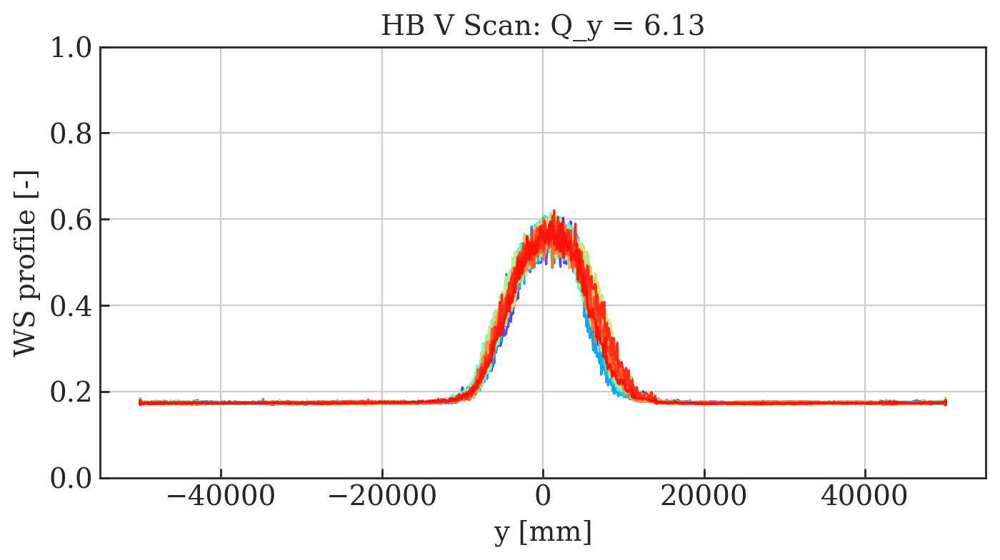

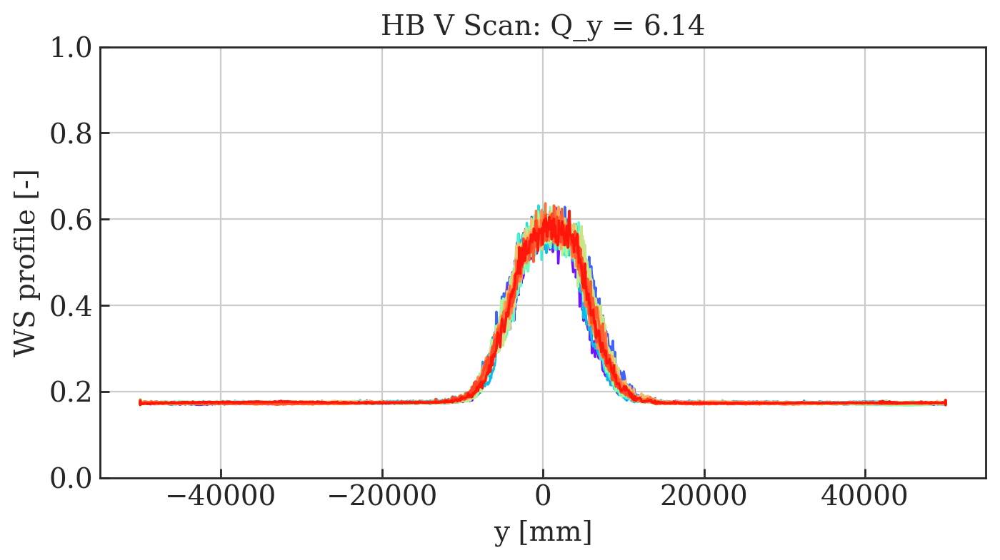

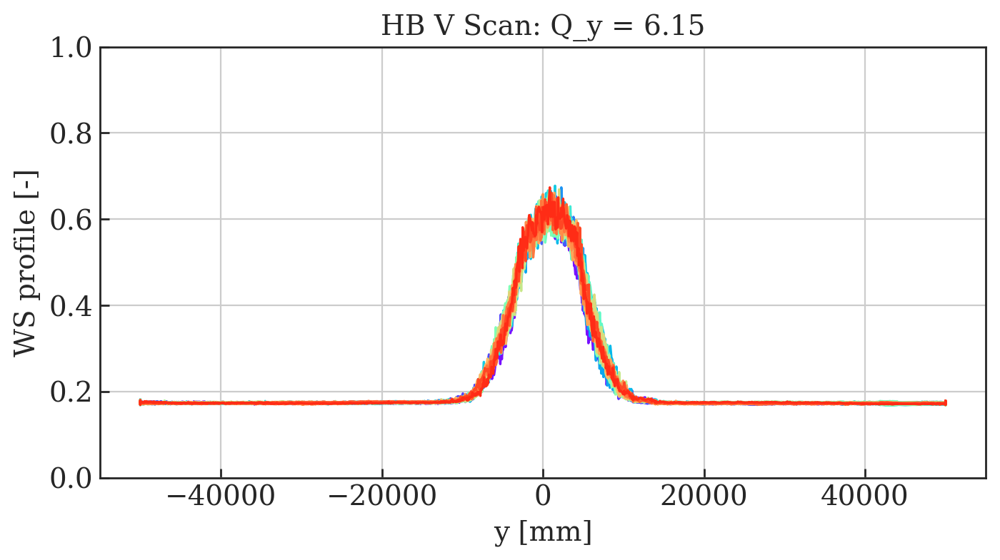

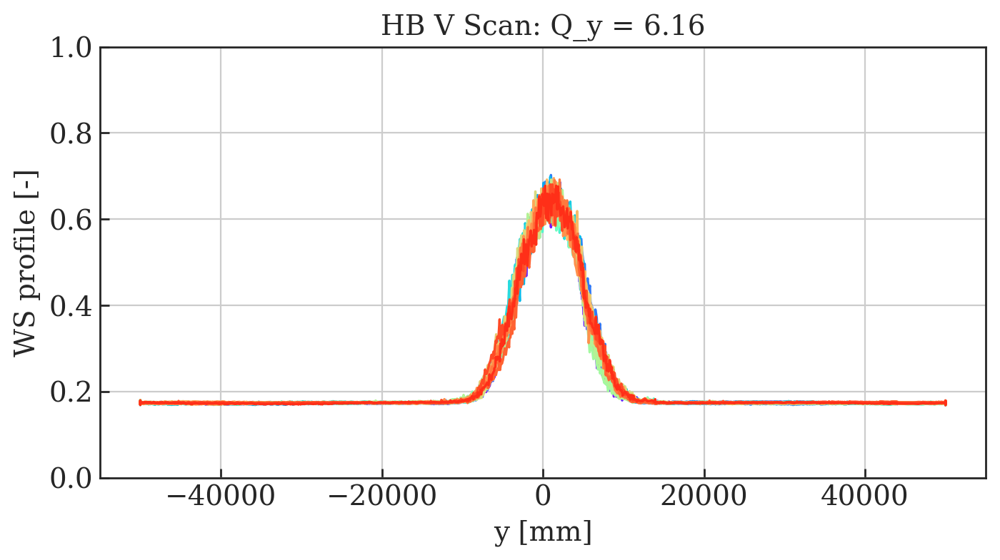

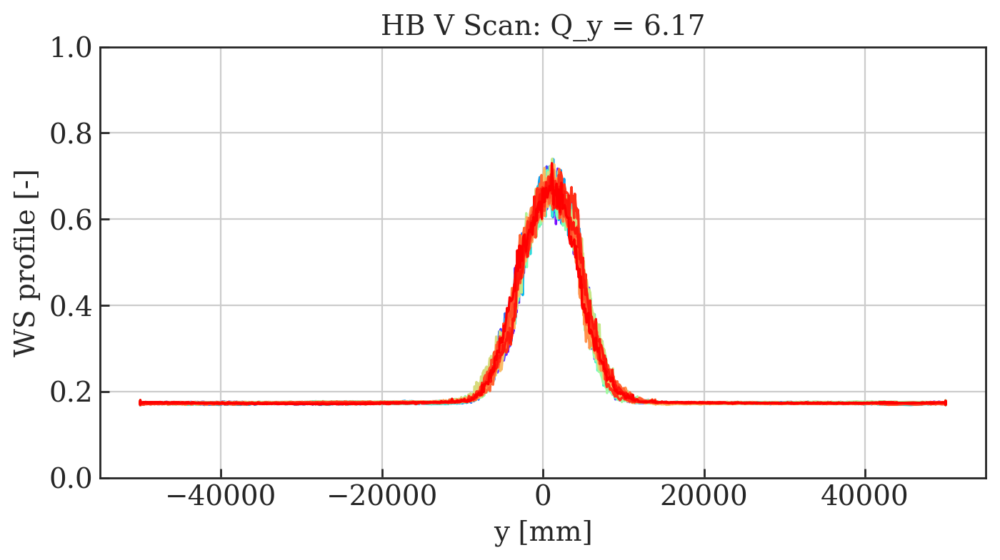

...

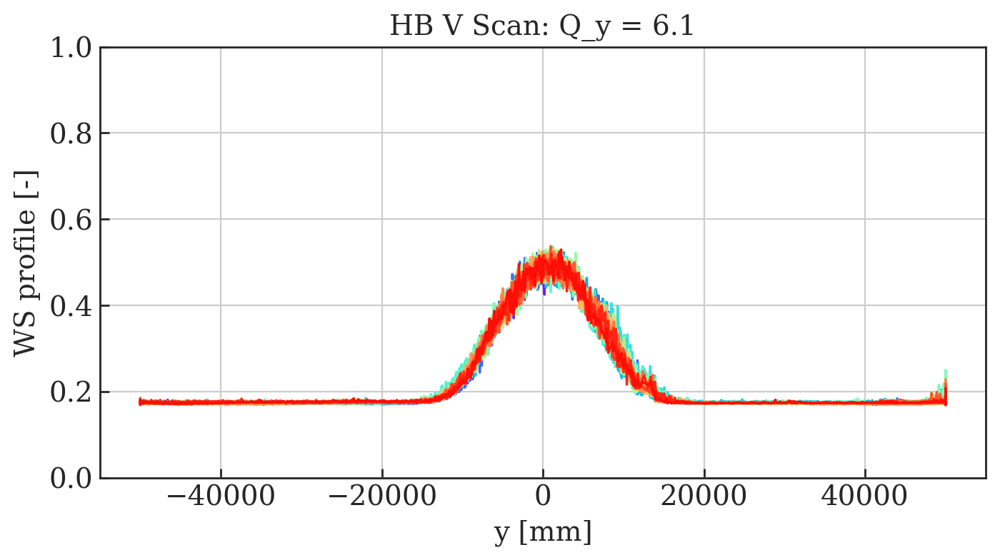

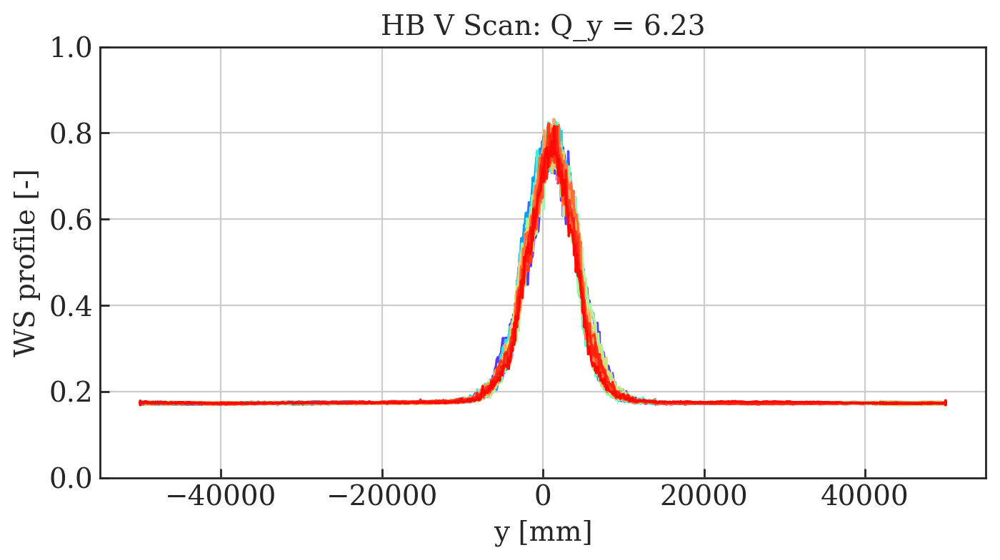

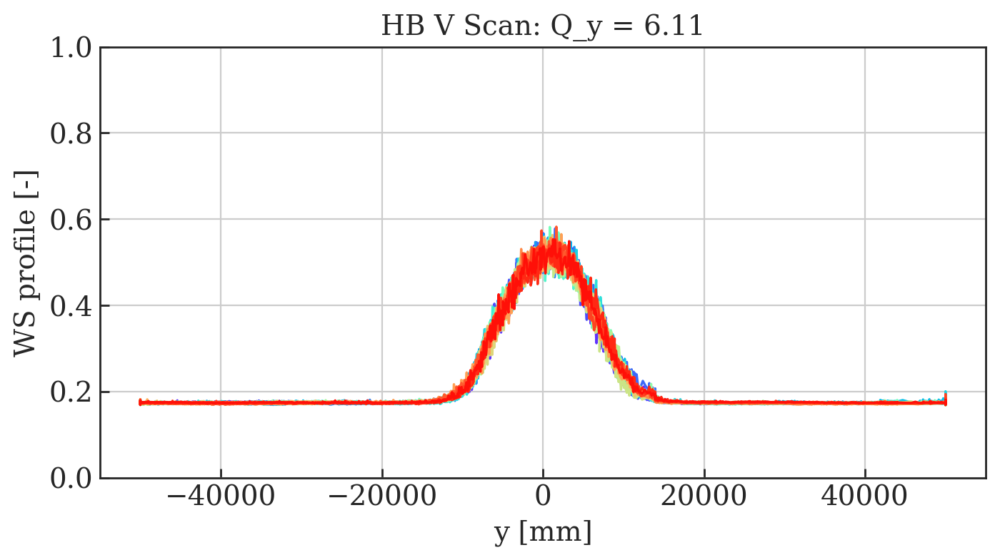

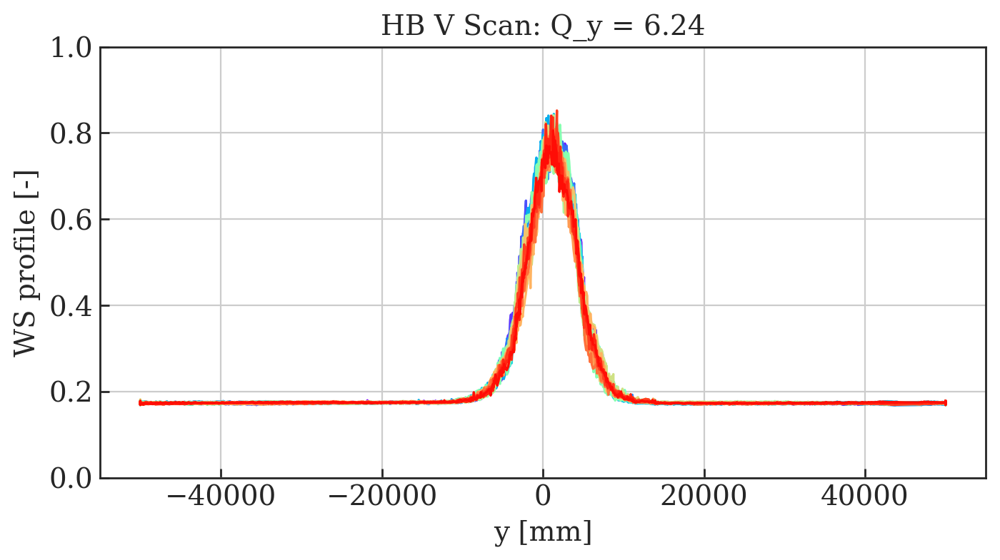

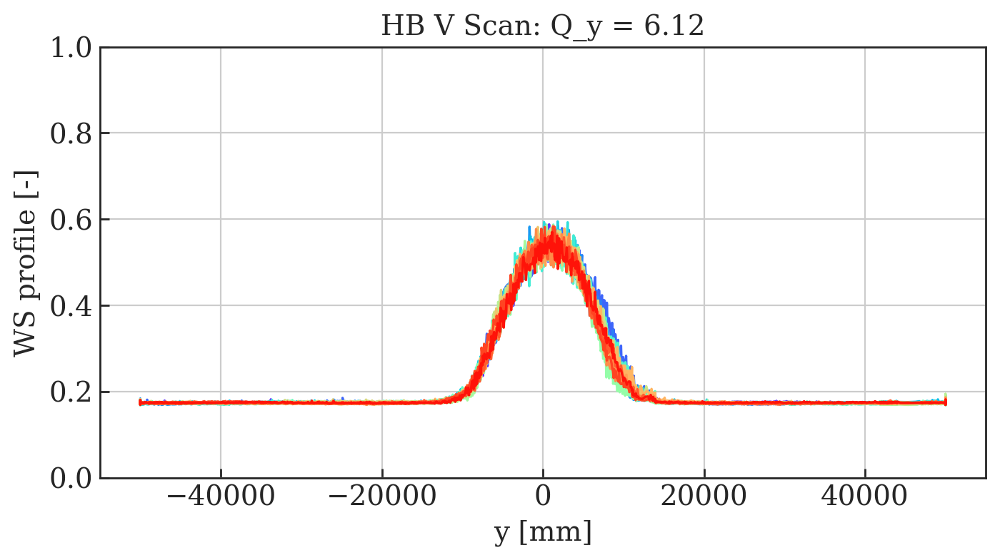

In [47]:
# Plot WS profiles grouped by Qx
for key, value in tune_points.iteritems():
    fig=plt.figure(figsize=(8, 4), dpi= 200, facecolor='w', edgecolor='k');
    for i in xrange(len(value)):
        # dataframe index = value[i]
        plt.plot(df0['PR.BWS.64.V_ROT:PROF_POSITION_IN'].iloc[value[i]], df0['PR.BWS.64.V_ROT:PROF_DATA_IN'].iloc[value[i]], color=colors[value[i]])
    plt.xlabel('y [mm]')
    plt.ylabel('WS profile [-]')
    title = str('HB V Scan: Q_y = ' + str(key))
    plt.title(title)
    plt.ylim(0, 1)
    plt.grid()
    savename = str('MD4224_HB_Vertical_Manual_Fit_WS_Profiles_Raw_Qy=' + str(key) + '_Using_Sim_Optics.png')
#     fig.savefig(savename)

## Plot Vertical emittance

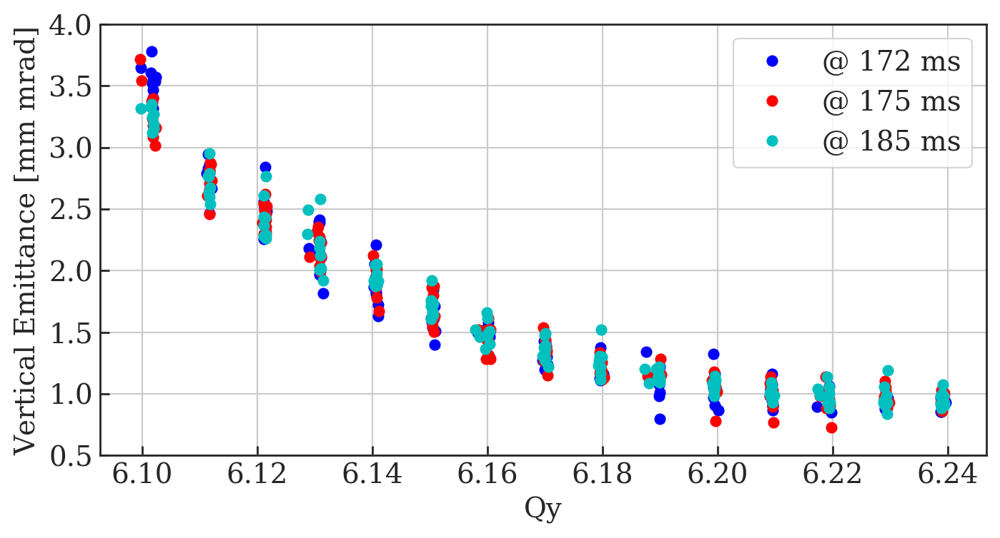

In [48]:
fig=plt.figure(figsize=(8, 4), dpi= 200, facecolor='w', edgecolor='k');
plt.plot(df0['Qy'][(df0['PR.BWS.64.V_ROT:ACQ_DELAY']==172)]+6, df0['emittance V'][(df0['PR.BWS.64.V_ROT:ACQ_DELAY']==172)],'bo', label='@ 172 ms');
plt.plot(df0['Qy'][(df0['PR.BWS.64.V_ROT:ACQ_DELAY']==175)]+6, df0['emittance V'][(df0['PR.BWS.64.V_ROT:ACQ_DELAY']==175)],'ro', label='@ 175 ms');
plt.plot(df0['Qy'][(df0['PR.BWS.64.V_ROT:ACQ_DELAY']==185)]+6, df0['emittance V'][(df0['PR.BWS.64.V_ROT:ACQ_DELAY']==185)],'co', label='@ 185 ms');
plt.xlabel('Qy');
plt.ylabel('Vertical Emittance [mm mrad]');
plt.legend();
#plt.title('Wire Scanner Acquisition Delay');
#plt.xlim(6.075, 6.25);
plt.ylim(0.5, 4);
plt.grid();
fig.savefig('MD4224_Vertical_Manual_Fit_WS_Delay_Emittance_Using_Sim_Optics.png');

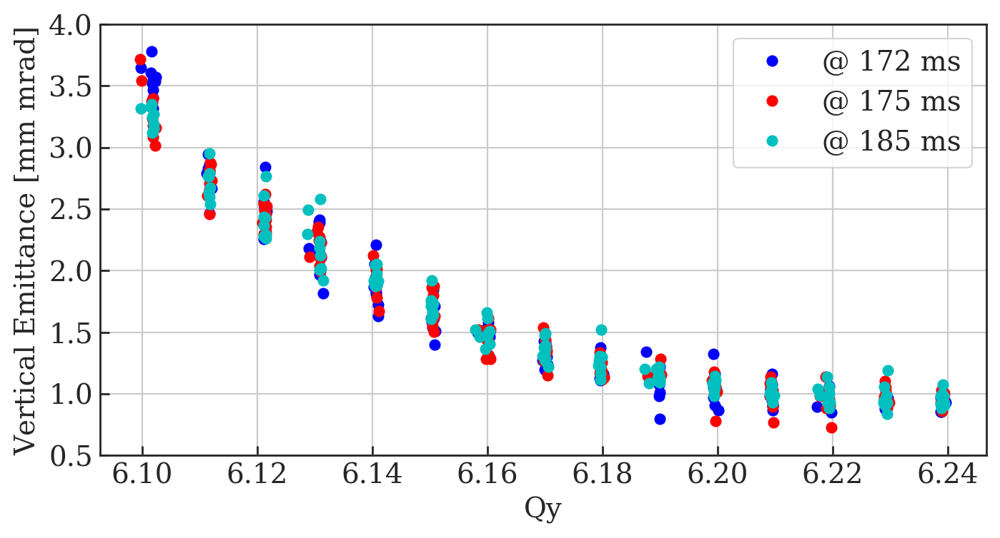

In [49]:
# Plot each shot: Qy vs Ey

fig=plt.figure(figsize=(8, 4), dpi= 200, facecolor='w', edgecolor='k');
plt.plot(df0['Qy'][(df0['PR.BWS.64.V_ROT:ACQ_DELAY']==172)]+6, df0['emittance V'][(df0['PR.BWS.64.V_ROT:ACQ_DELAY']==172)],'bo', label='@ 172 ms');
plt.plot(df0['Qy'][(df0['PR.BWS.64.V_ROT:ACQ_DELAY']==175)]+6, df0['emittance V'][(df0['PR.BWS.64.V_ROT:ACQ_DELAY']==175)],'ro', label='@ 175 ms');
plt.plot(df0['Qy'][(df0['PR.BWS.64.V_ROT:ACQ_DELAY']==185)]+6, df0['emittance V'][(df0['PR.BWS.64.V_ROT:ACQ_DELAY']==185)],'co', label='@ 185 ms');
plt.xlabel('Qy');
plt.ylabel('Vertical Emittance [mm mrad]');
plt.legend();
#plt.title('Wire Scanner Acquisition Delay');
#plt.xlim(6.075, 6.25);
plt.ylim(0.5, 4);
plt.grid();
fig.savefig('MD4224_Horizontal_WS_Delay_Emittance_Using_Sim_Optics.png');

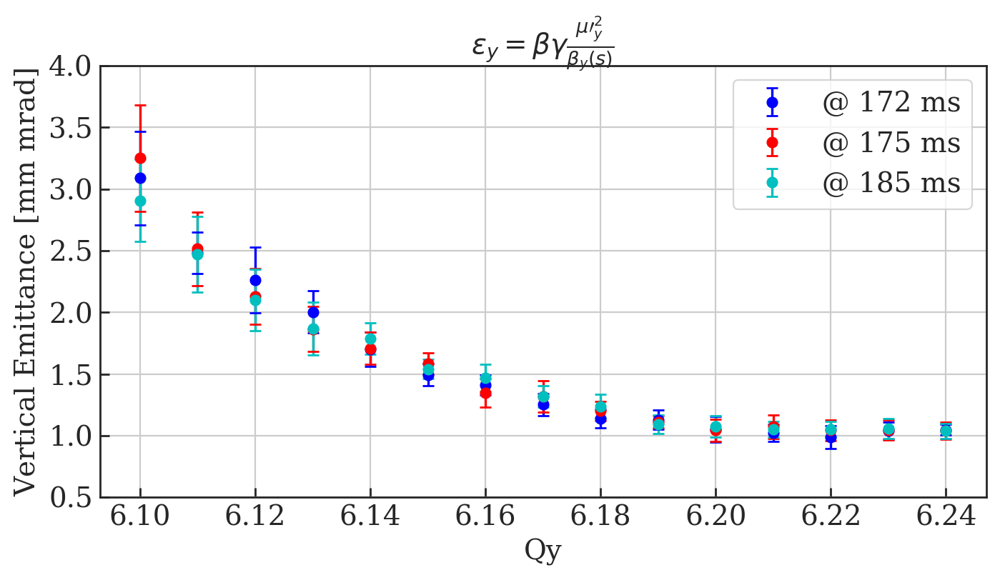

In [94]:
# Plot averaged data points with error bars
fig=plt.figure(figsize=(8, 4), dpi= 200, facecolor='w', edgecolor='k');
x_data = np.linspace(610, 624, 15);
x_data = x_data/100;

y_data_172 = []
y_data_175 = []
y_data_185 = []

y_error_172 = []
y_error_175 = []
y_error_185 = []

for i in x_data:
    
    upper_lim = i+0.0049999999999 - 6
    lower_lim = i-0.0049999999999 - 6
    
    y_data_172.append( np.mean( df0['emittance V 2ndMoment'][(df0['PR.BWS.64.V_ROT:ACQ_DELAY']==172)][(df0['Qy']>lower_lim)][(df0['Qy']<upper_lim)] ) )
    y_data_175.append( np.mean( df0['emittance V 2ndMoment'][(df0['PR.BWS.64.V_ROT:ACQ_DELAY']==175)][(df0['Qy']>lower_lim)][(df0['Qy']<upper_lim)] ) )
    y_data_185.append( np.mean( df0['emittance V 2ndMoment'][(df0['PR.BWS.64.V_ROT:ACQ_DELAY']==185)][(df0['Qy']>lower_lim)][(df0['Qy']<upper_lim)] ) )
    
    y_error_172.append( np.std( df0['emittance V 2ndMoment'][(df0['PR.BWS.64.V_ROT:ACQ_DELAY']==172)][(df0['Qy']>lower_lim)][(df0['Qy']<upper_lim)] ) )
    y_error_175.append( np.std( df0['emittance V 2ndMoment'][(df0['PR.BWS.64.V_ROT:ACQ_DELAY']==175)][(df0['Qy']>lower_lim)][(df0['Qy']<upper_lim)] ) )
    y_error_185.append( np.std( df0['emittance V 2ndMoment'][(df0['PR.BWS.64.V_ROT:ACQ_DELAY']==185)][(df0['Qy']>lower_lim)][(df0['Qy']<upper_lim)] ) )
    
    
plt.errorbar(x_data, y_data_172, y_error_172, label='@ 172 ms', linestyle='None', marker='o', capsize=3, color='b')
plt.errorbar(x_data, y_data_175, y_error_175, label='@ 175 ms', linestyle='None', marker='o', capsize=3, color='r')
plt.errorbar(x_data, y_data_185, y_error_185, label='@ 185 ms', linestyle='None', marker='o', capsize=3, color='c')

plt.xlabel('Qy');
plt.ylabel('Vertical Emittance [mm mrad]');

plt.title(r'$\epsilon_{y} = \beta\gamma \frac{\mu\prime^{2}_{y}}{\beta_{y}(s)}$')

plt.ylim(0.5, 4)

plt.legend();
plt.grid();
fig.savefig('MD4224_Vertical_Manual_Fit_WS_Delay_Emittance_2nd_Errors_Using_Sim_Optics.png');

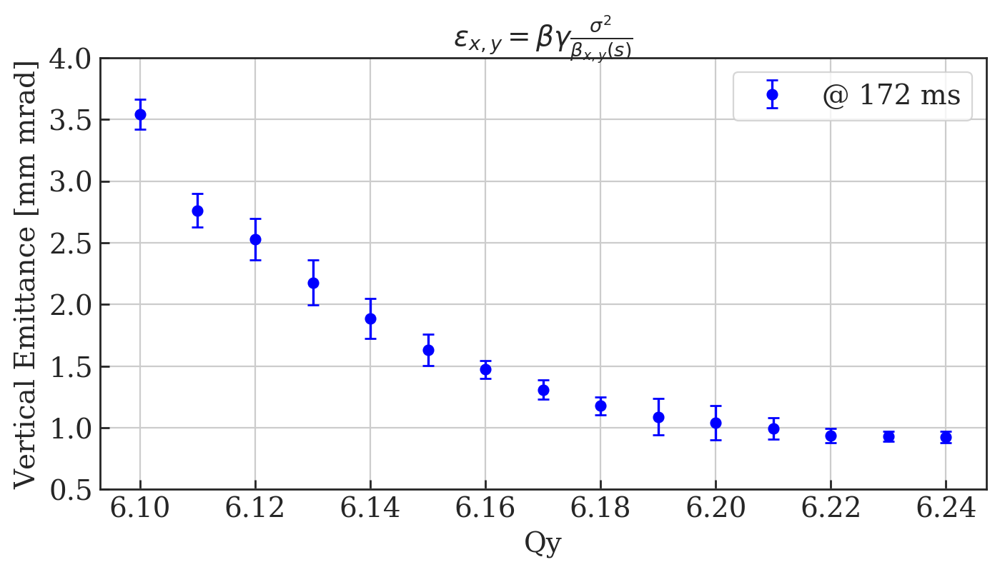

In [95]:
# Plot averaged data points with error bars
fig=plt.figure(figsize=(8, 4), dpi= 200, facecolor='w', edgecolor='k');
x_data = np.linspace(610, 624, 15);
x_data = x_data/100;

y_data_172 = []
y_error_172 = []

for i in x_data:
    
    upper_lim = i+0.0049999999999 - 6
    lower_lim = i-0.0049999999999 - 6
    
    y_data_172.append( np.mean( df0['emittance V'][(df0['PR.BWS.64.V_ROT:ACQ_DELAY']==172)][(df0['Qy']>lower_lim)][(df0['Qy']<upper_lim)] ) )
    y_error_172.append( np.std( df0['emittance V'][(df0['PR.BWS.64.V_ROT:ACQ_DELAY']==172)][(df0['Qy']>lower_lim)][(df0['Qy']<upper_lim)] ) )
        
plt.errorbar(x_data, y_data_172, y_error_172, label='@ 172 ms', linestyle='None', marker='o', capsize=3, color='b')

plt.xlabel('Qy');
plt.ylabel('Vertical Emittance [mm mrad]');

plt.title(r'$\epsilon_{x,y} = \beta\gamma \frac{\sigma^2}{\beta_{x,y}(s)}$')

plt.ylim(0.5, 4)

plt.legend();
plt.grid();
fig.savefig('MD4224_Vertical_Manual_Fit_WS_Delay_Emittance_Errors_Using_Sim_Optics_172.png');

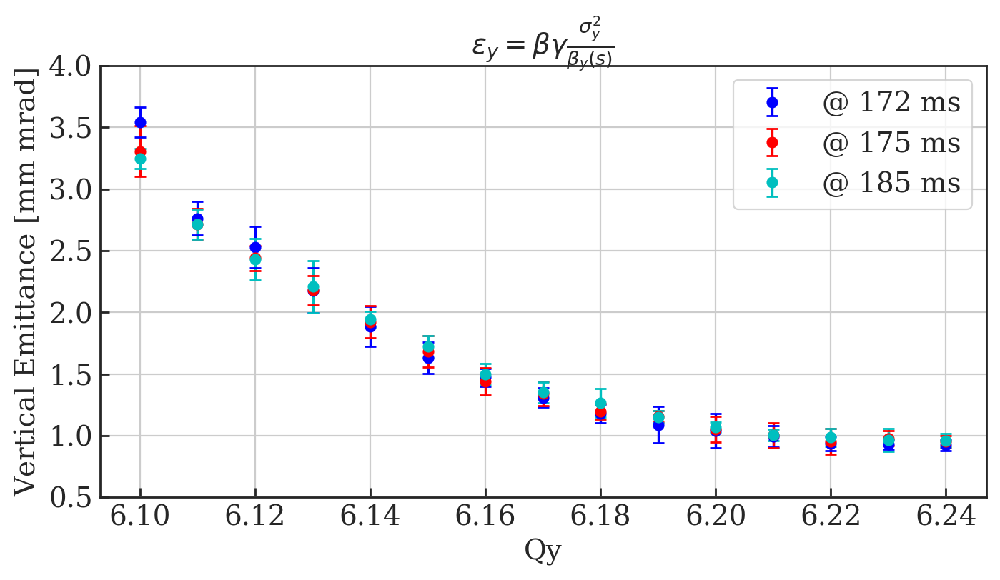

In [96]:
# Plot averaged data points with error bars
fig=plt.figure(figsize=(8, 4), dpi= 200, facecolor='w', edgecolor='k');
x_data = np.linspace(610, 624, 15);
x_data = x_data/100;

y_data_172 = []
y_data_175 = []
y_data_185 = []

y_error_172 = []
y_error_175 = []
y_error_185 = []

for i in x_data:
    
    upper_lim = i+0.0049999999999 - 6
    lower_lim = i-0.0049999999999 - 6
    
    y_data_172.append( np.mean( df0['emittance V'][(df0['PR.BWS.64.V_ROT:ACQ_DELAY']==172)][(df0['Qy']>lower_lim)][(df0['Qy']<upper_lim)] ) )
    y_data_175.append( np.mean( df0['emittance V'][(df0['PR.BWS.64.V_ROT:ACQ_DELAY']==175)][(df0['Qy']>lower_lim)][(df0['Qy']<upper_lim)] ) )
    y_data_185.append( np.mean( df0['emittance V'][(df0['PR.BWS.64.V_ROT:ACQ_DELAY']==185)][(df0['Qy']>lower_lim)][(df0['Qy']<upper_lim)] ) )
    
    y_error_172.append( np.std( df0['emittance V'][(df0['PR.BWS.64.V_ROT:ACQ_DELAY']==172)][(df0['Qy']>lower_lim)][(df0['Qy']<upper_lim)] ) )
    y_error_175.append( np.std( df0['emittance V'][(df0['PR.BWS.64.V_ROT:ACQ_DELAY']==175)][(df0['Qy']>lower_lim)][(df0['Qy']<upper_lim)] ) )
    y_error_185.append( np.std( df0['emittance V'][(df0['PR.BWS.64.V_ROT:ACQ_DELAY']==185)][(df0['Qy']>lower_lim)][(df0['Qy']<upper_lim)] ) )
    
    
plt.errorbar(x_data, y_data_172, y_error_172, label='@ 172 ms', linestyle='None', marker='o', capsize=3, color='b')
plt.errorbar(x_data, y_data_175, y_error_175, label='@ 175 ms', linestyle='None', marker='o', capsize=3, color='r')
plt.errorbar(x_data, y_data_185, y_error_185, label='@ 185 ms', linestyle='None', marker='o', capsize=3, color='c')

plt.xlabel('Qy');
plt.ylabel('Vertical Emittance [mm mrad]');

plt.title(r'$\epsilon_{y} = \beta\gamma \frac{\sigma_y^2}{\beta_{y}(s)}$')

plt.ylim(0.5, 4)

plt.legend();
plt.grid();
fig.savefig('MD4224_Vertical_Manual_Fit_WS_Delay_Emittance_Errors_Using_Sim_Optics.png');

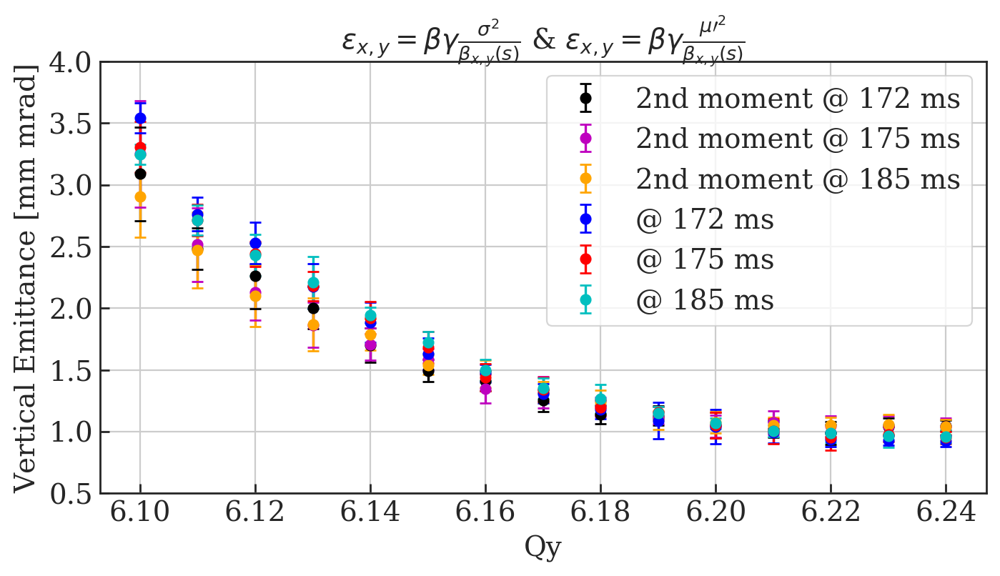

In [97]:
# Plot averaged data points with error bars
fig=plt.figure(figsize=(8, 4), dpi= 200, facecolor='w', edgecolor='k');
x_data = np.linspace(610, 624, 15);
x_data = x_data/100;

y_data_172 = []
y_data_175 = []
y_data_185 = []

y_error_172 = []
y_error_175 = []
y_error_185 = []

y_data_1722 = []
y_data_1752 = []
y_data_1852 = []

y_error_1722 = []
y_error_1752 = []
y_error_1852 = []

for i in x_data:
    
    upper_lim = i+0.0049999999999 - 6
    lower_lim = i-0.0049999999999 - 6
    
    y_data_172.append( np.mean( df0['emittance V'][(df0['PR.BWS.64.V_ROT:ACQ_DELAY']==172)][(df0['Qy']>lower_lim)][(df0['Qy']<upper_lim)] ) )
    y_data_175.append( np.mean( df0['emittance V'][(df0['PR.BWS.64.V_ROT:ACQ_DELAY']==175)][(df0['Qy']>lower_lim)][(df0['Qy']<upper_lim)] ) )
    y_data_185.append( np.mean( df0['emittance V'][(df0['PR.BWS.64.V_ROT:ACQ_DELAY']==185)][(df0['Qy']>lower_lim)][(df0['Qy']<upper_lim)] ) )
    
    y_error_172.append( np.std( df0['emittance V'][(df0['PR.BWS.64.V_ROT:ACQ_DELAY']==172)][(df0['Qy']>lower_lim)][(df0['Qy']<upper_lim)] ) )
    y_error_175.append( np.std( df0['emittance V'][(df0['PR.BWS.64.V_ROT:ACQ_DELAY']==175)][(df0['Qy']>lower_lim)][(df0['Qy']<upper_lim)] ) )
    y_error_185.append( np.std( df0['emittance V'][(df0['PR.BWS.64.V_ROT:ACQ_DELAY']==185)][(df0['Qy']>lower_lim)][(df0['Qy']<upper_lim)] ) )
    
    y_data_1722.append( np.mean( df0['emittance V 2ndMoment'][(df0['PR.BWS.64.V_ROT:ACQ_DELAY']==172)][(df0['Qy']>lower_lim)][(df0['Qy']<upper_lim)] ) )
    y_data_1752.append( np.mean( df0['emittance V 2ndMoment'][(df0['PR.BWS.64.V_ROT:ACQ_DELAY']==175)][(df0['Qy']>lower_lim)][(df0['Qy']<upper_lim)] ) )
    y_data_1852.append( np.mean( df0['emittance V 2ndMoment'][(df0['PR.BWS.64.V_ROT:ACQ_DELAY']==185)][(df0['Qy']>lower_lim)][(df0['Qy']<upper_lim)] ) )
    
    y_error_1722.append( np.std( df0['emittance V 2ndMoment'][(df0['PR.BWS.64.V_ROT:ACQ_DELAY']==172)][(df0['Qy']>lower_lim)][(df0['Qy']<upper_lim)] ) )
    y_error_1752.append( np.std( df0['emittance V 2ndMoment'][(df0['PR.BWS.64.V_ROT:ACQ_DELAY']==175)][(df0['Qy']>lower_lim)][(df0['Qy']<upper_lim)] ) )
    y_error_1852.append( np.std( df0['emittance V 2ndMoment'][(df0['PR.BWS.64.V_ROT:ACQ_DELAY']==185)][(df0['Qy']>lower_lim)][(df0['Qy']<upper_lim)] ) )
    
    
plt.errorbar(x_data, y_data_1722, y_error_1722, label='2nd moment @ 172 ms', linestyle='None', marker='o', capsize=3, color='k')
plt.errorbar(x_data, y_data_1752, y_error_1752, label='2nd moment @ 175 ms', linestyle='None', marker='o', capsize=3, color='m')
plt.errorbar(x_data, y_data_1852, y_error_1852, label='2nd moment @ 185 ms', linestyle='None', marker='o', capsize=3, color='orange')

    
plt.errorbar(x_data, y_data_172, y_error_172, label='@ 172 ms', linestyle='None', marker='o', capsize=3, color='b')
plt.errorbar(x_data, y_data_175, y_error_175, label='@ 175 ms', linestyle='None', marker='o', capsize=3, color='r')
plt.errorbar(x_data, y_data_185, y_error_185, label='@ 185 ms', linestyle='None', marker='o', capsize=3, color='c')

plt.xlabel('Qy');
plt.ylabel('Vertical Emittance [mm mrad]');

plt.title(r'$\epsilon_{x,y} = \beta\gamma \frac{\sigma^2}{\beta_{x,y}(s)}$ & $\epsilon_{x,y} = \beta\gamma \frac{\mu\prime^2}{\beta_{x,y}(s)}$')

plt.ylim(0.5, 4);
plt.legend();
plt.grid();
fig.savefig('MD4224_Vertical_Manual_Fit_WS_Delay_Emittance_both_Errors_Using_Sim_Optics.png');

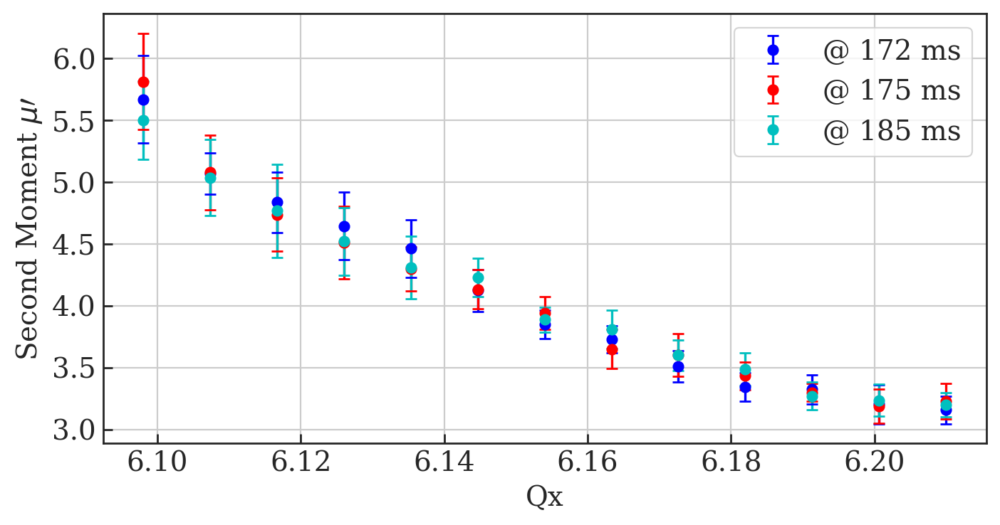

In [98]:
fig=plt.figure(figsize=(8, 4), dpi= 200, facecolor='w', edgecolor='k');
# Plot averaged data points with error bars
x_data = np.linspace(607, 621, 16);
x_data = x_data/100;

y_data_172 = []
y_data_175 = []
y_data_185 = []

y_error_172 = []
y_error_175 = []
y_error_185 = []

for i in x_data:
    
    upper_lim = i+0.0049999999999 - 6
    lower_lim = i-0.0049999999999 - 6
    
    y_data_172.append( np.mean( df0['2ndMoment V'][(df0['PR.BWS.64.V_ROT:ACQ_DELAY']==172)][(df0['Qy']>lower_lim)][(df0['Qy']<upper_lim)] ) )
    y_data_175.append( np.mean( df0['2ndMoment V'][(df0['PR.BWS.64.V_ROT:ACQ_DELAY']==175)][(df0['Qy']>lower_lim)][(df0['Qy']<upper_lim)] ) )
    y_data_185.append( np.mean( df0['2ndMoment V'][(df0['PR.BWS.64.V_ROT:ACQ_DELAY']==185)][(df0['Qy']>lower_lim)][(df0['Qy']<upper_lim)] ) )
    
    y_error_172.append( np.std( df0['2ndMoment V'][(df0['PR.BWS.64.V_ROT:ACQ_DELAY']==172)][(df0['Qy']>lower_lim)][(df0['Qy']<upper_lim)] ) )
    y_error_175.append( np.std( df0['2ndMoment V'][(df0['PR.BWS.64.V_ROT:ACQ_DELAY']==175)][(df0['Qy']>lower_lim)][(df0['Qy']<upper_lim)] ) )
    y_error_185.append( np.std( df0['2ndMoment V'][(df0['PR.BWS.64.V_ROT:ACQ_DELAY']==185)][(df0['Qy']>lower_lim)][(df0['Qy']<upper_lim)] ) )
    
    
plt.errorbar(x_data, y_data_172, y_error_172, label='@ 172 ms', linestyle='None', marker='o', capsize=3, color='b')
plt.errorbar(x_data, y_data_175, y_error_175, label='@ 175 ms', linestyle='None', marker='o', capsize=3, color='r')
plt.errorbar(x_data, y_data_185, y_error_185, label='@ 185 ms', linestyle='None', marker='o', capsize=3, color='c')

plt.xlabel('Qx');
plt.ylabel(r'Second Moment $\mu\prime$');

plt.legend();
plt.grid();
fig.savefig('MD4224_Vertical_Manual_Fit_WS_Delay_2nd_Moment_Errors_Using_Sim_Optics.png');

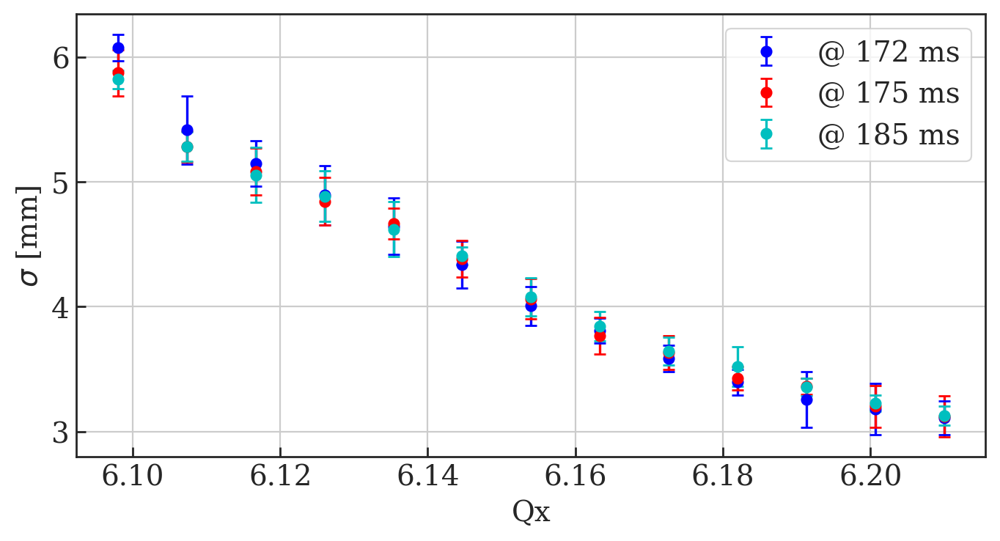

In [99]:
fig=plt.figure(figsize=(8, 4), dpi= 200, facecolor='w', edgecolor='k');
# Plot averaged data points with error bars
x_data = np.linspace(607, 621, 16);
x_data = x_data/100;

y_data_172 = []
y_data_175 = []
y_data_185 = []

y_error_172 = []
y_error_175 = []
y_error_185 = []

for i in x_data:
    
    upper_lim = i+0.0049999999999 - 6
    lower_lim = i-0.0049999999999 - 6
    
    y_data_172.append( np.mean( df0['sig V'][(df0['PR.BWS.64.V_ROT:ACQ_DELAY']==172)][(df0['Qy']>lower_lim)][(df0['Qy']<upper_lim)] ) )
    y_data_175.append( np.mean( df0['sig V'][(df0['PR.BWS.64.V_ROT:ACQ_DELAY']==175)][(df0['Qy']>lower_lim)][(df0['Qy']<upper_lim)] ) )
    y_data_185.append( np.mean( df0['sig V'][(df0['PR.BWS.64.V_ROT:ACQ_DELAY']==185)][(df0['Qy']>lower_lim)][(df0['Qy']<upper_lim)] ) )
    
    y_error_172.append( np.std( df0['sig V'][(df0['PR.BWS.64.V_ROT:ACQ_DELAY']==172)][(df0['Qy']>lower_lim)][(df0['Qy']<upper_lim)] ) )
    y_error_175.append( np.std( df0['sig V'][(df0['PR.BWS.64.V_ROT:ACQ_DELAY']==175)][(df0['Qy']>lower_lim)][(df0['Qy']<upper_lim)] ) )
    y_error_185.append( np.std( df0['sig V'][(df0['PR.BWS.64.V_ROT:ACQ_DELAY']==185)][(df0['Qy']>lower_lim)][(df0['Qy']<upper_lim)] ) )
    
    
plt.errorbar(x_data, y_data_172, y_error_172, label='@ 172 ms', linestyle='None', marker='o', capsize=3, color='b')
plt.errorbar(x_data, y_data_175, y_error_175, label='@ 175 ms', linestyle='None', marker='o', capsize=3, color='r')
plt.errorbar(x_data, y_data_185, y_error_185, label='@ 185 ms', linestyle='None', marker='o', capsize=3, color='c')

plt.xlabel('Qx');
plt.ylabel(r'$\sigma$ [mm]');

plt.legend();
plt.grid();
fig.savefig('MD4224_Vertical_Manual_Fit_WS_Delay_Sigma_Errors_Using_Sim_Optics.png');

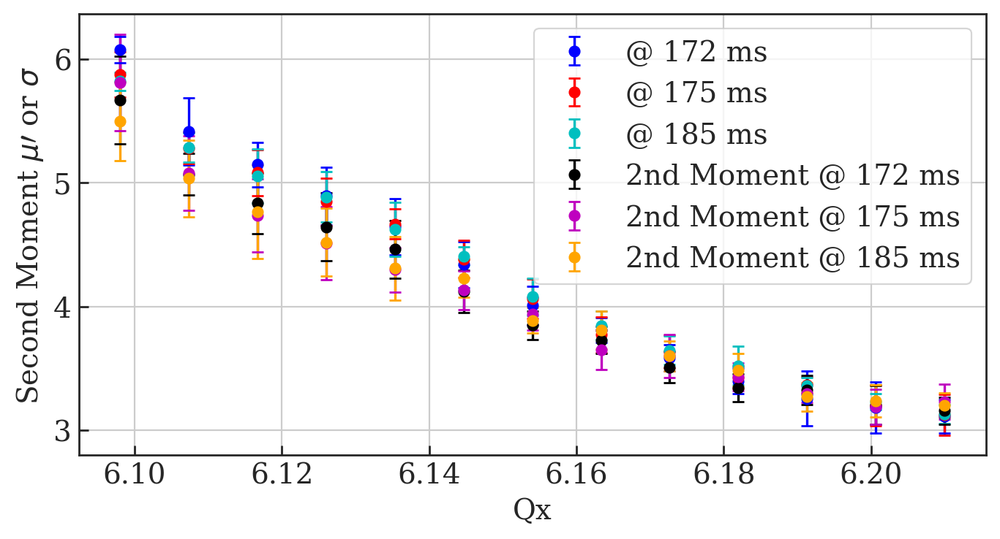

In [100]:
fig=plt.figure(figsize=(8, 4), dpi= 200, facecolor='w', edgecolor='k');
# Plot averaged data points with error bars
x_data = np.linspace(607, 621, 16);
x_data = x_data/100;

y_data_172 = []
y_data_175 = []
y_data_185 = []

y_error_172 = []
y_error_175 = []
y_error_185 = []

y_data_1722 = []
y_data_1752 = []
y_data_1852 = []

y_error_1722 = []
y_error_1752 = []
y_error_1852 = []

for i in x_data:
    
    upper_lim = i+0.0049999999999 - 6
    lower_lim = i-0.0049999999999 - 6
    
    y_data_1722.append( np.mean( df0['2ndMoment V'][(df0['PR.BWS.64.V_ROT:ACQ_DELAY']==172)][(df0['Qy']>lower_lim)][(df0['Qy']<upper_lim)] ) )
    y_data_1752.append( np.mean( df0['2ndMoment V'][(df0['PR.BWS.64.V_ROT:ACQ_DELAY']==175)][(df0['Qy']>lower_lim)][(df0['Qy']<upper_lim)] ) )
    y_data_1852.append( np.mean( df0['2ndMoment V'][(df0['PR.BWS.64.V_ROT:ACQ_DELAY']==185)][(df0['Qy']>lower_lim)][(df0['Qy']<upper_lim)] ) )
    
    y_error_1722.append( np.std( df0['2ndMoment V'][(df0['PR.BWS.64.V_ROT:ACQ_DELAY']==172)][(df0['Qy']>lower_lim)][(df0['Qy']<upper_lim)] ) )
    y_error_1752.append( np.std( df0['2ndMoment V'][(df0['PR.BWS.64.V_ROT:ACQ_DELAY']==175)][(df0['Qy']>lower_lim)][(df0['Qy']<upper_lim)] ) )
    y_error_1852.append( np.std( df0['2ndMoment V'][(df0['PR.BWS.64.V_ROT:ACQ_DELAY']==185)][(df0['Qy']>lower_lim)][(df0['Qy']<upper_lim)] ) )
    
    y_data_172.append( np.mean( df0['sig V'][(df0['PR.BWS.64.V_ROT:ACQ_DELAY']==172)][(df0['Qy']>lower_lim)][(df0['Qy']<upper_lim)] ) )
    y_data_175.append( np.mean( df0['sig V'][(df0['PR.BWS.64.V_ROT:ACQ_DELAY']==175)][(df0['Qy']>lower_lim)][(df0['Qy']<upper_lim)] ) )
    y_data_185.append( np.mean( df0['sig V'][(df0['PR.BWS.64.V_ROT:ACQ_DELAY']==185)][(df0['Qy']>lower_lim)][(df0['Qy']<upper_lim)] ) )
    
    y_error_172.append( np.std( df0['sig V'][(df0['PR.BWS.64.V_ROT:ACQ_DELAY']==172)][(df0['Qy']>lower_lim)][(df0['Qy']<upper_lim)] ) )
    y_error_175.append( np.std( df0['sig V'][(df0['PR.BWS.64.V_ROT:ACQ_DELAY']==175)][(df0['Qy']>lower_lim)][(df0['Qy']<upper_lim)] ) )
    y_error_185.append( np.std( df0['sig V'][(df0['PR.BWS.64.V_ROT:ACQ_DELAY']==185)][(df0['Qy']>lower_lim)][(df0['Qy']<upper_lim)] ) )
    
    
plt.errorbar(x_data, y_data_172, y_error_172, label='@ 172 ms', linestyle='None', marker='o', capsize=3, color='b')
plt.errorbar(x_data, y_data_175, y_error_175, label='@ 175 ms', linestyle='None', marker='o', capsize=3, color='r')
plt.errorbar(x_data, y_data_185, y_error_185, label='@ 185 ms', linestyle='None', marker='o', capsize=3, color='c')

    
plt.errorbar(x_data, y_data_1722, y_error_1722, label='2nd Moment @ 172 ms', linestyle='None', marker='o', capsize=3, color='k')
plt.errorbar(x_data, y_data_1752, y_error_1752, label='2nd Moment @ 175 ms', linestyle='None', marker='o', capsize=3, color='m')
plt.errorbar(x_data, y_data_1852, y_error_1852, label='2nd Moment @ 185 ms', linestyle='None', marker='o', capsize=3, color='orange')

plt.xlabel('Qx');
plt.ylabel(r'Second Moment $\mu\prime$ or $\sigma$');

plt.legend();
plt.grid();
fig.savefig('MD4224_Vertical_Manual_Fit_WS_Delay_2nd_Moment_and_Sigma_Errors_Using_Sim_Optics.png');

In [57]:
np.mean( df0['emittance V'][(df0['PR.BWS.64.V_ROT:ACQ_DELAY']==172)][(df0['Qy']>.05)][(df0['Qy']<.1045)] )

3.5406945919238786

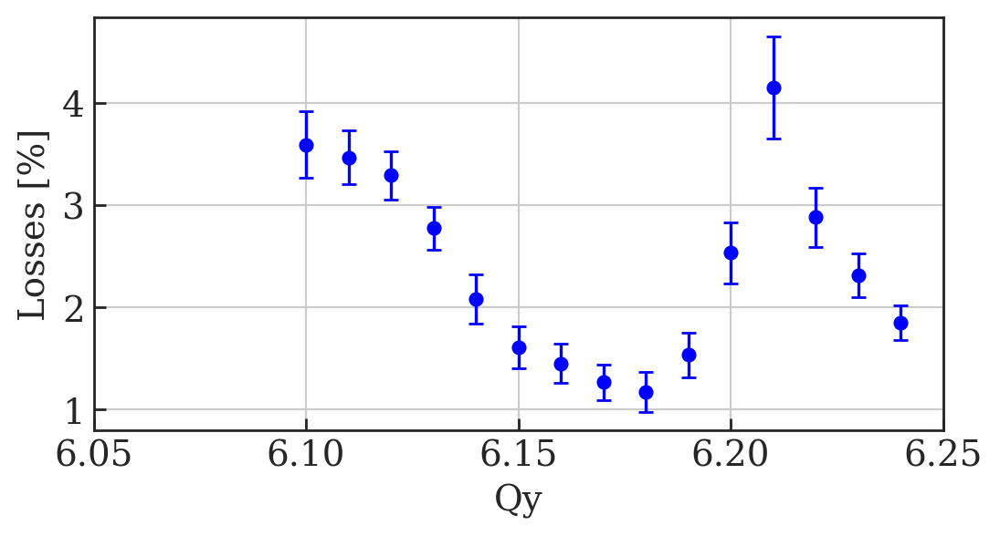

In [58]:
# Plot averaged data points with error bars
fig=plt.figure(figsize=(6, 3), dpi= 200, facecolor='w', edgecolor='k');
x_data = np.linspace(610, 624, 15);
x_data = x_data/100;

y_data_172 = []
y_data_175 = []
y_data_185 = []

y_error_172 = []
y_error_175 = []
y_error_185 = []

for i in x_data:
    
    upper_lim = i+0.0049999999999 - 6
    lower_lim = i-0.0049999999999 - 6
    
    y_data_172.append( np.mean( df0['losses'][(df0['Qy']>lower_lim)][(df0['Qy']<upper_lim)] ) )
    
    y_error_172.append( np.std( df0['losses'][(df0['Qy']>lower_lim)][(df0['Qy']<upper_lim)] ) )
    
plt.errorbar(x_data, y_data_172, y_error_172, label='@ 172 ms', linestyle='None', marker='o', capsize=3, color='b')

plt.xlabel('Qy');
plt.ylabel('Losses [%]');
plt.xlim(6.05, 6.25)

#plt.legend();
plt.grid();
fig.savefig('MD4224_Vertical_Losses_Errors_Using_Sim_Optics.png');

# Load Distributions From Simulation Data

In [59]:
# Read .mat files into a dictionary

# matfiles = glob.glob("13_May/*.mat")
#matfiles = glob.glob("../Simulation_Output/V_Scan_Matched_Initial/Bunch_Profiles/*.mat")
matfiles = glob.glob("../MD4224_Repo_Outputs/V_Optimised/Simulation_Profiles/*.mat")
sims = dict()

for f in matfiles:
    first = f.split('/')[-1]
    second = first.split('.')[0]
    sims[str(second)] = f
    
sims

{'610_SbS_c172': '../MD4224_Repo_Outputs/V_Optimised/Simulation_Profiles/610_SbS_c172.mat',
 '611_SbS_c172': '../MD4224_Repo_Outputs/V_Optimised/Simulation_Profiles/611_SbS_c172.mat',
 '612_SbS_c172': '../MD4224_Repo_Outputs/V_Optimised/Simulation_Profiles/612_SbS_c172.mat',
 '613_SbS_c172': '../MD4224_Repo_Outputs/V_Optimised/Simulation_Profiles/613_SbS_c172.mat',
 '614_SbS_c172': '../MD4224_Repo_Outputs/V_Optimised/Simulation_Profiles/614_SbS_c172.mat',
 '615_SbS_c172': '../MD4224_Repo_Outputs/V_Optimised/Simulation_Profiles/615_SbS_c172.mat',
 '616_SbS_c172': '../MD4224_Repo_Outputs/V_Optimised/Simulation_Profiles/616_SbS_c172.mat',
 '617_SbS_c172': '../MD4224_Repo_Outputs/V_Optimised/Simulation_Profiles/617_SbS_c172.mat',
 '618_SbS_c172': '../MD4224_Repo_Outputs/V_Optimised/Simulation_Profiles/618_SbS_c172.mat',
 '619_SbS_c172': '../MD4224_Repo_Outputs/V_Optimised/Simulation_Profiles/619_SbS_c172.mat',
 '620_SbS_c172': '../MD4224_Repo_Outputs/V_Optimised/Simulation_Profiles/620_SbS

# Dictionary of tune points

In [60]:
# These are our tune points:
scan_points = np.linspace(610, 624, 15);
scan_points = scan_points/100;

Qy_points=[]
for i in scan_points:
    Qy_points.append(round_sig(i,5))
print Qy_points

[6.1, 6.11, 6.12, 6.13, 6.14, 6.15, 6.16, 6.17, 6.18, 6.19, 6.2, 6.21, 6.22, 6.23, 6.24]


In [61]:
# Make dictionary of nearest tune point and iterators
Qy_point_separation = Qy_points[1] - Qy_points[0]
Qy_pt_sep = Qy_point_separation/2
print 'Tune points separated by +/- ', Qy_pt_sep

tune_points = {}
for i in Qy_points:
    tune_points[i] = np.where(np.logical_and(np.greater_equal(df0['Qy'], (i-Qy_pt_sep-6)), np.less_equal(df0['Qy'], (i+Qy_pt_sep-6)) ) )[0]
tune_points

Tune points separated by +/-  0.005


{6.1: array([ 13,  28,  42,  57,  72,  99, 114, 129, 144, 159, 173, 186, 201,
        214, 228, 243, 258, 272, 286, 300, 314, 329, 343, 356, 371, 384,
        397, 410]),
 6.11: array([ 12,  27,  41,  56,  71,  86,  98, 113, 128, 143, 158, 172, 200,
        227, 242, 257, 271, 285, 299, 313, 328, 342, 370, 383, 396, 409]),
 6.12: array([ 26,  55,  70,  85, 112, 127, 142, 157, 171, 185, 199, 213, 226,
        241, 256, 270, 284, 298, 312, 327, 341, 369, 382, 408]),
 6.13: array([ 11,  25,  40,  54,  69,  84,  97, 111, 126, 141, 156, 170, 184,
        198, 212, 225, 240, 255, 269, 283, 297, 311, 326, 340, 355, 368,
        381, 395, 407]),
 6.14: array([ 10,  24,  39,  53,  68,  83,  96, 110, 125, 140, 155, 169, 183,
        197, 211, 224, 239, 254, 268, 296, 310, 325, 339, 354, 367, 380,
        406]),
 6.15: array([  9,  23,  38,  52,  67,  82,  95, 109, 124, 139, 154, 182, 196,
        210, 223, 238, 253, 267, 282, 295, 309, 324, 338, 353, 366, 379,
        394]),
 6.16: array([  8,  

# Function to find Peak

# Test Peakfinder

In [62]:
peak = peakfinder(np.array(df0['position V'].iloc[0]), np.array(df0['profile V'].iloc[0]),tolerance = 0.01, verbose=True)
print peak



	MAX(y_dat) =  0.6638534591783954
	index from y_dat peak not within tolerance of 0.01 mm. 
	try manual search
	index =  192
	index of x_dat =  -0.03379243863650805  is  192
	Mean of peak point +/- 3 points =  0.638239823191498
0.638239823191498


	 using peak value
peak @ 85.9493402124039


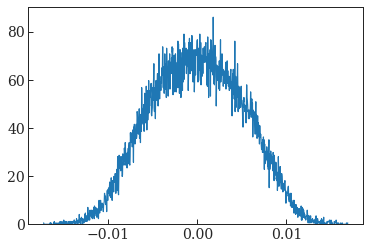

In [63]:
matfiles = glob.glob("../MD4224_Repo_Outputs/V_Mini_Optimised/Simulation_Profiles/*.mat")
plt.clf()

d = particles_from_matfile("../MD4224_Repo_Outputs/V_Mini_Optimised/Simulation_Profiles/610_SbS_c172.mat")
x, bins_, p = plt.hist(d['particles']['y'][0][0][0], bins = 1000, density=True, histtype=u'step', lw=0, color='k')
    
    
peak = peakfinder(np.array(bins_[:-1]), np.array(x))
print 'peak @', peak

plt.plot(bins_[:-1], x);

# Check all simulation data peaks

In [64]:
for key, value in sorted(sims.iteritems()):
    print value
    d = particles_from_matfile(value)
    plt.clf()
    x, bins_, p = plt.hist(d['particles']['y'][0][0][0], bins = 1000, density=True, histtype=u'step', lw=0, color='k')

    peak = peakfinder(np.array(bins_[:-1]), np.array(x), verbose=True)
    print '\n peak = ', peak, '\n'
    plt.close()

../MD4224_Repo_Outputs/V_Optimised/Simulation_Profiles/610_SbS_c172.mat

	MAX(y_dat) =  69.74323877125634
	x_dat[index] =  0.0005101055061852815
	index of x_dat =  0.0005101055061852815  is  508
	Mean of peak point +/- 3 points =  66.01180238911725

 peak =  66.01180238911725 

../MD4224_Repo_Outputs/V_Optimised/Simulation_Profiles/611_SbS_c172.mat

	MAX(y_dat) =  75.14176264415475
	x_dat[index] =  0.0012709895949379324
	index of x_dat =  0.0012709895949379324  is  522
	Mean of peak point +/- 3 points =  71.95482536432611

 peak =  71.95482536432611 

../MD4224_Repo_Outputs/V_Optimised/Simulation_Profiles/612_SbS_c172.mat

	MAX(y_dat) =  83.08656291800608
	x_dat[index] =  -0.0008315859025405832
	index of x_dat =  -0.0008315859025405832  is  465
	Mean of peak point +/- 3 points =  79.11387790556557

 peak =  79.11387790556557 

../MD4224_Repo_Outputs/V_Optimised/Simulation_Profiles/613_SbS_c172.mat

	MAX(y_dat) =  89.03108079293945
	x_dat[index] =  0.0007190122862557845
	index of x_dat 

# Plot wirescanner profiles with simulation data


Importing simulation file: 610_SbS_c172
Qy =  6.1 , ctime = 172.0 [ms]
MD points:  [13, 57, 99, 144, 186, 228, 272, 314, 356, 397]

Importing simulation file: 611_SbS_c172
Qy =  6.11 , ctime = 172.0 [ms]
MD points:  [12, 56, 98, 143, 227, 271, 313, 396]

Importing simulation file: 612_SbS_c172
Qy =  6.12 , ctime = 172.0 [ms]
MD points:  [55, 142, 185, 226, 270, 312]
	 using peak value
	 using peak value
	 using peak value
	 using peak value
	 using peak value
	 using peak value

Importing simulation file: 613_SbS_c172
Qy =  6.13 , ctime = 172.0 [ms]
MD points:  [11, 54, 97, 141, 184, 225, 269, 311, 355, 395]

Importing simulation file: 614_SbS_c172
Qy =  6.14 , ctime = 172.0 [ms]
MD points:  [10, 53, 96, 140, 183, 224, 268, 310, 354]

Importing simulation file: 615_SbS_c172
Qy =  6.15 , ctime = 172.0 [ms]
MD points:  [9, 52, 95, 139, 182, 223, 267, 309, 353, 394]

Importing simulation file: 616_SbS_c172
Qy =  6.16 , ctime = 172.0 [ms]
MD points:  [8, 51, 94, 138, 181, 222, 266, 308, 3

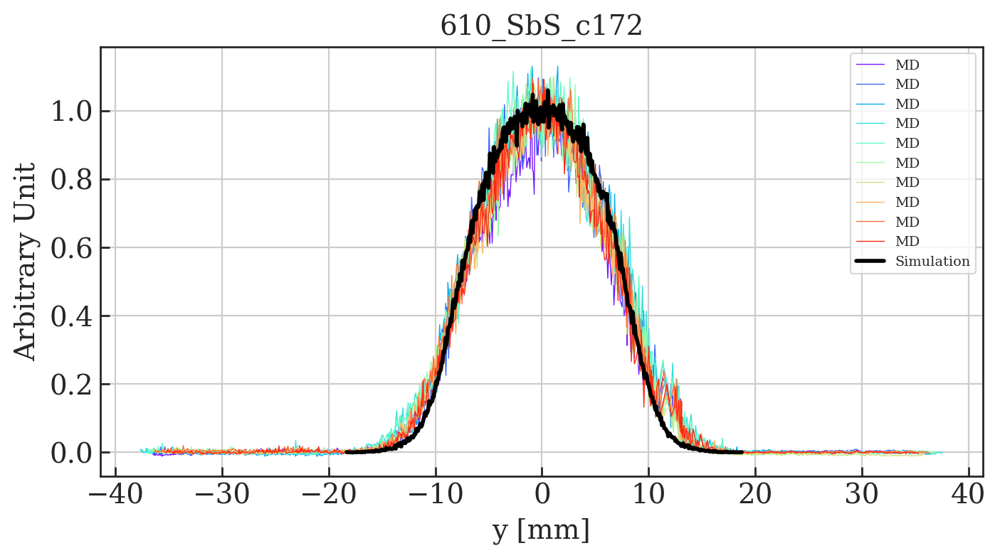

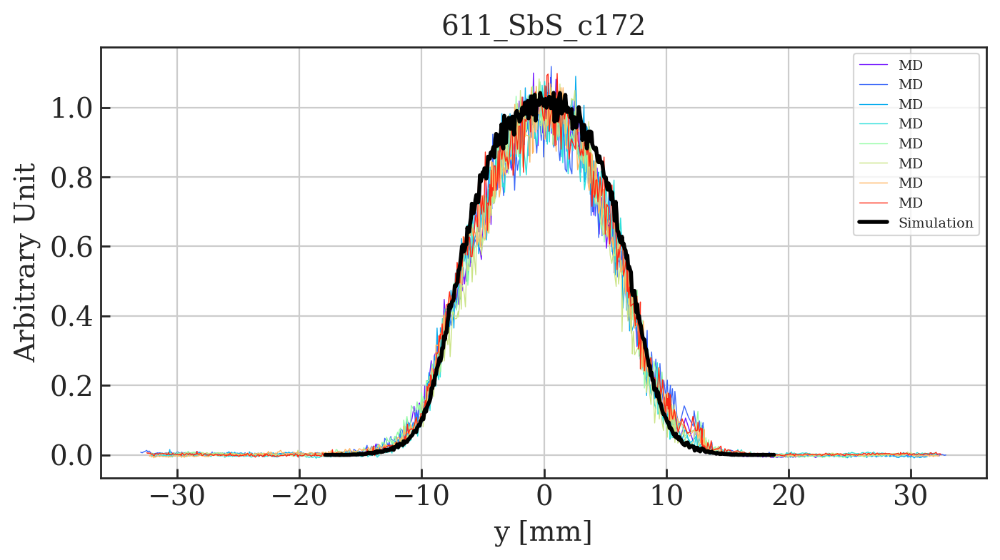

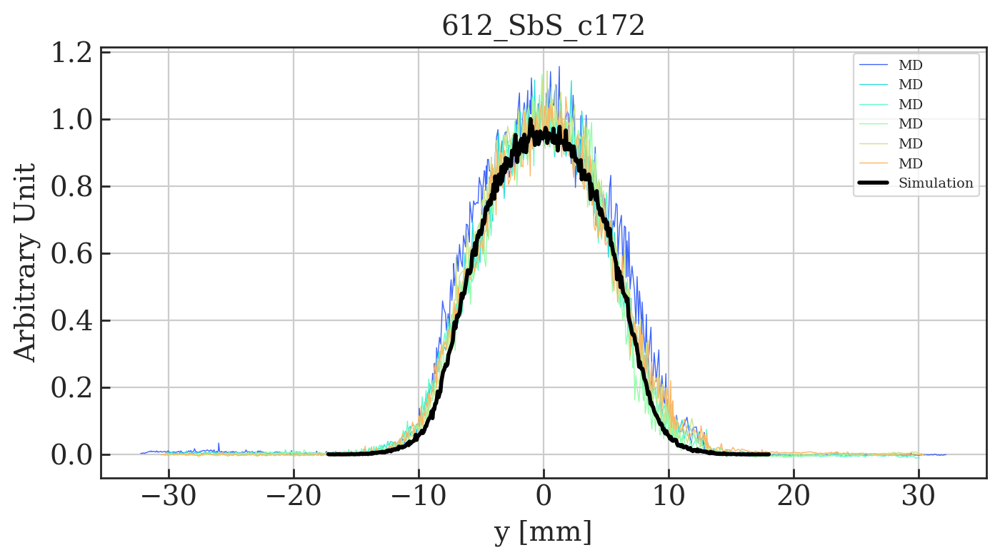

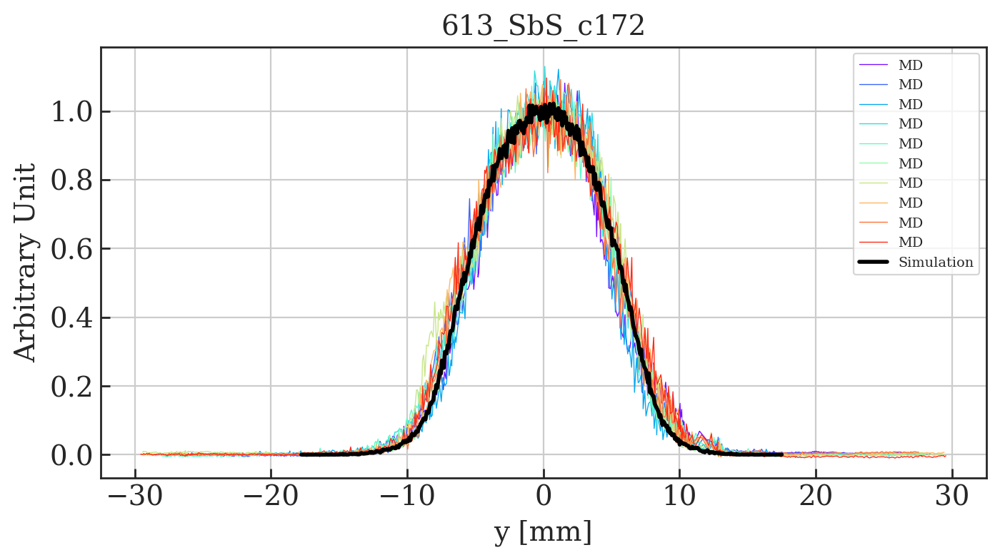

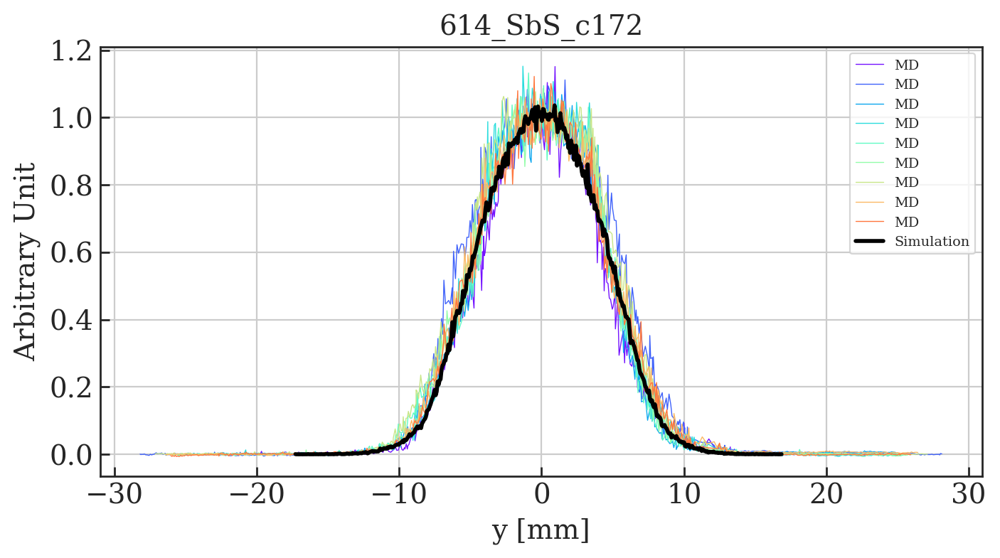

...

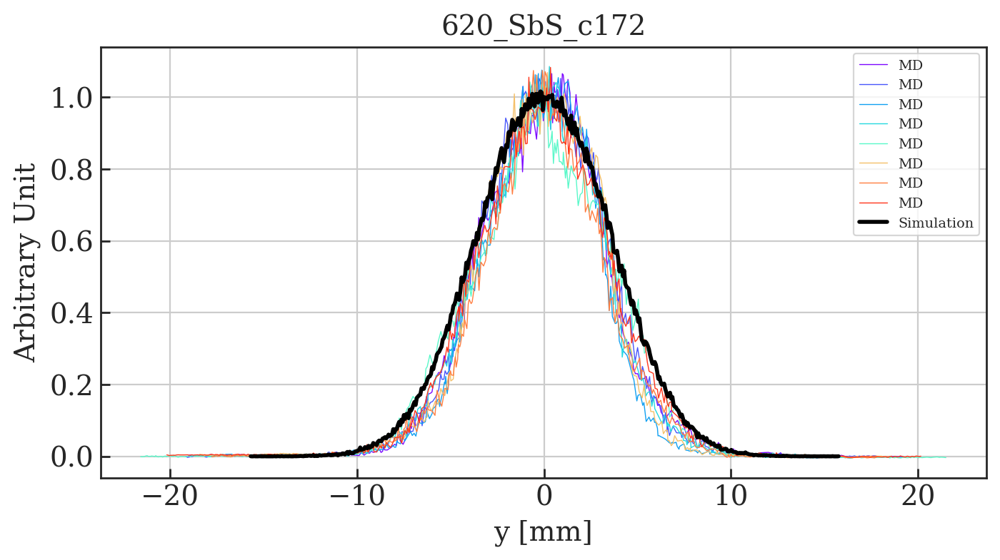

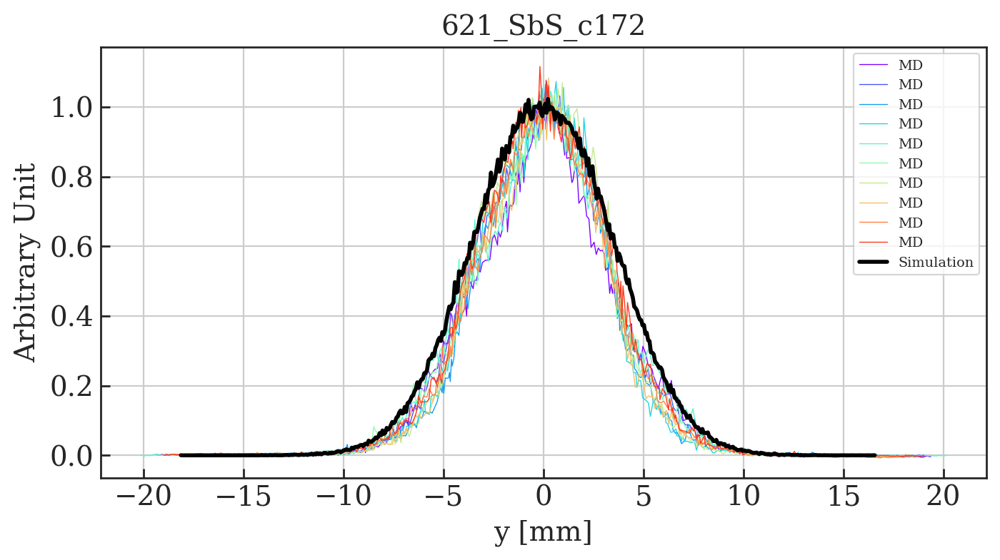

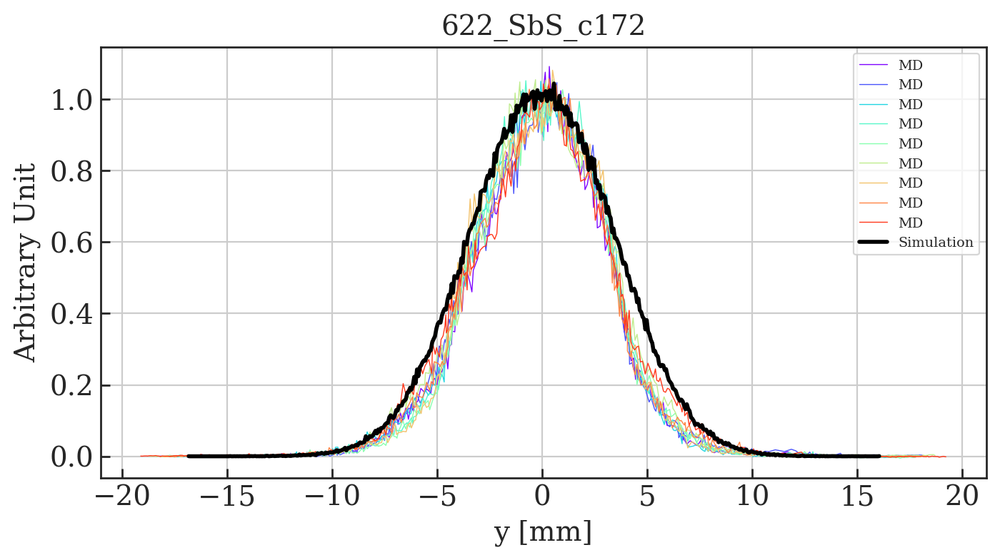

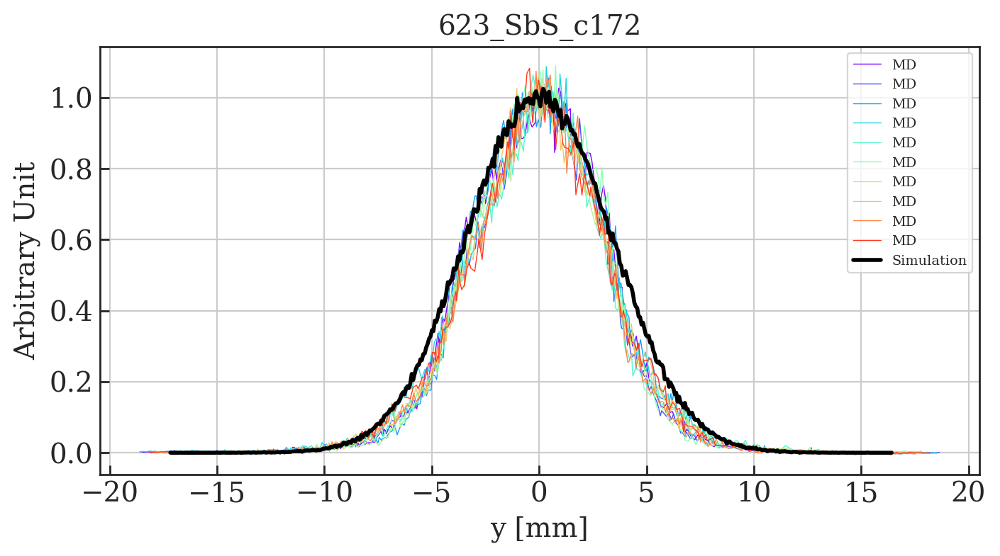

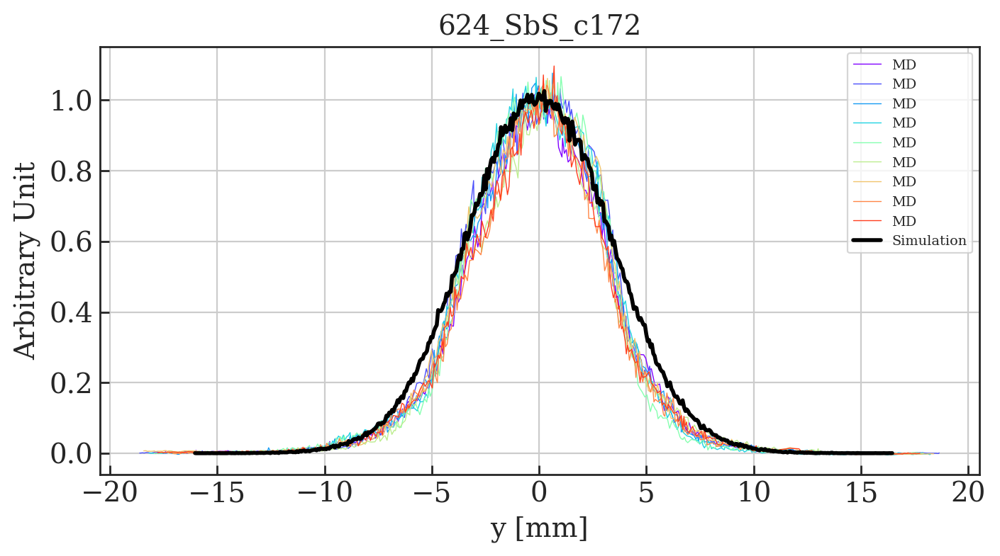

In [65]:
#Main function
verbose = True

for key, value in sorted(sims.iteritems()):
    if verbose: print '\nImporting simulation file:', key
    
    tune_y = float(key.split('_')[0])/100
    ctime = (key.split('_')[2])
    time = float(ctime.split('c')[1])
    if verbose: print 'Qy = ', tune_y, ', ctime =', time, '[ms]'
        
    d = particles_from_matfile(value)
        
    # Find MD data with same tune and ctime
    
    md_points = []
    for i in tune_points[tune_y]:
        if df0['PR.BWS.64.V_ROT:ACQ_DELAY'].iloc()[i] == time:
            md_points.append(i)
            
    if verbose: print 'MD points: ', md_points
        
    # Plot data
    main_label = key
    Plot_profiles_MD_cf_Sims(d, df0, md_points, 1, main_label, 500)  

# Compare SC Models only


Importing simulation file: 610_SbS_c172
Qy =  6.1 , ctime = 172.0 [ms], label =  SbS
[13, 57, 99, 144, 186, 228, 272, 314, 356, 397]

	MAX(y_dat) =  0.12505746606673648
	x_dat[index] =  0.09492706659248817
	index of x_dat =  0.09492706659248817  is  512
	Mean of peak point +/- 3 points =  0.11810982906302551

Importing simulation file: 611_SbS_c172
Qy =  6.11 , ctime = 172.0 [ms], label =  SbS
[12, 56, 98, 143, 227, 271, 313, 396]

	MAX(y_dat) =  0.12367610454344026
	x_dat[index] =  0.25042131335375295
	index of x_dat =  0.25042131335375295  is  515
	Mean of peak point +/- 3 points =  0.11651168221940979

Importing simulation file: 612_SbS_c172
Qy =  6.12 , ctime = 172.0 [ms], label =  SbS
[55, 142, 185, 226, 270, 312]

	MAX(y_dat) =  0.12097214709311624
	x_dat[index] =  0.3993623503005299
	index of x_dat =  0.3993623503005299  is  522
	Mean of peak point +/- 3 points =  0.11557095687668692

Importing simulation file: 613_SbS_c172
Qy =  6.13 , ctime = 172.0 [ms], label =  SbS
[11, 54,

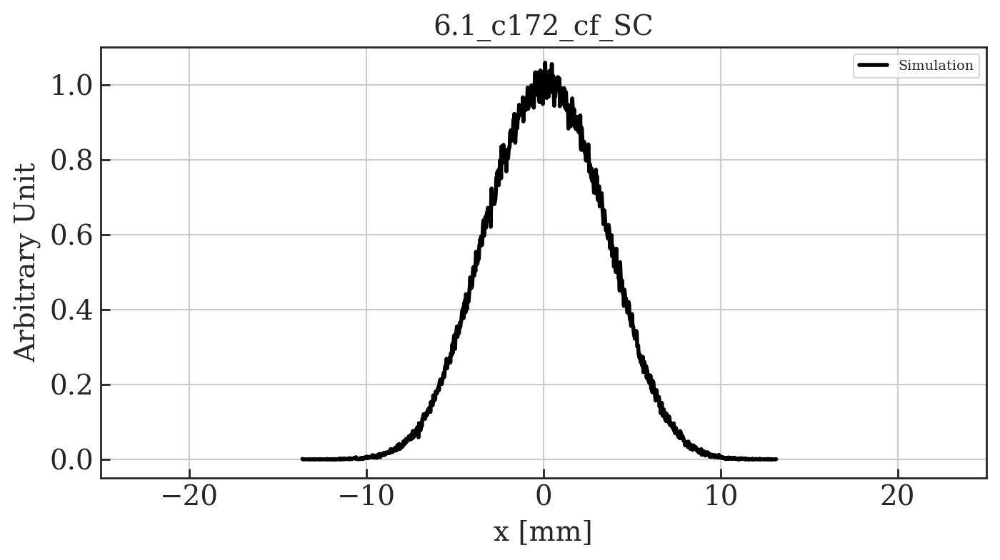

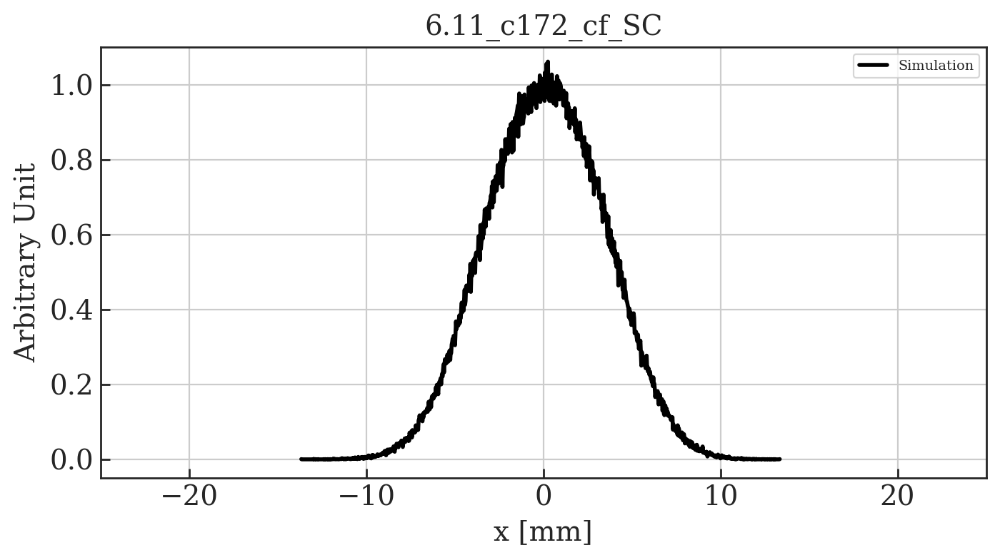

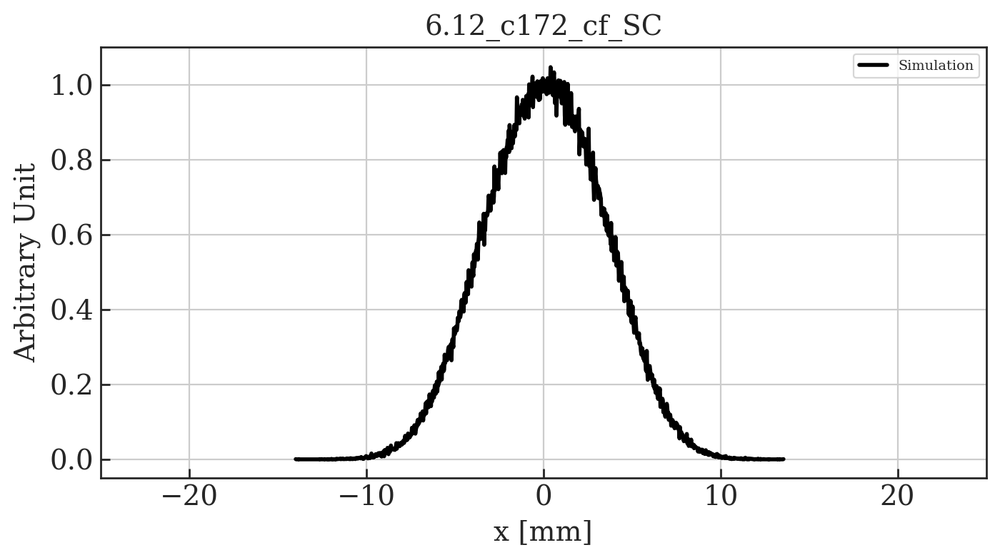

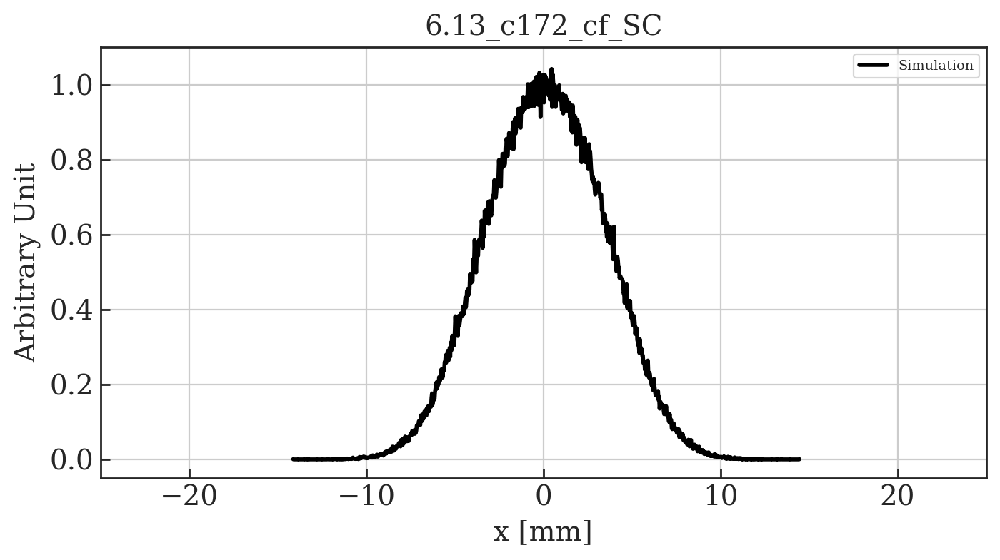

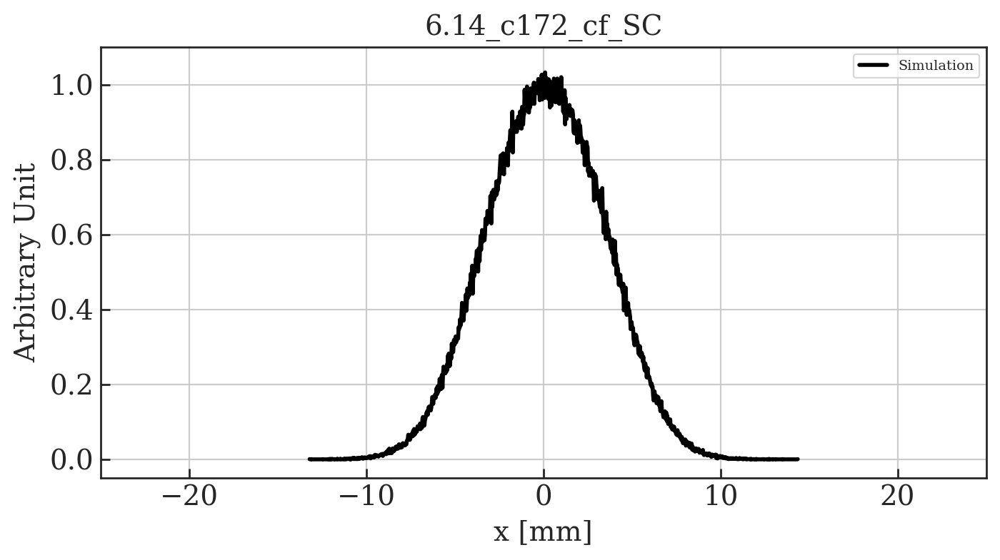

...

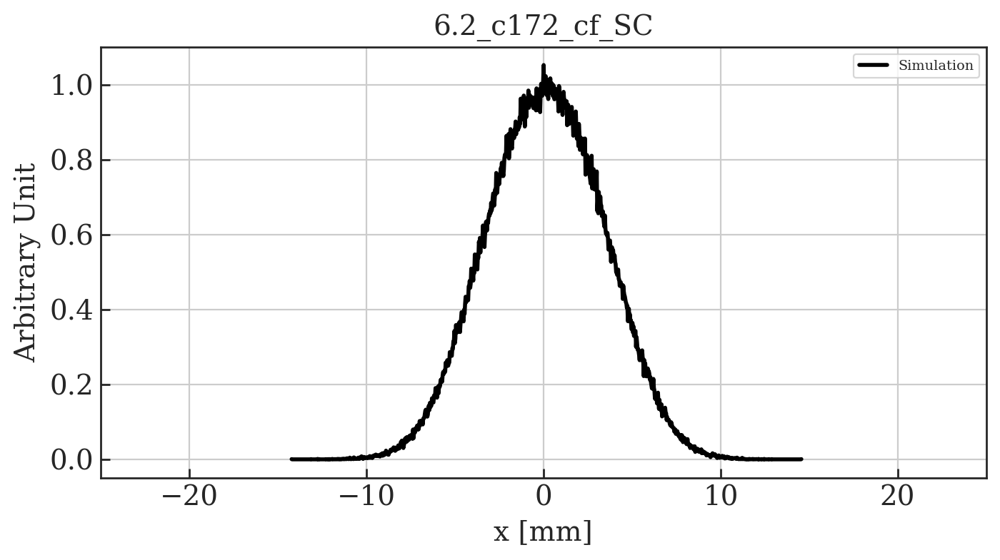

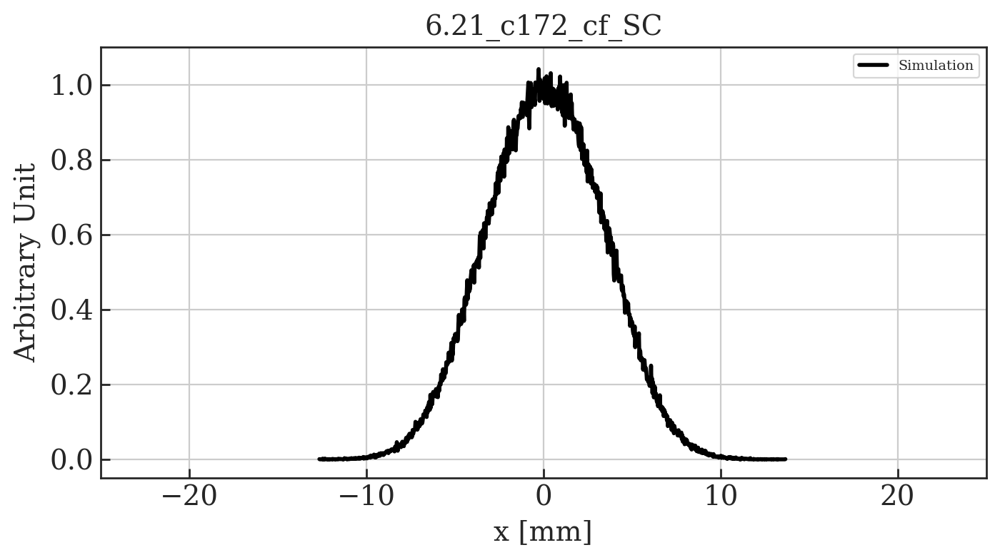

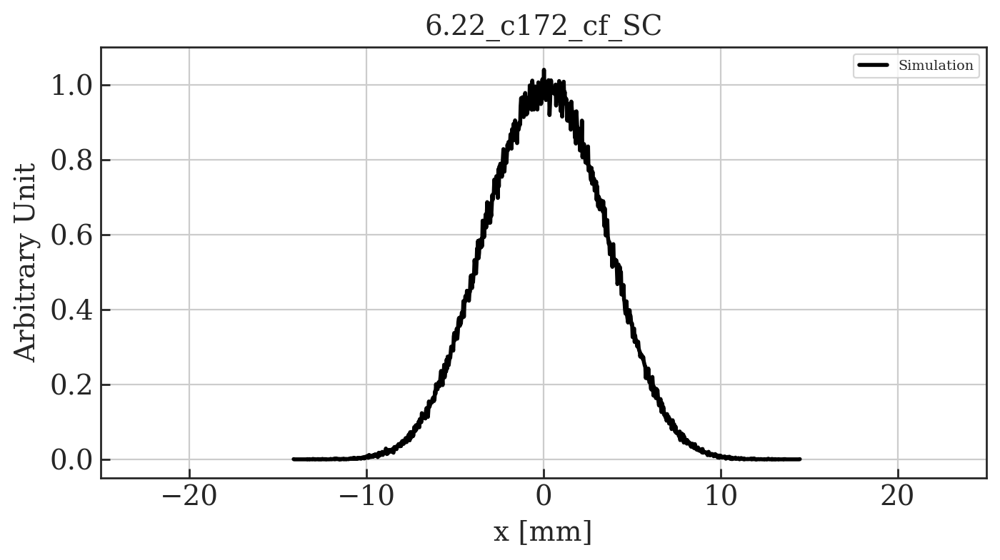

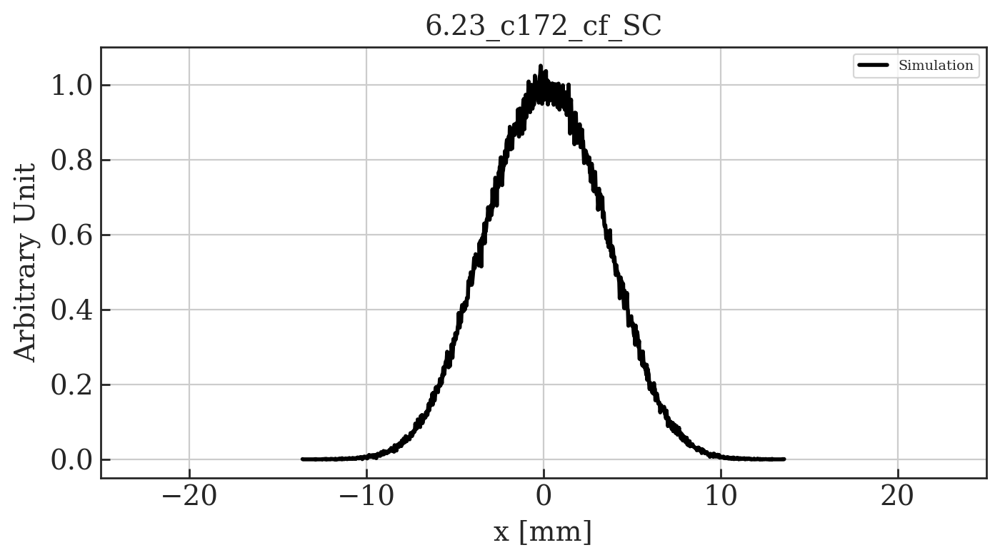

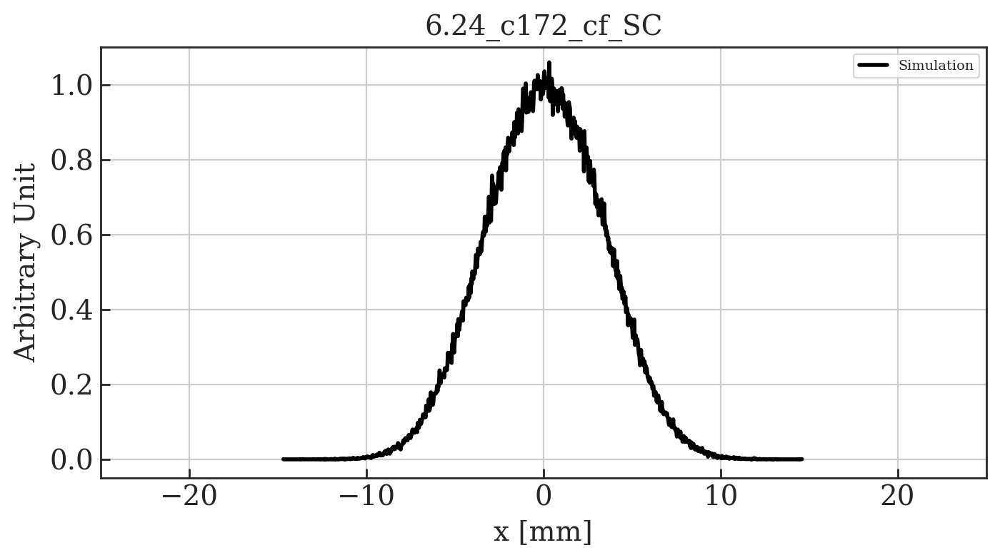

In [66]:
#Main function to plot comparison plots without MD data
verbose = True

plotted_names = []

for key, value in sorted(sims.iteritems()):
    if key not in plotted_names:        
        
        plotted_names.append(key)
        
        this_plot = []
        this_plot.append(value)
        if verbose: print '\nImporting simulation file:', key        

        tune_y = float(key.split('_')[0])/100
        ctime = (key.split('_')[2])
        time = float(ctime.split('c')[1])
        label = (key.split('_')[1])
        if verbose: print 'Qy = ', tune_y, ', ctime =', time, '[ms], label = ', label

        sim_labels=['Simulation']
        
        # Find MD data with same tune and ctime    
        for key1, value1 in sorted(sims.iteritems()):
#             if verbose: print '\tChecking other files:', key1  
            tune_y1 = float(key1.split('_')[0])/100
            ctime1 = (key1.split('_')[2])
            time1 = float(ctime1.split('c')[1])
            label1 = (key1.split('_')[1])
#             if verbose: print '\tQy = ', tune_y1, ', ctime =', time1, '[ms], label = ', label1
            if (tune_y1 == tune_y) and (time1 == time):
                if (label1 != label):
                    print '\tMATCH FOUND' 
                    print '\tQy = ', tune_y1, ', ctime =', time1, '[ms]'
                    print '\tlab = ', label, ', lab1 =', label1

                    this_plot.append(value1)
                    plotted_names.append(key1)
                    sim_labels.append(label1)

        # Find rows in dataframe at correct tune and WS time
        md_points = []
        for i in tune_points[tune_y]:
            if df0['PR.BWS.64.V_ROT:ACQ_DELAY'].iloc()[i] == time:
                md_points.append(i)          

        if verbose: print md_points                 

        # Plot data
        main_label = str(tune_y) + '_' + str(ctime) + '_cf_SC'
        
        if len(this_plot) is 1:
            Plot_profiles_cf_sc_models(df0, md_points, particles_from_matfile(this_plot[0]), main_label=main_label, sim_labels=sim_labels, plot_md=False)  
        elif len(this_plot) is 2:
            Plot_profiles_cf_sc_models(df0, md_points, particles_from_matfile(this_plot[0]), particles_from_matfile(this_plot[1]), main_label=main_label, sim_labels=sim_labels, plot_md=False)  
        elif len(this_plot) is 3:
            Plot_profiles_cf_sc_models(df0, md_points, particles_from_matfile(this_plot[0]), particles_from_matfile(this_plot[1]), particles_from_matfile(this_plot[2]), main_label=main_label, sim_labels=sim_labels, plot_md=False)  
        else: print 'ERROR: More than 3 space charge methods found'
        


# Compare Sims and MD data


Importing simulation file: 610_SbS_c172
Qy =  6.1 , ctime = 172.0 [ms], label =  SbS
[13, 57, 99, 144, 186, 228, 272, 314, 356, 397]

	MAX(y_dat) =  0.06974323877125478
	x_dat[index] =  0.5101055061852797
	index of x_dat =  0.5101055061852797  is  508
	Mean of peak point +/- 3 points =  0.0660118023891166

Importing simulation file: 611_SbS_c172
Qy =  6.11 , ctime = 172.0 [ms], label =  SbS
[12, 56, 98, 143, 227, 271, 313, 396]

	MAX(y_dat) =  0.07514176264415345
	index from y_dat peak not within tolerance of 1 mm. 
	try manual search
	index =  0
	index of x_dat =  -17.916263262407263  is  0
	Mean of peak point +/- 3 points =  1.5546035511359695e-05
	 using peak value

Importing simulation file: 612_SbS_c172
Qy =  6.12 , ctime = 172.0 [ms], label =  SbS
[55, 142, 185, 226, 270, 312]

	MAX(y_dat) =  0.08308656291800687
	x_dat[index] =  -0.8315859025405885
	index of x_dat =  -0.8315859025405885  is  465
	Mean of peak point +/- 3 points =  0.07911387790556623

Importing simulation file: 

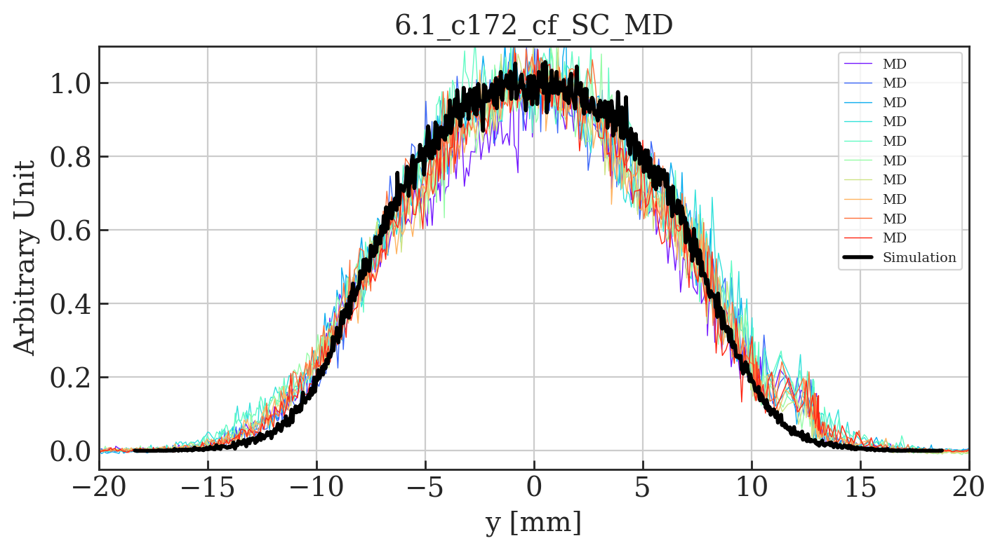

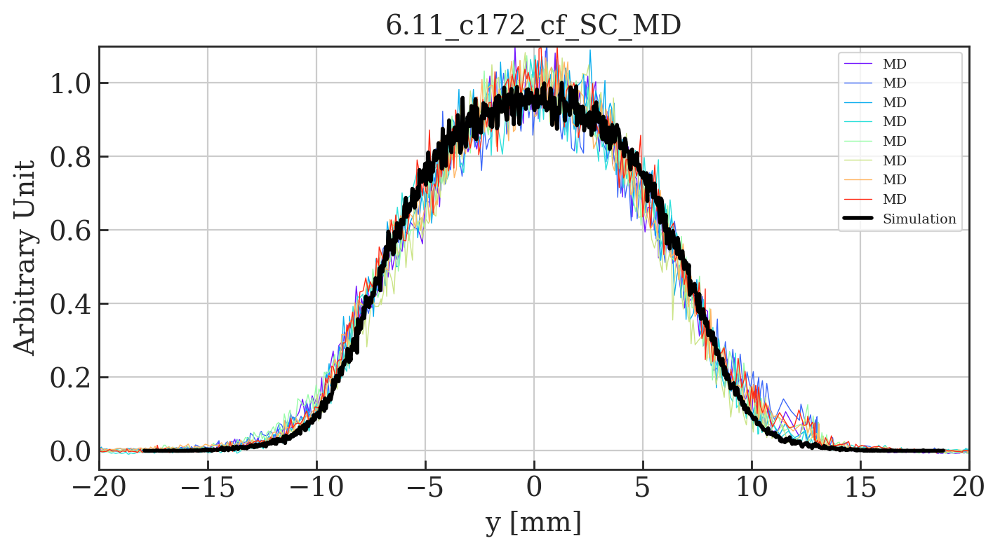

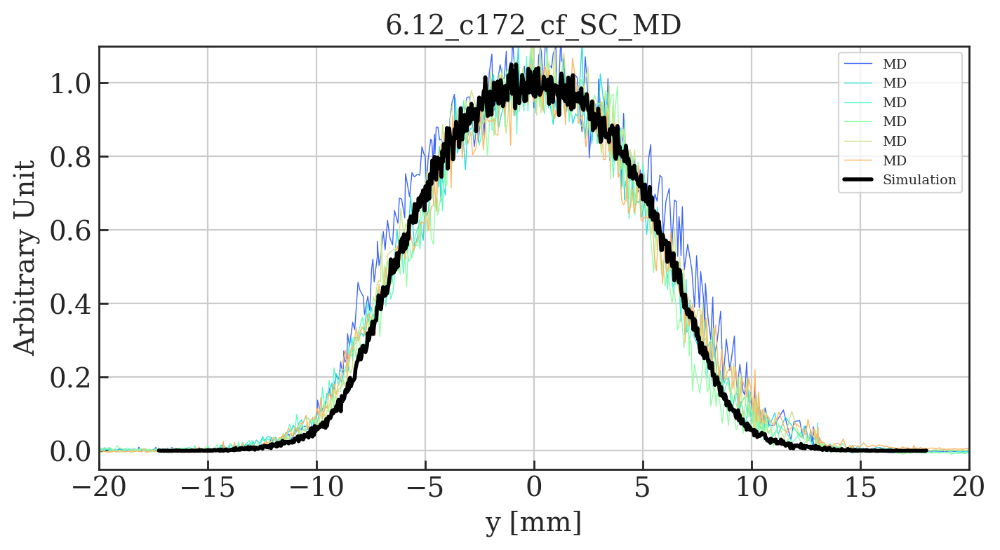

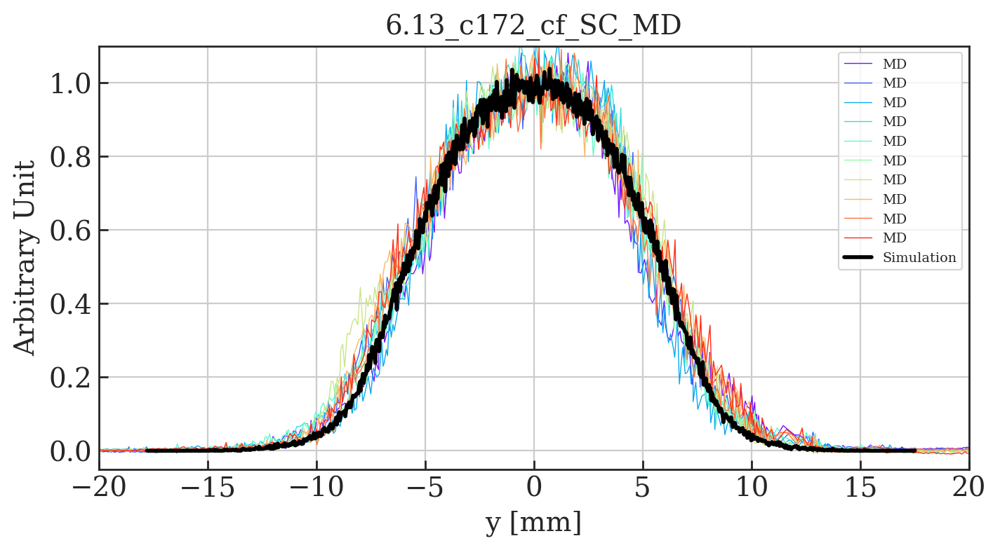

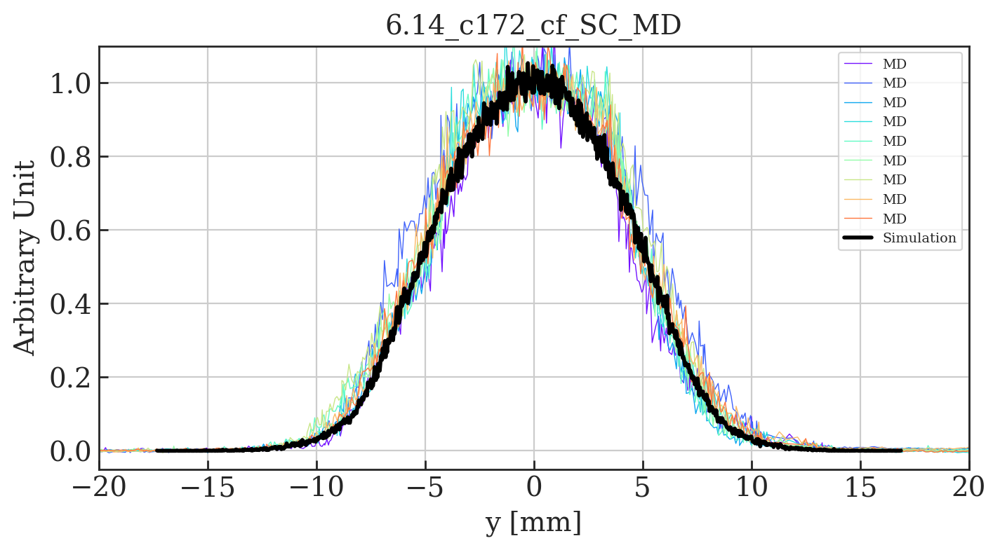

...

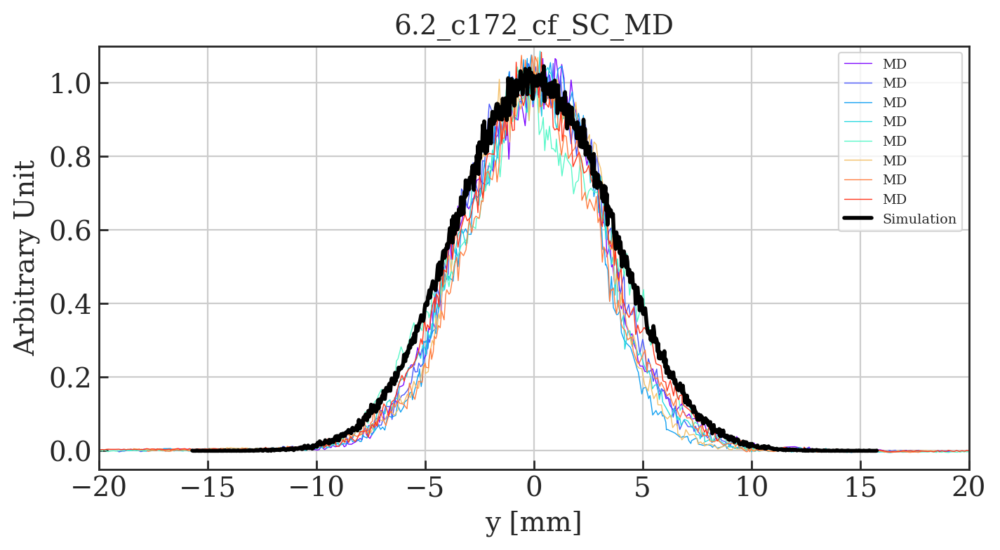

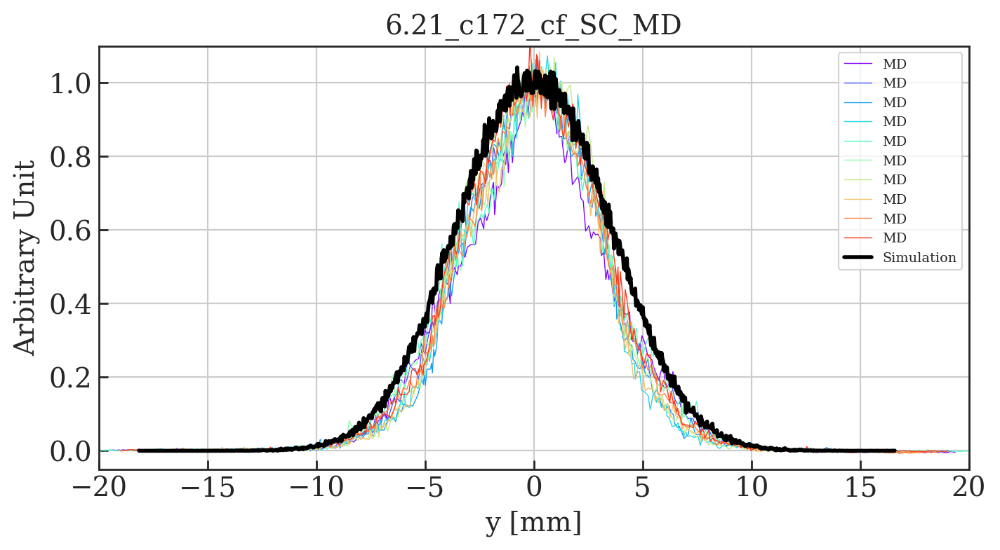

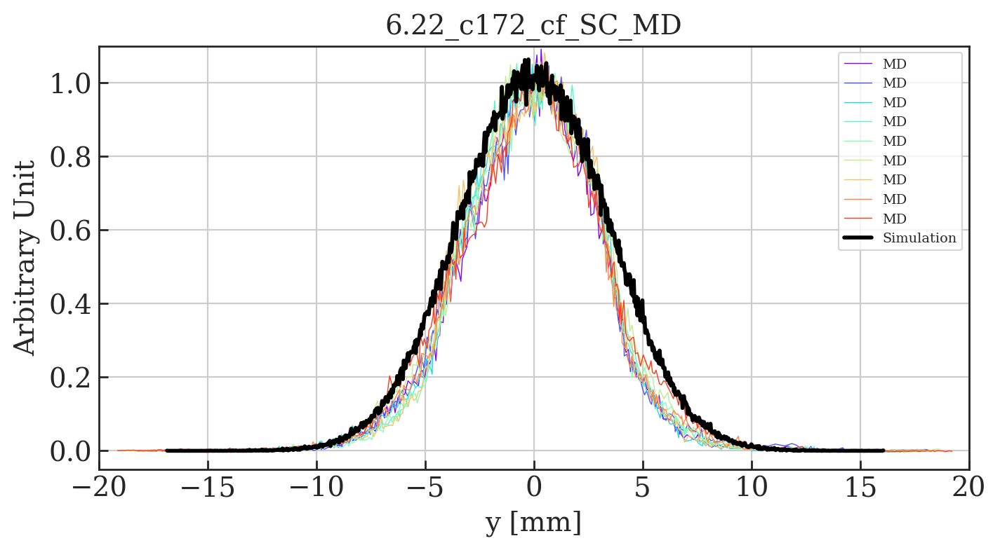

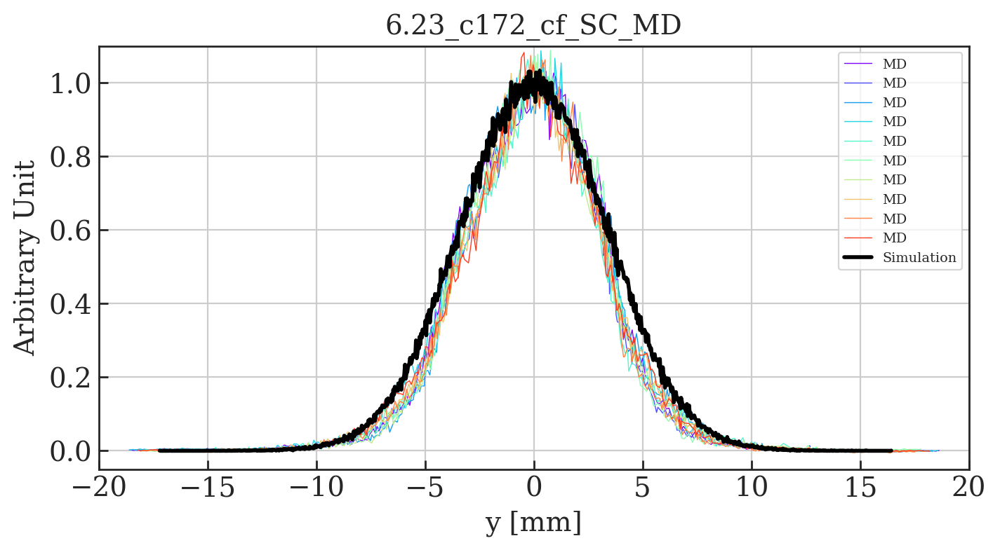

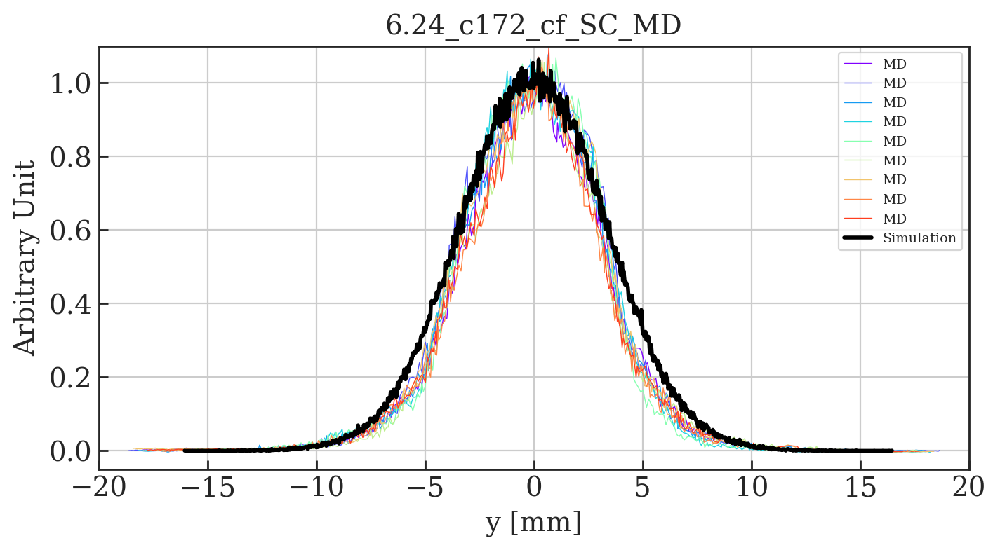

In [82]:
#Main function to plot comparison plots with MD data
verbose = True

plotted_names = []

for key, value in sorted(sims.iteritems()):
    if key not in plotted_names:        
        
        plotted_names.append(key)
        
        this_plot = []
        this_plot.append(value)
        if verbose: print '\nImporting simulation file:', key        

        tune_y = float(key.split('_')[0])/100
        ctime = (key.split('_')[2])
        time = float(ctime.split('c')[1])
        label = (key.split('_')[1])
        if verbose: print 'Qy = ', tune_y, ', ctime =', time, '[ms], label = ', label
        
        sim_labels=['Simulation']

        # Find MD data with same tune and ctime    
        for key1, value1 in sorted(sims.iteritems()):
#             if verbose: print '\tChecking other files:', key1  
            tune_y1 = float(key1.split('_')[0])/100
            ctime1 = (key1.split('_')[2])
            time1 = float(ctime1.split('c')[1])
            label1 = (key1.split('_')[1])
#             if verbose: print '\tQy = ', tune_y1, ', ctime =', time1, '[ms], label = ', label1
            if (tune_y1 == tune_y) and (time1 == time):
                if (label1 != label):
                    print '\tMATCH FOUND' 
                    print '\tQy = ', tune_y1, ', ctime =', time1, '[ms]'
                    print '\tlab = ', label, ', lab1 =', label1

                    this_plot.append(value1)
                    plotted_names.append(key1)
                    sim_labels.append(label1)

        # Find rows in dataframe at correct tune and WS time
        md_points = []
        for i in tune_points[tune_y]:
            if df0['PR.BWS.64.V_ROT:ACQ_DELAY'].iloc()[i] == time:
                md_points.append(i)          

        if verbose: print md_points                 

        # Plot data
        main_label = str(tune_y) + '_' + str(ctime) + '_cf_SC_MD'
        
        if len(this_plot) is 1:
            Plot_profiles_cf_sc_models(df0, md_points, particles_from_matfile(this_plot[0]), 1, main_label=main_label, bins=1000, sim_labels=sim_labels, plot_md=True)  
        elif len(this_plot) is 2:
            Plot_profiles_cf_sc_models(df0, md_points, particles_from_matfile(this_plot[0]), 1, particles_from_matfile(this_plot[1]), main_label=main_label, bins=1000, sim_labels=sim_labels, plot_md=True)  
        elif len(this_plot) is 3:
            Plot_profiles_cf_sc_models(df0, md_points, particles_from_matfile(this_plot[0]), 1, particles_from_matfile(this_plot[1]), particles_from_matfile(this_plot[2]), main_label=main_label, bins=1000, sim_labels=sim_labels, plot_md=True)  
        else: print 'ERROR: More than 3 space charge methods found'
        


# Calculate emittances for simulated bunches

Qy =  6.1 , ctime = 172.0 [ms]
Qy =  6.11 , ctime = 172.0 [ms]
Qy =  6.12 , ctime = 172.0 [ms]
Qy =  6.13 , ctime = 172.0 [ms]
Qy =  6.14 , ctime = 172.0 [ms]
Qy =  6.15 , ctime = 172.0 [ms]
Qy =  6.16 , ctime = 172.0 [ms]
Qy =  6.17 , ctime = 172.0 [ms]
Qy =  6.18 , ctime = 172.0 [ms]
Qy =  6.19 , ctime = 172.0 [ms]
Qy =  6.2 , ctime = 172.0 [ms]
Qy =  6.21 , ctime = 172.0 [ms]
Qy =  6.22 , ctime = 172.0 [ms]
Qy =  6.23 , ctime = 172.0 [ms]
Qy =  6.24 , ctime = 172.0 [ms]


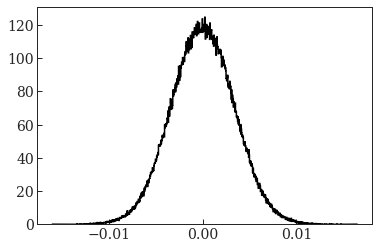

In [83]:
# Make dataframe with name, tunes, position V, profile V 
data = []

# Each row as a list
for key, value in sorted(sims.iteritems()):
    
    tune_y = float(key.split('_')[0])/100
    ctime = (key.split('_')[2])
    time = float(ctime.split('c')[1])
    if verbose: print 'Qy = ', tune_y, ', ctime =', time, '[ms]'

    d = particles_from_matfile(value)
    plt.clf()
    x1, bins_1, p1 = plt.hist(d['particles']['y'][0][0][0], bins = 1000, density=True, histtype=u'step', lw=1.5, color='k')
          
    qx = 6.21
    qy = tune_y
    pos = np.array(bins_1[:-1]) + (abs(bins_1[0]-bins_1[1])/2)
    prof = x1
    
    new_data = [qx, qy, pos, prof]
    
    data.append(new_data)    

# Create dataframe
df_sim = pd.DataFrame(data, columns = ['Qx', 'Qy', 'PR.BWS.64.V_ROT:PROF_POSITION_IN', 'PR.BWS.64.V_ROT:PROF_DATA_IN'])

In [84]:
df_sim

,Qx,Qy,PR.BWS.64.V_ROT:PROF_POSITION_IN,PR.BWS.64.V_ROT:PROF_DATA_IN
0,6.21,6.10,"[-0.018336524262631777, -0.018299388046338537,...","[0.05385578283494196, 0.053855782834946984, 0...."
1,6.21,6.11,"[-0.017897884667716323, -0.017861127478334432,...","[0.05441112428975725, 0.0, 0.0, 0.0, 0.0, 0.0,..."
2,6.21,6.12,"[-0.017234274281224933, -0.017198961712056614,...","[0.05663705720382146, 0.05663705720382146, 0.0..."
3,6.21,6.13,"[-0.01777937036092625, -0.017744034386433065, ...","[0.056599542779999644, 0.0, 0.0, 0.0, 0.0, 0.0..."
4,6.21,6.14,"[-0.017314391108265735, -0.017280163423243088,...","[0.05843223106314832, 0.0, 0.0, 0.0, 0.0, 0.0,..."
5,6.21,6.15,"[-0.01678995136447054, -0.01675551975533863, -...","[0.058086161246135234, 0.0, 0.0, 0.0, 0.0, 0.0..."
6,6.21,6.16,"[-0.01662956274958312, -0.01659519894699174, -...","[0.058200776665554954, 0.0, 0.0, 0.0, 0.0, 0.0..."
7,6.21,6.17,"[-0.01676523009449811, -0.016731565127919068, ...","[0.059408940606081255, 0.0, 0.0, 0.0, 0.0, 0.0..."
8,6.21,6.18,"[-0.01701738602640985, -0.016985528885475082, ...","[0.06278027284669269, 0.0, 0.0, 0.0, 0.0, 0.0,..."
9,6.21,6.19,"[-0.016749978476160467, -0.01671705404308459, ...","[0.06074516136362366, 0.0, 0.0, 0.0, 0.0, 0.0,..."


In [85]:
# Gaussian and 2nd moment fits
df_sim_filtered = Multi_filter_sim(df_sim, with_plot = True, WS = '64.V', smooth=True)


Multi_filter row  0

	initial guess: mu0 -1.1053199025704685
	initial guess: offs0 0.0
	initial guess: ampl 65.9025520867946
	initial guess: slope 0
	initial guess: sigma0 29.015132900022692
3 parameter fit sigma =  5.831853534405726  +/-  0.025243763483920295
Removing centre shift of  -0.00434768869205144
Second moment =  5.215901335311988


/usr/local/bin/start_ipykernel.py:81: RuntimeWarning: invalid value encountered in sqrt
/usr/local/bin/start_ipykernel.py:83: RuntimeWarning: invalid value encountered in sqrt



Multi_filter row  1

	initial guess: mu0 -0.32794814317416676
	initial guess: offs0 0.0
	initial guess: ampl 71.76257272516827
	initial guess: slope 0
	initial guess: sigma0 28.71899297778035
3 parameter fit sigma =  5.334954341390913  +/-  0.024579907901204522
Removing centre shift of  0.00947283687889983
Second moment =  4.762883257919629

Multi_filter row  2

	initial guess: mu0 -0.0017405270850805177
	initial guess: offs0 0.003775803813588097
	initial guess: ampl 79.1111809028423
	initial guess: slope 0
	initial guess: sigma0 27.590287587986268
3 parameter fit sigma =  4.878358891590908  +/-  0.01909606667381773
Removing centre shift of  0.000970769978310762
Second moment =  4.411964186837485

Multi_filter row  3

	initial guess: mu0 0.5953363755296405
	initial guess: offs0 0.0
	initial guess: ampl 85.19524892225054
	initial guess: slope 0
	initial guess: sigma0 27.60857455093813
3 parameter fit sigma =  4.540819756131624  +/-  0.015439410832785485
Removing centre shift of  0.0075

In [86]:
df_sim_filtered

,Qx,Qy,PR.BWS.64.V_ROT:PROF_POSITION_IN,PR.BWS.64.V_ROT:PROF_DATA_IN,2ndMoment V,sig V,sig errV,A V,mu V,position V,profile V
0,6.21,6.10,"[-0.018336524262631777, -0.018299388046338537,...","[0.05385578283494196, 0.053855782834946984, 0....",5.215901,5.831853534405726,0.025244,1032.1057238657932,-0.00434768869205144,"[-18.332176573939726, -18.295040357646485, -18...","[0.024683900466016165, 0.022183453405822322, 0..."
1,6.21,6.11,"[-0.017897884667716323, -0.017861127478334432,...","[0.05441112428975725, 0.0, 0.0, 0.0, 0.0, 0.0,...",4.762883,5.334954341390913,0.024580,1032.8427902309593,0.00947283687889983,"[-17.907357504595222, -17.87060031521333, -17....","[0.00725481657196764, 0.007254816571967639, 0...."
2,6.21,6.12,"[-0.017234274281224933, -0.017198961712056614,...","[0.05663705720382146, 0.05663705720382146, 0.0...",4.411964,4.878358891590908,0.019096,1029.1173228332207,0.000970769978310762,"[-17.235245051203243, -17.199932482034924, -17...","[0.034926185275689886, 0.03209433241549881, 0...."
3,6.21,6.13,"[-0.01777937036092625, -0.017744034386433065, ...","[0.056599542779999644, 0.0, 0.0, 0.0, 0.0, 0.0...",4.155427,4.540819756131624,0.015439,1025.7884941811117,0.007599674860356468,"[-17.786970035786606, -17.75163406129342, -17....","[0.013678222838499917, 0.012263234268999926, 0..."
4,6.21,6.14,"[-0.017314391108265735, -0.017280163423243088,...","[0.05843223106314832, 0.0, 0.0, 0.0, 0.0, 0.0,...",3.940359,4.2031453134318175,0.009685,1018.7506992786883,0.0008299039660170277,"[-17.315221012231753, -17.280993327209107, -17...","[0.014121122506927514, 0.012660316730348805, 0..."
5,6.21,6.15,"[-0.01678995136447054, -0.01675551975533863, -...","[0.058086161246135234, 0.0, 0.0, 0.0, 0.0, 0.0...",3.799143,3.9956166865087868,0.007325,1014.7396923476972,0.00024145258702294012,"[-16.790192817057566, -16.75576120792565, -16....","[0.01403748896781602, 0.01258533493666264, 0.0..."
6,6.21,6.16,"[-0.01662956274958312, -0.01659519894699174, -...","[0.058200776665554954, 0.0, 0.0, 0.0, 0.0, 0.0...",3.699441,3.8465746999707298,0.005848,1011.511268744237,0.00950898128818117,"[-16.6390717308713, -16.60470792827992, -16.57...","[0.014065187694175781, 0.012610168277536906, 0..."
7,6.21,6.17,"[-0.01676523009449811, -0.016731565127919068, ...","[0.059408940606081255, 0.0, 0.0, 0.0, 0.0, 0.0...",3.633305,3.740254472779564,0.004343,1008.6114055547016,0.0035260855459757013,"[-16.768756180044086, -16.735091213465044, -16...","[0.014357160646469642, 0.01287193713131761, 0...."
8,6.21,6.18,"[-0.01701738602640985, -0.016985528885475082, ...","[0.06278027284669269, 0.0, 0.0, 0.0, 0.0, 0.0,...",3.580267,3.6616135251652673,0.003272,1006.6151800473162,0.004485537690597465,"[-17.021871564100447, -16.99001442316568, -16....","[0.015171899271284072, 0.013602392450116754, 0..."
9,6.21,6.19,"[-0.016749978476160467, -0.01671705404308459, ...","[0.06074516136362366, 0.0, 0.0, 0.0, 0.0, 0.0,...",3.536816,3.6009308890506113,0.002408,1005.2002456720561,0.0022186634570713084,"[-16.75219713961754, -16.719272706541663, -16....","[0.014680080662875718, 0.013161451628785126, 0..."


# Calculate Emittance for simulated bunches

In [87]:
# Calculate emittances in Vertical
df_sim_emittance = emittance_df(df_sim_filtered, WS='64.V', verbose=True)

Emittance  0  =  3.2510024815930265
Emittance  1  =  2.7616962045692572
Emittance  2  =  2.3369359089161788
Emittance  3  =  2.0442827130710373
Emittance  4  =  1.7652560412328968
Emittance  5  =  1.6054311524219893
Emittance  6  =  1.4956855938010798
Emittance  7  =  1.4202336836399745
Emittance  8  =  1.3659643508628896
Emittance  9  =  1.32492160615831
Emittance  10  =  1.303465731746498
Emittance  11  =  1.2560220843746064
Emittance  12  =  1.2121659017911608
Emittance  13  =  1.1726775661341282
Emittance  14  =  1.1575978408200618


In [88]:
df_sim_emittance

,Qx,Qy,PR.BWS.64.V_ROT:PROF_POSITION_IN,PR.BWS.64.V_ROT:PROF_DATA_IN,2ndMoment V,sig V,sig errV,A V,mu V,position V,profile V,emittance V,betx,bety,dx,dy
0,6.21,6.10,"[-0.018336524262631777, -0.018299388046338537,...","[0.05385578283494196, 0.053855782834946984, 0....",5.215901,5.831853534405726,0.025244,1032.1057238657932,-0.00434768869205144,"[-18.332176573939726, -18.295040357646485, -18...","[0.024683900466016165, 0.022183453405822322, 0...",3.251002,12.391799,23.637581,NaN,NaN
1,6.21,6.11,"[-0.017897884667716323, -0.017861127478334432,...","[0.05441112428975725, 0.0, 0.0, 0.0, 0.0, 0.0,...",4.762883,5.334954341390913,0.024580,1032.8427902309593,0.00947283687889983,"[-17.907357504595222, -17.87060031521333, -17....","[0.00725481657196764, 0.007254816571967639, 0....",2.761696,12.404327,23.285878,NaN,NaN
2,6.21,6.12,"[-0.017234274281224933, -0.017198961712056614,...","[0.05663705720382146, 0.05663705720382146, 0.0...",4.411964,4.878358891590908,0.019096,1029.1173228332207,0.000970769978310762,"[-17.235245051203243, -17.199932482034924, -17...","[0.034926185275689886, 0.03209433241549881, 0....",2.336936,12.416825,23.009533,NaN,NaN
3,6.21,6.13,"[-0.01777937036092625, -0.017744034386433065, ...","[0.056599542779999644, 0.0, 0.0, 0.0, 0.0, 0.0...",4.155427,4.540819756131624,0.015439,1025.7884941811117,0.007599674860356468,"[-17.786970035786606, -17.75163406129342, -17....","[0.013678222838499917, 0.012263234268999926, 0...",2.044283,12.429283,22.789494,NaN,NaN
4,6.21,6.14,"[-0.017314391108265735, -0.017280163423243088,...","[0.05843223106314832, 0.0, 0.0, 0.0, 0.0, 0.0,...",3.940359,4.2031453134318175,0.009685,1018.7506992786883,0.0008299039660170277,"[-17.315221012231753, -17.280993327209107, -17...","[0.014121122506927514, 0.012660316730348805, 0...",1.765256,12.441691,22.612481,NaN,NaN
5,6.21,6.15,"[-0.01678995136447054, -0.01675551975533863, -...","[0.058086161246135234, 0.0, 0.0, 0.0, 0.0, 0.0...",3.799143,3.9956166865087868,0.007325,1014.7396923476972,0.00024145258702294012,"[-16.790192817057566, -16.75576120792565, -16....","[0.01403748896781602, 0.01258533493666264, 0.0...",1.605431,12.454044,22.468965,NaN,NaN
6,6.21,6.16,"[-0.01662956274958312, -0.01659519894699174, -...","[0.058200776665554954, 0.0, 0.0, 0.0, 0.0, 0.0...",3.699441,3.8465746999707298,0.005848,1011.511268744237,0.00950898128818117,"[-16.6390717308713, -16.60470792827992, -16.57...","[0.014065187694175781, 0.012610168277536906, 0...",1.495686,12.466338,22.351936,NaN,NaN
7,6.21,6.17,"[-0.01676523009449811, -0.016731565127919068, ...","[0.059408940606081255, 0.0, 0.0, 0.0, 0.0, 0.0...",3.633305,3.740254472779564,0.004343,1008.6114055547016,0.0035260855459757013,"[-16.768756180044086, -16.735091213465044, -16...","[0.014357160646469642, 0.01287193713131761, 0....",1.420234,12.478571,22.256128,NaN,NaN
8,6.21,6.18,"[-0.01701738602640985, -0.016985528885475082, ...","[0.06278027284669269, 0.0, 0.0, 0.0, 0.0, 0.0,...",3.580267,3.6616135251652673,0.003272,1006.6151800473162,0.004485537690597465,"[-17.021871564100447, -16.99001442316568, -16....","[0.015171899271284072, 0.013602392450116754, 0...",1.365964,12.490741,22.177508,NaN,NaN
9,6.21,6.19,"[-0.016749978476160467, -0.01671705404308459, ...","[0.06074516136362366, 0.0, 0.0, 0.0, 0.0, 0.0,...",3.536816,3.6009308890506113,0.002408,1005.2002456720561,0.0022186634570713084,"[-16.75219713961754, -16.719272706541663, -16....","[0.014680080662875718, 0.013161451628785126, 0...",1.324922,12.502846,22.112941,NaN,NaN


In [89]:
df_sim_emittance_2 = emittance_df_2(df_sim_emittance, WS='64.V', verbose=True)

Emittance from 2nd moment 0  =  2.6005356979206247
Emittance from 2nd moment 1  =  2.201173941165556
Emittance from 2nd moment 2  =  1.9114514171656614
Emittance from 2nd moment 3  =  1.711999729290482
Emittance from 2nd moment 4  =  1.551423555000339
Emittance from 2nd moment 5  =  1.451427597946281
Emittance from 2nd moment 6  =  1.3834520662567824
Emittance from 2nd moment 7  =  1.3401743865324443
Emittance from 2nd moment 8  =  1.3059462226929381
Emittance from 2nd moment 9  =  1.2781607808307325
Emittance from 2nd moment 10  =  1.2535706199237713
Emittance from 2nd moment 11  =  1.2144605899863037
Emittance from 2nd moment 12  =  1.1800450376200857
Emittance from 2nd moment 13  =  1.1590829197481654
Emittance from 2nd moment 14  =  1.1617205987128187


# Calculate Emittance using 2nd moment for simulated bunches

In [75]:
df_sim_emittance_2

,Qx,Qy,PR.BWS.64.V_ROT:PROF_POSITION_IN,PR.BWS.64.V_ROT:PROF_DATA_IN,2ndMoment V,sig V,sig errV,A V,mu V,position V,profile V,emittance V,betx,bety,dx,dy,emittance V 2ndMoment
0,6.21,6.10,"[-0.018336524262631777, -0.018299388046338537,...","[0.05385578283494196, 0.053855782834946984, 0....",5.215901,5.831853534405726,0.025244,1032.1057238657932,-0.00434768869205144,"[-18.332176573939726, -18.295040357646485, -18...","[0.024683900466016165, 0.022183453405822322, 0...",3.251002,12.391799,23.637581,NaN,NaN,2.600536
1,6.21,6.11,"[-0.017897884667716323, -0.017861127478334432,...","[0.05441112428975725, 0.0, 0.0, 0.0, 0.0, 0.0,...",4.762883,5.334954341390913,0.024580,1032.8427902309593,0.00947283687889983,"[-17.907357504595222, -17.87060031521333, -17....","[0.00725481657196764, 0.007254816571967639, 0....",2.761696,12.404327,23.285878,NaN,NaN,2.201174
2,6.21,6.12,"[-0.017234274281224933, -0.017198961712056614,...","[0.05663705720382146, 0.05663705720382146, 0.0...",4.411964,4.878358891590908,0.019096,1029.1173228332207,0.000970769978310762,"[-17.235245051203243, -17.199932482034924, -17...","[0.034926185275689886, 0.03209433241549881, 0....",2.336936,12.416825,23.009533,NaN,NaN,1.911451
3,6.21,6.13,"[-0.01777937036092625, -0.017744034386433065, ...","[0.056599542779999644, 0.0, 0.0, 0.0, 0.0, 0.0...",4.155427,4.540819756131624,0.015439,1025.7884941811117,0.007599674860356468,"[-17.786970035786606, -17.75163406129342, -17....","[0.013678222838499917, 0.012263234268999926, 0...",2.044283,12.429283,22.789494,NaN,NaN,1.712000
4,6.21,6.14,"[-0.017314391108265735, -0.017280163423243088,...","[0.05843223106314832, 0.0, 0.0, 0.0, 0.0, 0.0,...",3.940359,4.2031453134318175,0.009685,1018.7506992786883,0.0008299039660170277,"[-17.315221012231753, -17.280993327209107, -17...","[0.014121122506927514, 0.012660316730348805, 0...",1.765256,12.441691,22.612481,NaN,NaN,1.551424
5,6.21,6.15,"[-0.01678995136447054, -0.01675551975533863, -...","[0.058086161246135234, 0.0, 0.0, 0.0, 0.0, 0.0...",3.799143,3.9956166865087868,0.007325,1014.7396923476972,0.00024145258702294012,"[-16.790192817057566, -16.75576120792565, -16....","[0.01403748896781602, 0.01258533493666264, 0.0...",1.605431,12.454044,22.468965,NaN,NaN,1.451428
6,6.21,6.16,"[-0.01662956274958312, -0.01659519894699174, -...","[0.058200776665554954, 0.0, 0.0, 0.0, 0.0, 0.0...",3.699441,3.8465746999707298,0.005848,1011.511268744237,0.00950898128818117,"[-16.6390717308713, -16.60470792827992, -16.57...","[0.014065187694175781, 0.012610168277536906, 0...",1.495686,12.466338,22.351936,NaN,NaN,1.383452
7,6.21,6.17,"[-0.01676523009449811, -0.016731565127919068, ...","[0.059408940606081255, 0.0, 0.0, 0.0, 0.0, 0.0...",3.633305,3.740254472779564,0.004343,1008.6114055547016,0.0035260855459757013,"[-16.768756180044086, -16.735091213465044, -16...","[0.014357160646469642, 0.01287193713131761, 0....",1.420234,12.478571,22.256128,NaN,NaN,1.340174
8,6.21,6.18,"[-0.01701738602640985, -0.016985528885475082, ...","[0.06278027284669269, 0.0, 0.0, 0.0, 0.0, 0.0,...",3.580267,3.6616135251652673,0.003272,1006.6151800473162,0.004485537690597465,"[-17.021871564100447, -16.99001442316568, -16....","[0.015171899271284072, 0.013602392450116754, 0...",1.365964,12.490741,22.177508,NaN,NaN,1.305946
9,6.21,6.19,"[-0.016749978476160467, -0.01671705404308459, ...","[0.06074516136362366, 0.0, 0.0, 0.0, 0.0, 0.0,...",3.536816,3.6009308890506113,0.002408,1005.2002456720561,0.0022186634570713084,"[-16.75219713961754, -16.719272706541663, -16....","[0.014680080662875718, 0.013161451628785126, 0...",1.324922,12.502846,22.112941,NaN,NaN,1.278161


# Save simulation dataframe to pickle file

In [76]:
df_sim_emittance_2.to_pickle('MD4224_HighBrightness_Vertical_Using_Sim_Optics_Complete_simulation_data')

In [77]:
df0_sim = pnd.read_pickle('MD4224_HighBrightness_Vertical_Using_Sim_Optics_Complete_simulation_data')

# Plots

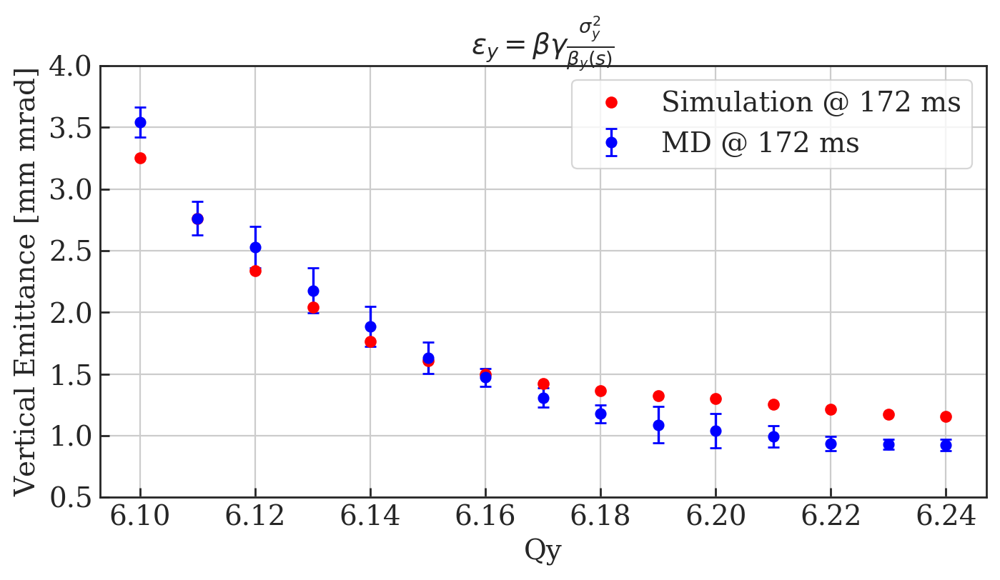

In [90]:
# Plot averaged data points with error bars
fig=plt.figure(figsize=(8, 4), dpi= 200, facecolor='w', edgecolor='k');
x_data = np.linspace(610, 624, 15);
x_data = x_data/100;

y_data_172 = []
y_error_172 = []

for i in x_data:
    
    upper_lim = i+0.0049999999999 - 6
    lower_lim = i-0.0049999999999 - 6
    
    y_data_172.append( np.mean( df0['emittance V'][(df0['PR.BWS.64.V_ROT:ACQ_DELAY']==172)][(df0['Qy']>lower_lim)][(df0['Qy']<upper_lim)] ) )
    y_error_172.append( np.std( df0['emittance V'][(df0['PR.BWS.64.V_ROT:ACQ_DELAY']==172)][(df0['Qy']>lower_lim)][(df0['Qy']<upper_lim)] ) )
    
plt.errorbar(x_data, y_data_172, y_error_172, label='MD @ 172 ms', linestyle='None', marker='o', capsize=3, color='b')

plt.plot(df0_sim['Qy'], df0_sim['emittance V'], label='Simulation @ 172 ms', linestyle='None', marker='o', color='r', markersize=5)

plt.xlabel('Qy');
plt.ylabel('Vertical Emittance [mm mrad]');

plt.title(r'$\epsilon_{y} = \beta\gamma \frac{\sigma_y^2}{\beta_{y}(s)}$')

plt.ylim(0.5, 4);

plt.legend();
plt.grid();
fig.savefig('MD4224_Vertical_Manual_Fit_WS_Delay_Emittance_Errors_Using_Sim_Optics_Sim_172.png');

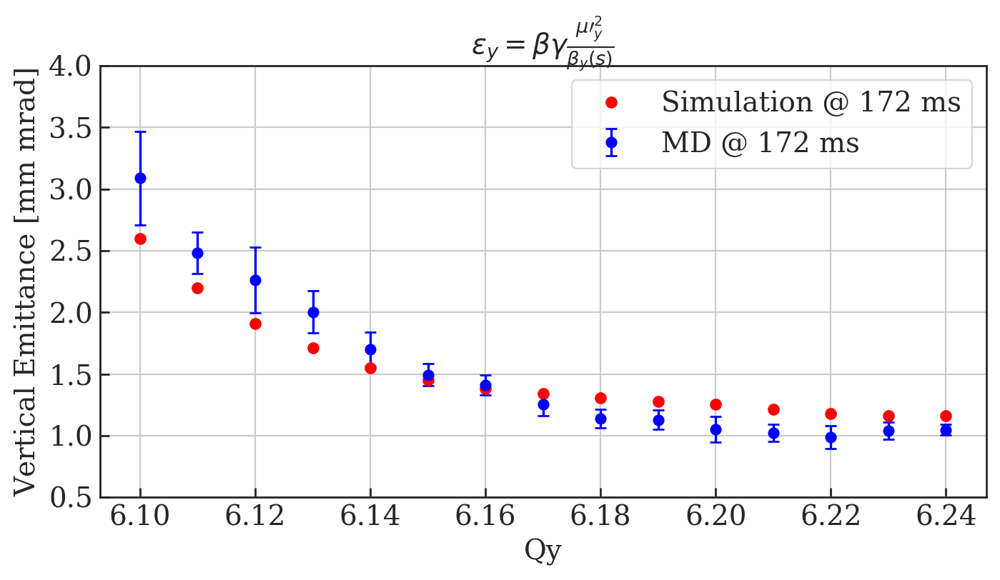

In [91]:
# Plot averaged data points with error bars
fig=plt.figure(figsize=(8, 4), dpi= 200, facecolor='w', edgecolor='k');
x_data = np.linspace(610, 624, 15);
x_data = x_data/100;

y_data_172 = []
y_error_172 = []

for i in x_data:
    
    upper_lim = i+0.0049999999999 - 6
    lower_lim = i-0.0049999999999 - 6
    
    y_data_172.append( np.mean( df0['emittance V 2ndMoment'][(df0['PR.BWS.64.V_ROT:ACQ_DELAY']==172)][(df0['Qy']>lower_lim)][(df0['Qy']<upper_lim)] ) )
    y_error_172.append( np.std( df0['emittance V 2ndMoment'][(df0['PR.BWS.64.V_ROT:ACQ_DELAY']==172)][(df0['Qy']>lower_lim)][(df0['Qy']<upper_lim)] ) )
    
plt.errorbar(x_data, y_data_172, y_error_172, label='MD @ 172 ms', linestyle='None', marker='o', capsize=3, color='b')

plt.plot(df0_sim['Qy'], df0_sim['emittance V 2ndMoment'], label='Simulation @ 172 ms', linestyle='None', marker='o', color='r', markersize=5)

plt.xlabel('Qy');
plt.ylabel('Vertical Emittance [mm mrad]');

plt.title(r'$\epsilon_{y} = \beta\gamma \frac{\mu\prime^{2}_{y}}{\beta_{y}(s)}$')

plt.ylim(0.5, 4);

plt.legend();
plt.grid();
fig.savefig('MD4224_Vertical_Manual_Fit_WS_Delay_Emittance_2nd_Errors_Using_Sim_Optics_Sim_172.png');

# Core Fit

In [80]:
df0

,PR.BWS.64.V_ROT:ACQ_DELAY,PR.BWS.64.V_ROT:PROF_POSITION_IN,PR.BWS.64.V_ROT:PROF_DATA_IN,cycleStamp,2ndMoment V,sig V,sig errV,A V,mu V,position V,...,Qy,intensity,losses,ratio,emittance V,betx,bety,dx,dy,emittance V 2ndMoment
2018-09-05 10:20:30.700,172.0,"[50000.0, 50000.0, 50000.0, 50000.0, 50000.0, ...","[0.17229545882224, 0.17229545882224, 0.1735024...",1.536143e+09,3.281589,2.9994494508823175,0.011036,4.674117219845751,1.194792438636508,"[17.99320756136349, 17.913207561363492, 17.750...",...,0.239078,7.548161e+11,1.698342,0.983017,0.926889,12.561293,21.931204,NaN,NaN,1.109463
2018-09-05 10:21:06.700,172.0,"[50000.0, 50000.0, 50000.0, 50000.0, 50000.0, ...","[0.173906630666387, 0.173300683154985, 0.17289...",1.536143e+09,3.203431,3.1059290861276785,0.017218,4.735926944681591,1.0613386155296278,"[18.633661384470372, 18.52566138447037, 18.498...",...,0.229331,7.327544e+11,2.203742,0.977963,0.992827,12.549813,21.954145,NaN,NaN,1.056140
2018-09-05 10:21:42.700,172.0,"[50000.0, 50000.0, 50000.0, 50000.0, 50000.0, ...","[0.173906630666387, 0.173704413116415, 0.17471...",1.536143e+09,3.013625,2.877569760386751,0.013372,4.210207115773017,1.1427805475505157,"[17.169219452449486, 17.089219452449484, 16.95...",...,0.219715,6.951734e+11,2.985061,0.970149,0.851120,12.538425,21.982050,NaN,NaN,0.933506
2018-09-05 10:22:18.700,172.0,"[50000.0, 50000.0, 50000.0, 50000.0, 50000.0, ...","[0.172095114732879, 0.17129606525681, 0.171096...",1.536143e+09,3.192118,3.240216833707556,0.019804,4.449373960361013,1.0897481518960797,"[19.37725184810392, 19.26125184810392, 19.1432...",...,0.209510,7.361018e+11,3.982576,0.960174,1.077378,12.526272,22.018476,NaN,NaN,1.045629
2018-09-05 10:22:54.700,172.0,"[50000.0, 50000.0, 50000.0, 50000.0, 50000.0, ...","[0.173906630666387, 0.173099170197014, 0.17330...",1.536143e+09,3.275086,3.180944840805123,0.017962,4.441083033668285,0.9197659734003868,"[19.080234026599612, 18.99523402659961, 18.911...",...,0.199719,7.079539e+11,2.690493,0.973095,1.036307,12.514547,22.061295,NaN,NaN,1.098554
2018-09-05 10:23:30.700,172.0,"[50000.0, 50000.0, 50000.0, 50000.0, 50000.0, ...","[0.173906630666387, 0.174311772273524, 0.17350...",1.536143e+09,3.432943,3.300061990218307,0.014947,4.565909315671348,0.9676094983024153,"[19.781390501697583, 19.699390501697586, 19.61...",...,0.189839,7.265163e+11,1.429472,0.985705,1.112721,12.502651,22.113880,NaN,NaN,1.204136
2018-09-05 10:24:06.700,172.0,"[50000.0, 50000.0, 50000.0, 50000.0, 50000.0, ...","[0.174109083627406, 0.173502430703752, 0.17451...",1.536143e+09,3.393933,3.319619663513618,0.015588,4.512798604860301,1.06952690260444,"[19.88347309739556, 19.80947309739556, 19.7584...",...,0.179881,7.214954e+11,0.909661,0.990903,1.122676,12.490596,22.178355,NaN,NaN,1.173503
2018-09-05 10:24:42.700,172.0,"[50000.0, 50000.0, 50000.0, 50000.0, 50000.0, ...","[0.172095114732879, 0.171695125159864, 0.17209...",1.536143e+09,3.413773,3.4922039286292734,0.019307,4.490249394766745,1.1695269372034072,"[20.91047306279659, 20.68447306279659, 20.5274...",...,0.170431,7.035416e+11,1.409083,0.985909,1.238309,12.479095,22.252413,NaN,NaN,1.183312
2018-09-05 10:25:18.700,172.0,"[50000.0, 50000.0, 50000.0, 50000.0, 50000.0, ...","[0.173502430703752, 0.173300683154985, 0.17492...",1.536143e+09,3.655397,3.5763442350211503,0.018213,4.275558516238426,0.8637397442678284,"[21.43426025573217, 21.25826025573217, 21.1752...",...,0.160332,7.135835e+11,1.263647,0.987364,1.293119,12.466745,22.348437,NaN,NaN,1.350918
2018-09-05 10:25:54.700,172.0,"[50000.0, 50000.0, 50000.0, 50000.0, 50000.0, ...","[0.174109083627406, 0.173502430703752, 0.17350...",1.536143e+09,3.603658,3.7317135567106865,0.017619,4.170178518144004,0.6838646886356207,"[22.31613531136438, 22.17913531136438, 21.9911...",...,0.150752,7.117577e+11,1.797561,0.982024,1.400965,12.454969,22.459312,NaN,NaN,1.306465


In [81]:
df0_sim

,Qx,Qy,PR.BWS.64.V_ROT:PROF_POSITION_IN,PR.BWS.64.V_ROT:PROF_DATA_IN,2ndMoment V,sig V,sig errV,A V,mu V,position V,profile V,emittance V,betx,bety,dx,dy,emittance V 2ndMoment
0,6.21,6.10,"[-0.018336524262631777, -0.018299388046338537,...","[0.05385578283494196, 0.053855782834946984, 0....",5.215901,5.831853534405726,0.025244,1032.1057238657932,-0.00434768869205144,"[-18.332176573939726, -18.295040357646485, -18...","[0.024683900466016165, 0.022183453405822322, 0...",3.251002,12.391799,23.637581,NaN,NaN,2.600536
1,6.21,6.11,"[-0.017897884667716323, -0.017861127478334432,...","[0.05441112428975725, 0.0, 0.0, 0.0, 0.0, 0.0,...",4.762883,5.334954341390913,0.024580,1032.8427902309593,0.00947283687889983,"[-17.907357504595222, -17.87060031521333, -17....","[0.00725481657196764, 0.007254816571967639, 0....",2.761696,12.404327,23.285878,NaN,NaN,2.201174
2,6.21,6.12,"[-0.017234274281224933, -0.017198961712056614,...","[0.05663705720382146, 0.05663705720382146, 0.0...",4.411964,4.878358891590908,0.019096,1029.1173228332207,0.000970769978310762,"[-17.235245051203243, -17.199932482034924, -17...","[0.034926185275689886, 0.03209433241549881, 0....",2.336936,12.416825,23.009533,NaN,NaN,1.911451
3,6.21,6.13,"[-0.01777937036092625, -0.017744034386433065, ...","[0.056599542779999644, 0.0, 0.0, 0.0, 0.0, 0.0...",4.155427,4.540819756131624,0.015439,1025.7884941811117,0.007599674860356468,"[-17.786970035786606, -17.75163406129342, -17....","[0.013678222838499917, 0.012263234268999926, 0...",2.044283,12.429283,22.789494,NaN,NaN,1.712000
4,6.21,6.14,"[-0.017314391108265735, -0.017280163423243088,...","[0.05843223106314832, 0.0, 0.0, 0.0, 0.0, 0.0,...",3.940359,4.2031453134318175,0.009685,1018.7506992786883,0.0008299039660170277,"[-17.315221012231753, -17.280993327209107, -17...","[0.014121122506927514, 0.012660316730348805, 0...",1.765256,12.441691,22.612481,NaN,NaN,1.551424
5,6.21,6.15,"[-0.01678995136447054, -0.01675551975533863, -...","[0.058086161246135234, 0.0, 0.0, 0.0, 0.0, 0.0...",3.799143,3.9956166865087868,0.007325,1014.7396923476972,0.00024145258702294012,"[-16.790192817057566, -16.75576120792565, -16....","[0.01403748896781602, 0.01258533493666264, 0.0...",1.605431,12.454044,22.468965,NaN,NaN,1.451428
6,6.21,6.16,"[-0.01662956274958312, -0.01659519894699174, -...","[0.058200776665554954, 0.0, 0.0, 0.0, 0.0, 0.0...",3.699441,3.8465746999707298,0.005848,1011.511268744237,0.00950898128818117,"[-16.6390717308713, -16.60470792827992, -16.57...","[0.014065187694175781, 0.012610168277536906, 0...",1.495686,12.466338,22.351936,NaN,NaN,1.383452
7,6.21,6.17,"[-0.01676523009449811, -0.016731565127919068, ...","[0.059408940606081255, 0.0, 0.0, 0.0, 0.0, 0.0...",3.633305,3.740254472779564,0.004343,1008.6114055547016,0.0035260855459757013,"[-16.768756180044086, -16.735091213465044, -16...","[0.014357160646469642, 0.01287193713131761, 0....",1.420234,12.478571,22.256128,NaN,NaN,1.340174
8,6.21,6.18,"[-0.01701738602640985, -0.016985528885475082, ...","[0.06278027284669269, 0.0, 0.0, 0.0, 0.0, 0.0,...",3.580267,3.6616135251652673,0.003272,1006.6151800473162,0.004485537690597465,"[-17.021871564100447, -16.99001442316568, -16....","[0.015171899271284072, 0.013602392450116754, 0...",1.365964,12.490741,22.177508,NaN,NaN,1.305946
9,6.21,6.19,"[-0.016749978476160467, -0.01671705404308459, ...","[0.06074516136362366, 0.0, 0.0, 0.0, 0.0, 0.0,...",3.536816,3.6009308890506113,0.002408,1005.2002456720561,0.0022186634570713084,"[-16.75219713961754, -16.719272706541663, -16....","[0.014680080662875718, 0.013161451628785126, 0...",1.324922,12.502846,22.112941,NaN,NaN,1.278161


# Test some stuff

In [ ]:
# Check cutting of data
x_data = df0['position V'].iloc()[0]
y_data = df0['profile V'].iloc()[0]

In [ ]:
len(x_data)

In [ ]:
len(y_data)

In [ ]:
plt.plot(x_data, y_data)

In [ ]:
indx_max = np.argmax(y_data)
indx_max

In [ ]:
quart_len_x_dat = int(len(x_data)/4)
quart_len_x_dat

In [ ]:
X = x_data[int(indx_max-quart_len_x_dat) : int(indx_max+quart_len_x_dat)]
Y = y_data[int(indx_max-quart_len_x_dat) : int(indx_max+quart_len_x_dat)]

In [ ]:
len(X)

In [ ]:
len(Y)

In [ ]:
plt.plot(X, Y)

## Current method doesn't work, have to manually find half-peak x axis index

In [ ]:
indx_max = np.argmax(y_data)
peak = y_data[indx_max]

print 'peak of ', peak, ' found at index ', indx_max

first = int(0)

for i in xrange(len(y_data)):
    if y_data[i] > peak/2:
        print 'half peak of ', y_data[i] , ' found at index ', i
        first = i
        break
        
for i in reversed(xrange(len(y_data))):
    if y_data[i] > peak/2:
        print 'half peak of ', y_data[i] , ' found at index ', i
        second = i
        break

X = x_data[int(first) : int(second)]
Y = y_data[int(first) : int(second)]



In [ ]:
plt.plot(X, Y)

In [ ]:
def gaussian_3_parameters(x, A, mu, sig):
    """gaussian_3_parameter(x, m, A, mu, sig)"""
    return A/np.sqrt(2*np.pi)/sig*np.exp(-np.power(x - mu, 2.) / (2 * np.power(sig, 2.)))


ampl = max(Y)
sigma0 = 1
mu0 = 0

popt3, pcov3 = curve_fit(gaussian_3_parameters, X, Y, p0 =[ampl, mu0, sigma0])
result3 = gaussian_3_parameters(X, popt3[0], popt3[1], popt3[2])
print 'found sigma to be :', popt3[2]

In [ ]:
fig=plt.figure(figsize=(8, 4), dpi= 200, facecolor='w', edgecolor='k');

x_dat = np.linspace(-10, 10, 1000)
result3 = gaussian_3_parameters(x_dat, popt3[0], popt3[1], popt3[2])
plt.plot(x_data, y_data, label='original data')
plt.plot(x_dat, result3, label='3 param fit');
plt.plot(X, Y, label='cut data')
plt.grid()
plt.legend()

In [ ]:
def find_factor_of_peak_indices(x_data, y_data, fac, verbose = False):
    indices = []
    first = int(0)
    second = int(0)    
    
    indx_max = np.argmax(y_data)
    peak = y_data[indx_max]
    
    for i in xrange(len(y_data)):
        if y_data[i] > peak*fac:
            if verbose: print 'half peak of ', y_data[i] , ' found at index ', i
            first = i
            break
        
    for i in reversed(xrange(len(y_data))):
        if y_data[i] > peak*fac:
            if verbose: print 'half peak of ', y_data[i] , ' found at index ', i
            second = i
            break
            
    
    
    indices.append(first)
    indices.append(second)
    
    return indices

def find_half_peak_indices(x_data, y_data, verbose = False):
    indices = []
    first = int(0)
    second = int(0)    
    
    indx_max = np.argmax(y_data)
    peak = y_data[indx_max]
    
    for i in xrange(len(y_data)):
        if y_data[i] > peak/2:
            if verbose: print 'half peak of ', y_data[i] , ' found at index ', i
            first = i
            break
        
    for i in reversed(xrange(len(y_data))):
        if y_data[i] > peak/2:
            if verbose: print 'half peak of ', y_data[i] , ' found at index ', i
            second = i
            break
    
    indices.append(first)
    indices.append(second)
    
    return indices

def gaussian_3_parameters(x, A, mu, sig):
    """gaussian_3_parameter(x, m, A, mu, sig)"""
    return A/np.sqrt(2*np.pi)/sig*np.exp(-np.power(x - mu, 2.) / (2 * np.power(sig, 2.)))

def second_moment(values, weights):
    weighted_average = np.average(values, weights=weights)
    second_moment = np.sqrt(np.average((values-weighted_average)**2, weights=weights))
    return (second_moment)

def Core_filter(ndf, with_plot = True, WS = '64.V', sig_limit_mm=10, smooth = False):
    
    df = ndf.copy()
    
    position_label = 'position V'
    profile_label = 'profile V'
    window = 40
    
    
    mu_3 = []
    sigma_3 = []
    A_3 = []
    sig_err_3 = []
    
    mom_2nd = []
    
    # Iterate over dataframe
    for j in range(0, len(df), 1):
        print '\nCore_filter row ', j    
    
        y_data = df[profile_label].iloc()[j]
        x_data = df[position_label].iloc()[j]
        indx_max = np.argmax(y_data)  
        peak = y_data[indx_max]
        
#         print '\nPeak magnitude ', peak, 'found at index ', indx_max
        
        quart_len_x_dat = int(len(x_data)/4)
        
#         print '\nUsing indices', int(indx_max-quart_len_x_dat), ' to ', int(indx_max+quart_len_x_dat)
        
        # Use only half of the data, around the peak        
#         half_peak_indices = find_half_peak_indices(x_data, y_data)
        # equivalent
        half_peak_indices = find_factor_of_peak_indices(x_data, y_data, 0.5, verbose=True)
        
        X = x_data[half_peak_indices[0] : half_peak_indices[1]]
#         X = X/1000
        Y = y_data[half_peak_indices[0] : half_peak_indices[1]]
        
        indx_max = np.argmax(Y)        
        mu0 = X[indx_max]
        x_tmp = X
        y_tmp = Y
        offs0 = min(y_tmp)
        ampl = max(y_tmp)-offs0
#         x1 = x_tmp[np.searchsorted(y_tmp[:window], offs0+ampl/2)]
#         x2 = x_tmp[np.searchsorted(-y_tmp[window:], -offs0+ampl/2)]
#         FWHM = x2-x1
        #sigma0 = np.abs(2*FWHM/2.355)
        sigma0 = 1
        ampl *= np.sqrt(2*np.pi)*sigma0
        slope = 0
    
        popt3 = []
        pcov3 = []   
        
        try:
            popt3, pcov3 = curve_fit(gaussian_3_parameters, X, Y, p0 =[ampl, mu0, sigma0])

            fit_A_3 = popt3[0]
            fit_mean_3 = popt3[1]
            fit_sigma_3 = popt3[2]

            A_3.append(np.array(popt3[0]))
            mu_3.append(np.array(popt3[1]))
            sigma_3.append(np.array(abs(popt3[2])))
            sig_err_3.append(np.sqrt(np.diag(pcov3[2]))[2][2])   
            
            print '3 parameter fit sigma = ', popt3[2] , ' +/- ', np.sqrt(np.diag(pcov3[2]))[2][2]
# Plot
#------------------------------------------------      
            if with_plot:
                fig, ax1 = plt.subplots(figsize=(8, 4), dpi= 200, facecolor='w', edgecolor='k');

                x_dat = np.linspace(-20, 20, 1000)
                result3 = gaussian_3_parameters(x_dat, popt3[0], popt3[1], popt3[2])

                plt.plot(df[position_label].iloc()[j], df[profile_label].iloc()[j], label='filtered data');
                plt.plot(X, Y, label='raw core data');
                plt.plot(x_dat, result3, label='3 param core fit' );

                tit = 'WS profile & fit ' + str(j);
                savename = 'MD4224_HB_Vertical_Corefit_' + str(j);

                plt.title(tit);
                plt.ylabel('Profile [-]');
                plt.xlabel('Position [mm]');
                plt.legend();            
                plt.grid();
                fig.savefig(savename);
                plt.close();            
            
        except:            
            
            print '3 parameter fit not found'
                        
            result3 = 'NaN'

            fit_A_3 = 'NaN'
            fit_mean_3 = 'NaN'
            fit_sigma_3 = 'NaN'

            A_3.append('NaN')
            mu_3.append('NaN')
            sigma_3.append('NaN')
            sig_err_3.append('NaN')   
        
        second_mom = second_moment(X, Y)

        mom_2nd.append(second_mom)
    
    df['Core 2ndMoment '+WS[-1]] = mom_2nd   
    
    df['Core sig '+WS[-1]] = sigma_3
    df['Core sig err'+WS[-1]] = sig_err_3
    df['Core A '+WS[-1]] = A_3
    df['Core mu '+WS[-1]] = mu_3
    
    return df

In [ ]:
df0_core = Core_filter(df0)

In [ ]:
df0_core

In [ ]:
df0_sim_core = Core_filter(df0_sim)

In [ ]:
df0_sim_core

# Emittance from Core sigma and second moment

In [ ]:
# from scipy.interpolate import interp1d
# def PS_WSoptics(tunex, tuney, WS='65', verbose=False):
        
#     ptc_optics = dict()
#     #ptc_optics[float(tune)] = [(all floats) beta_x, beta_y, alpha_x, alpha_y, D_x, D_y]
#     ptc_optics[6.10] = [11.835, 24.924, 0.0115, -0.016, 2.86, 0.]
#     ptc_optics[6.12] = [11.917, 24.029, 0.0099, 0.0028, 2.83, 0.]
#     ptc_optics[6.14] = [12, 23.44, 0.0082, 0.0157, 2.8, 0.]
#     ptc_optics[6.16] = [12.083, 23.031, 0.0065, 0.0251, 2.77, 0.]
#     ptc_optics[6.18] = [12.165, 22.735, 0.0047, 0.0322, 2.74, 0.]
#     ptc_optics[6.20] = [12.247, 22.513, 0.0029, 0.0377, 2.71, 0.]
#     ptc_optics[6.22] = [12.328, 22.34, 0.0012, 0.0421, 2.68, 0.]
#     ptc_optics[6.24] = [12.409, 22.202, -0.00055, 0.0457, 2.65, 0.]
    
#     # interpolated data
    
#     Qy = [6.1, 6.12, 6.14, 6.16, 6.18, 6.2, 6.22, 6.24]
#     beta_x_ptc = [11.835, 11.917, 12, 12.083, 12.165, 12.247, 12.328, 12.409]
#     beta_x = [11.496287799470704, 11.622348183114314, 11.752791012666949, 11.882235857048215, 12.017876534237434, 12.155717432086707, 12.286640418239848, 12.418697362251356]
#     beta_x_eff = [15.71937930751325, 15.769989166689998, 15.846834580765128, 15.914760535085426, 16.012224151123437, 16.067729573281675, 16.265895421362465, 16.287392480720673]
#     beta_y_ptc = [24.924, 24.029, 23.44, 23.031, 22.735, 22.513, 22.34, 22.202]
#     beta_y = [28.784027286342415, 27.207938015726914, 25.95396311972594, 24.996666601561824, 24.16981199942386, 23.532576507285963, 23.068468704478313, 22.76306463960286]
#     beta_y_eff = [28.784021415243977, 27.20793652234759, 25.953962447008042, 24.996665150525683, 24.1698108711869, 23.532575659545216, 23.06846817340586, 22.763064622584743]
#     alpha_x_ptc = [0.0115, 0.0099, 0.0082, 0.0065, 0.0047, 0.0029, 0.0012, -0.00055]
#     alpha_x = [0.020196943327589586, 0.017627598679308795, 0.014994645269010886, 0.012378157613604897, 0.009604465728624582, 0.006771094434762246, 0.004103420240249408, 0.0014042139169805218]
#     alpha_x_eff = [0.012644756543632252, 0.010999606000298172, 0.009279390671409909, 0.007565427145992475, 0.005761468634033717, 0.0038912356469907898, 0.002097495908152698, 0.00041000161249536634]
#     alpha_y_ptc = [-0.016, 0.0028, 0.0157, 0.0251, 0.0322, 0.0377, 0.0421, 0.0457]
#     alpha_y = [-0.07633339839729839, -0.04694770375188252, -0.022726415517094378, -0.0032576706141040795, 0.013524545703849094, 0.026632494806317433, 0.03620287285371853, 0.04286149340139552]
#     alpha_y_eff = [-0.07633353873159593, -0.04694768168864276, -0.022726376530043065, -0.0032576498736779915, 0.013524555750239533, 0.026632507622584966, 0.03620287711554266, 0.04286150380905749]
#     D_x_ptc = [2.86, 2.83, 2.8, 2.77, 2.74, 2.71, 2.68, 2.65]
#     D_x = [2.7232998132262445, 2.6998500131457344, 2.6737571779004394, 2.645956067783495, 2.615602483750087, 2.5843844615942437, 2.5525948394197817, 2.5209695063465576]
#     D_y_ptc = [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0]
#     D_y = [0.0008237864638082594, -2.8364867400863136e-05, 0.0005038574946213577, -0.00010499875711448806, 3.6980491474269093e-05, -1.014483389421703e-05, -2.01627560923344e-05, -5.804429820819794e-05]
# #     alpha_x_int = interp1d(Qy, alpha_x)
# #     alpha_y_int = interp1d(Qy, alpha_y)

# #     alpha_x_eff_int = interp1d(Qy, alpha_x_eff)
# #     alpha_y_eff_int = interp1d(Qy, alpha_y_eff)

# #     beta_x_int = interp1d(Qy, beta_x)
# #     beta_y_int = interp1d(Qy, beta_y, kind='cubic')

#     beta_x_int = interp1d(Qy, beta_x)
#     beta_y_int = interp1d(Qy, beta_y, kind='cubic')

#     D_x_int = interp1d(Qy, D_x)
# #     D_y_int = interp1d(Qy, D_y)

#     if tuney < 1:
#         tuney = 6 + tuney
    
#     if tuney > 6.24:
#         result = {'Beta_x':beta_x_int(6.24), 'Beta_y':beta_y_int(6.24),'D_x': D_x_int(6.24)}
#     elif tuney < 6.10:
#         result = {'Beta_x':beta_x_int(6.10), 'Beta_y':beta_y_int(6.10),'D_x': D_x_int(6.10)}
#     else:
#         result = {'Beta_x':beta_x_int(tuney), 'Beta_y':beta_y_int(tuney),'D_x': D_x_int(tuney)}
#     return result

# def profiles(ndf,WS='64.V',myFiles=None, lim=40):
#     df=ndf.copy()
#     # play with these limits
#     #x=np.linspace(-40,40,1000)
#     x=np.linspace(-lim,lim,1000)
#     a=df.columns
#     if 'profile '+WS[-1] not in a:
#         df['profile '+WS[-1]]=df['PR.BWS.{}_ROT:PROF_DATA_IN'.format(WS)].apply(filtered)
#         df['position '+WS[-1]]=df['PR.BWS.{}_ROT:PROF_POSITION_IN'.format(WS)].values/1000.
#     if 'sig '+WS[-1] not in a:
#         df['sig '+WS[-1]]=np.nan
#         df['mu '+WS[-1]]=np.nan
#         df['c '+WS[-1]]=np.nan
#         df['A '+WS[-1]]=np.nan

#     span=span_range(df,myFiles=myFiles)
#     if np.isnan(df['sig '+WS[-1]].iloc[span]).all():
#         for i in span:
#             df['A '+WS[-1]].iloc[i], df['c '+WS[-1]].iloc[i], df['mu '+WS[-1]].iloc[i], df['sig '+WS[-1]].iloc[i] = makeGaussianFit_5_parameters(df['position '+WS[-1]].iloc[i], df['profile '+WS[-1]].iloc[i], for_df=True, window=lim)
#             try:
#                 yz=scipy.interpolate.interp1d(df['position '+WS[-1]].iloc[i] - df['mu '+WS[-1]].iloc[i], df['profile '+WS[-1]].iloc[i] - df['c '+WS[-1]].iloc[i])(x)
#                 if np.isnan(yz[0]):
#                     yz=np.nan
#             except:
#                 yz = np.nan
#             df['profile '+WS[-1]].iloc[i]=yz
#             df['position '+WS[-1]].iloc[i]=x
#     return df

# def twiss(ndf,WS='65.H',myFiles=None, verbose=False):
#     df=ndf.copy()
#     a=df.columns
#     if 'betx' not in a:
#         df['betx']=np.nan
#     if 'bety' not in a:
#          df['bety']=np.nan
#     if 'dx' not in a:
#          df['dx']=np.nan
#     span=span_range(df,myFiles=myFiles)
#     for i in span:
#             df.loc[df.index[i],'betx']=PS_WSoptics( df['Qx'].iloc[i], df['Qy'].iloc[i], WS=WS[:-2], verbose=verbose )['Beta_x']
#             df.loc[df.index[i],'dx']=PS_WSoptics( df['Qx'].iloc[i], df['Qy'].iloc[i], WS=WS[:-2], verbose=verbose )['D_x']
#             df.loc[df.index[i],'bety']=PS_WSoptics( df['Qx'].iloc[i], df['Qy'].iloc[i], WS=WS[:-2], verbose=verbose )['Beta_y']
#     return df

def core_emittance_df(ndf, WS='64.V', myFiles=None, beta=0.91444281513833, gamma=2.4708737618826, dp=8.7e-4, verbose=False):
    df=ndf.copy()
    a=df.columns
    if 'Core emittance V' not in a:
        df['Core emittance V']=np.nan
    span=span_range(df,myFiles=myFiles)
    if 'bety' not in a:
        df=twiss(df, WS=WS, verbose=verbose)
    for i in span:
        df.loc[df.index[i],'Core emittance V']=beta*gamma*(df['Core sig V'].iloc[i]**2)/df['bety'].iloc[i]
        print 'Emittance ', i, ' = ', beta*gamma*(df['Core sig V'].iloc[i]**2)/df['bety'].iloc[i]
    return df

# Override original due to a bug?
def core_emittance_df_2(ndf, WS='64.V', myFiles=None, beta=0.91444281513833, gamma=2.4708737618826, dp=8.7e-4, verbose=False):
    df=ndf.copy()
    a=df.columns
    span=span_range(df,myFiles=myFiles)
    if 'bety' not in a:
        df=twiss(df, WS=WS, verbose=verbose)
    for i in span:
        df.loc[df.index[i],'Core emittance V 2ndMoment']=beta*gamma*(df['Core 2ndMoment V'].iloc[i]**2)/df['bety'].iloc[i]
        print 'Emittance ', i, ' = ', beta*gamma*(df['sig V'].iloc[i]**2)/df['bety'].iloc[i]
    return df

In [ ]:
final_md_df = core_emittance_df(df0_core)
final_md_df = core_emittance_df_2(final_md_df)

In [ ]:
final_md_df

In [ ]:
final_sim_df = core_emittance_df(df0_sim_core)
final_sim_df = core_emittance_df_2(final_sim_df)

In [ ]:
final_sim_df

In [ ]:
df0 = final_md_df
df0_sim = final_sim_df

In [ ]:
# Plot averaged data points with error bars
fig=plt.figure(figsize=(8, 6), dpi= 200, facecolor='w', edgecolor='k');
x_data = np.linspace(610, 624, 15);
x_data = x_data/100;

y_data_172 = []
y_error_172 = []

for i in x_data:
    
    upper_lim = i+0.0049999999999 - 6
    lower_lim = i-0.0049999999999 - 6
    
    y_data_172.append( np.mean( df0['Core emittance V'][(df0['PR.BWS.64.V_ROT:ACQ_DELAY']==172)][(df0['Qy']>lower_lim)][(df0['Qy']<upper_lim)] ) )
    y_error_172.append( np.std( df0['Core emittance V'][(df0['PR.BWS.64.V_ROT:ACQ_DELAY']==172)][(df0['Qy']>lower_lim)][(df0['Qy']<upper_lim)] ) )
    
plt.errorbar(x_data, y_data_172, y_error_172, label='MD @ 172 ms', linestyle='None', marker='o', capsize=3, color='b')

plt.plot(df0_sim['Qy'], df0_sim['Core emittance V'], label='Simulation @ 172 ms', linestyle='None', marker='o', color='r', markersize=5)

plt.xlabel('Qy');
plt.ylabel('Vertical Emittance [mm mrad]');

plt.title(r'Core fit $\epsilon_{x,y} = \beta\gamma \frac{\sigma_{core}^2}{\beta_{x,y}(s)}$')

plt.ylim(0, 4)

plt.legend();
plt.grid();
fig.savefig('MD4224_Vertical_Manual_Fit_WS_Delay_Core_Emittance_Errors_Using_Sim_Optics_Sim_172.png');

In [ ]:
# Plot averaged data points with error bars
fig=plt.figure(figsize=(8, 6), dpi= 200, facecolor='w', edgecolor='k');
x_data = np.linspace(610, 624, 15);
x_data = x_data/100;

y_data_172 = []
y_error_172 = []

for i in x_data:
    
    upper_lim = i+0.0049999999999 - 6
    lower_lim = i-0.0049999999999 - 6
    
    y_data_172.append( np.mean( df0['Core emittance V 2ndMoment'][(df0['PR.BWS.64.V_ROT:ACQ_DELAY']==172)][(df0['Qy']>lower_lim)][(df0['Qy']<upper_lim)] ) )
    y_error_172.append( np.std( df0['Core emittance V 2ndMoment'][(df0['PR.BWS.64.V_ROT:ACQ_DELAY']==172)][(df0['Qy']>lower_lim)][(df0['Qy']<upper_lim)] ) )
    
plt.errorbar(x_data, y_data_172, y_error_172, label='MD @ 172 ms', linestyle='None', marker='o', capsize=3, color='b')

plt.plot(df0_sim['Qy'], df0_sim['Core emittance V 2ndMoment'], label='Simulation @ 172 ms', linestyle='None', marker='o', color='r', markersize=5)

plt.xlabel('Qy');
plt.ylabel('Vertical Emittance [mm mrad]');

plt.title(r'Core fit $\epsilon_{x,y} = \beta\gamma \frac{\mu\prime^2_{core}}{\beta_{x,y}(s)}$')

plt.ylim(0, 4)

plt.legend();
plt.grid();
fig.savefig('MD4224_Vertical_Manual_Fit_WS_Delay_Core_Emittance_2nd_Errors_Using_Sim_Optics_Sim_172.png');